# Dataset import 

In [74]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import mean_absolute_error, mean_squared_error
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from sklearn.preprocessing import MinMaxScaler
import warnings
warnings.filterwarnings("ignore")

# Load dataset
df = pd.read_csv("C:\\Users\\marat\\OneDrive\\Desktop\\project\\global temperature.csv")

df['Date'] = pd.to_datetime(df[['Year', 'Month', 'Day']])
df.set_index('Date', inplace=True)
df = df[['Temperature', 'Anomaly']]

 # Resample to monthly data
df.tail()


,Temperature,Anomaly
Date,,
2022-07-27,10.229,1.639
2022-07-28,10.221,1.631
2022-07-29,10.164,1.574
2022-07-30,10.167,1.577
2022-07-31,10.219,1.629


# Descriptive Statistics 

In [75]:
import pandas as pd

df = pd.read_csv(r"C:\Users\marat\OneDrive\Desktop\project\global temperature.csv")
# Keep only relevant columns
df1 = df[['Year', 'Month', 'Temperature']]

# Descriptive statistics for each year
yearly_stats = df1.groupby('Year')['Temperature'].describe()

# Descriptive statistics for each month across all years
monthly_stats = df1.groupby('Month')['Temperature'].describe()

# Grouping into specific 20-year periods
bins = list(range(df1['Year'].min(), df1['Year'].max() + 1, 20))
bin_labels = [f"{bins[i]}-{bins[i+1]-1}" for i in range(len(bins)-1)]
df1['Year Group'] = pd.cut(df1['Year'], bins=bins, labels=None) # Changed to None to avoid label issues
grouped_20yr_stats = df1.groupby('Year Group')['Temperature'].describe()

# Splitting the dataset into two equal time periods
mid_year = df1['Year'].median()
df1['Half'] = df1['Year'].apply(lambda x: 'First Half' if x <= mid_year else 'Second Half')
half_stats = df1.groupby('Half')['Temperature'].describe()

# Overall statistics
overall_stats = df1['Temperature'].describe()

# Compute average temperature for each month of each year
monthly_avg_per_year = df1.groupby(['Year', 'Month'])['Temperature'].mean().unstack()

# Compute average temperature for each year
yearly_avg_temp = df1.groupby('Year')['Temperature'].mean()

# Calculate 10-year averages
bins_10yr = list(range(df1['Year'].min(), df1['Year'].max() + 1, 10))
bin_labels_10yr = [f"{bins_10yr[i]}-{bins_10yr[i+1]-1}" for i in range(len(bins_10yr)-1)]
df1['Year Group 10'] = pd.cut(df1['Year'], bins=bins_10yr, labels=bin_labels_10yr, right=False)
grouped_10yr_avg = df1.groupby('Year Group 10')['Temperature'].mean()

# ---- Descriptive Statistics for 10-Year Groups ----
bins_10yr = list(range(df1['Year'].min(), df1['Year'].max() + 10, 10))
labels_10yr = [f"{bins_10yr[i]}-{bins_10yr[i+1]-1}" for i in range(len(bins_10yr)-1)]
df1['Year Group 10'] = pd.cut(df1['Year'], bins=bins_10yr, labels=labels_10yr, right=False)
grouped_10yr_stats = df1.groupby('Year Group 10')['Temperature'].describe()

# ---- Descriptive Statistics for 20-Year Groups ----
bins_20yr = list(range(df1['Year'].min(), df1['Year'].max() + 20, 20))
labels_20yr = [f"{bins_20yr[i]}-{bins_20yr[i+1]-1}" for i in range(len(bins_20yr)-1)]
df1['Year Group 20'] = pd.cut(df1['Year'], bins=bins_20yr, labels=labels_20yr, right=False)
grouped_20yr_stats = df1.groupby('Year Group 20')['Temperature'].describe()

# ---- Descriptive Statistics for 35-Year Groups ----
bins_35yr = list(range(df1['Year'].min(), df1['Year'].max() + 35, 35))
labels_35yr = [f"{bins_35yr[i]}-{bins_35yr[i+1]-1}" for i in range(len(bins_35yr)-1)]
df1['Year Group 35'] = pd.cut(df1['Year'], bins=bins_35yr, labels=labels_35yr, right=False)
grouped_35yr_stats = df1.groupby('Year Group 35')['Temperature'].describe()

# Save results to an Excel workbook
with pd.ExcelWriter("temperature_analysis_new1.xlsx") as writer:
    yearly_stats.to_excel(writer, sheet_name="Yearly Statistics")
    monthly_stats.to_excel(writer, sheet_name="Monthly Statistics")
    grouped_20yr_stats.to_excel(writer, sheet_name="20-Year Groups")
    half_stats.to_excel(writer, sheet_name="Two Halves")
    overall_stats.to_excel(writer, sheet_name="Overall Statistics")
    monthly_avg_per_year.to_excel(writer, sheet_name="Monthly Avg Per Year")
    yearly_avg_temp.to_excel(writer, sheet_name="Yearly Avg Temp")
    grouped_10yr_avg.to_excel(writer, sheet_name="10-Year Averages")
    grouped_10yr_stats.to_excel(writer, sheet_name="10-Year Stats")
    grouped_20yr_stats.to_excel(writer, sheet_name="20-Year Stats")
    grouped_35yr_stats.to_excel(writer, sheet_name="35-Year Stats")
# Save 10-year averages

# Display results
selected_years = list(range(1880, 2021, 10))
print("Descriptive Statistics by Selected Years (Every 10 Years):\n", yearly_stats.loc[selected_years])
print("\nDescriptive Statistics by Month:\n", monthly_stats)
print("\nDescriptive Statistics by 20-Year Groups:\n", grouped_20yr_stats)
print("\nDescriptive Statistics for Two Equal Halves:\n", half_stats)
print("\nOverall Statistics:\n", overall_stats)
print("\nMonthly Average Temperature per Year (First 5 Years):\n", monthly_avg_per_year.head())
print("\nYearly Average Temperature (First 5 Years):\n", yearly_avg_temp.head())
print("\n10-Year Averages:\n", grouped_10yr_avg) # Display 10-year averages
print("\nDescriptive Statistics by 10-Year Groups:\n", grouped_10yr_stats)
print("\nDescriptive Statistics by 20-Year Groups:\n", grouped_20yr_stats)
print("\nDescriptive Statistics by 35-Year Groups:\n", grouped_35yr_stats)


PermissionError: [Errno 13] Permission denied: 'temperature_analysis_new1.xlsx'

In [3]:
# ---- Descriptive Statistics for 10-Year Groups ----
bins_10yr = list(range(df1['Year'].min(), df1['Year'].max() + 10, 10))
labels_10yr = [f"{bins_10yr[i]}-{bins_10yr[i+1]-1}" for i in range(len(bins_10yr)-1)]
df1['Year Group 10'] = pd.cut(df1['Year'], bins=bins_10yr, labels=labels_10yr, right=False)
grouped_10yr_stats = df1.groupby('Year Group 10')['Temperature'].describe()

# ---- Descriptive Statistics for 20-Year Groups ----
bins_20yr = list(range(df1['Year'].min(), df1['Year'].max() + 20, 20))
labels_20yr = [f"{bins_20yr[i]}-{bins_20yr[i+1]-1}" for i in range(len(bins_20yr)-1)]
df1['Year Group 20'] = pd.cut(df1['Year'], bins=bins_20yr, labels=labels_20yr, right=False)
grouped_20yr_stats = df1.groupby('Year Group 20')['Temperature'].describe()

# ---- Descriptive Statistics for 35-Year Groups ----
bins_35yr = list(range(df1['Year'].min(), df1['Year'].max() + 35, 35))
labels_35yr = [f"{bins_35yr[i]}-{bins_35yr[i+1]-1}" for i in range(len(bins_35yr)-1)]
df1['Year Group 35'] = pd.cut(df1['Year'], bins=bins_35yr, labels=labels_35yr, right=False)
grouped_35yr_stats = df1.groupby('Year Group 35')['Temperature'].describe()

with pd.ExcelWriter("temperature_analysis_new.xlsx") as writer:
    yearly_stats.to_excel(writer, sheet_name="Yearly Statistics")
    monthly_stats.to_excel(writer, sheet_name="Monthly Statistics")
    grouped_20yr_stats.to_excel(writer, sheet_name="20-Year Groups")
    half_stats.to_excel(writer, sheet_name="Two Halves")
    overall_stats.to_excel(writer, sheet_name="Overall Statistics")
    monthly_avg_per_year.to_excel(writer, sheet_name="Monthly Avg Per Year")
    yearly_avg_temp.to_excel(writer, sheet_name="Yearly Avg Temp")
    grouped_10yr_avg.to_excel(writer, sheet_name="10-Year Averages") # Save 10-year averages

# Distributional Study


===== Year 1880 =====
Shapiro-Wilk test statistic: 0.9572, p-value: 0.0000
Data is NOT normally distributed. Applying Johnson transformation...

Post-transformation Shapiro-Wilk: stat = 0.9572, p = 0.0000


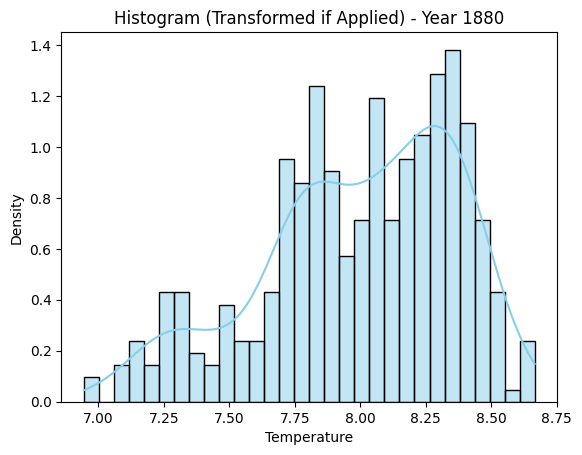

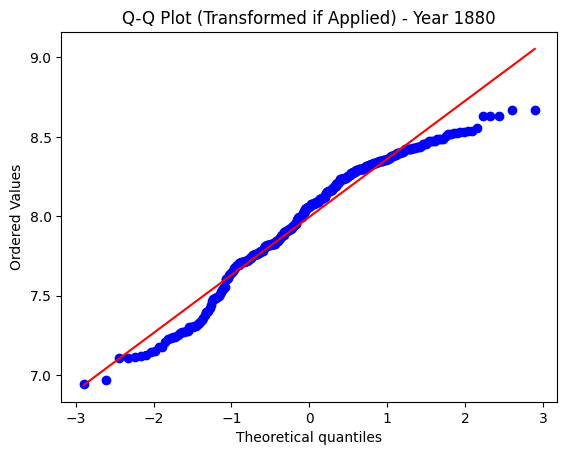


===== Year 1900 =====
Shapiro-Wilk test statistic: 0.9372, p-value: 0.0000
Data is NOT normally distributed. Applying Johnson transformation...

Post-transformation Shapiro-Wilk: stat = 0.9372, p = 0.0000


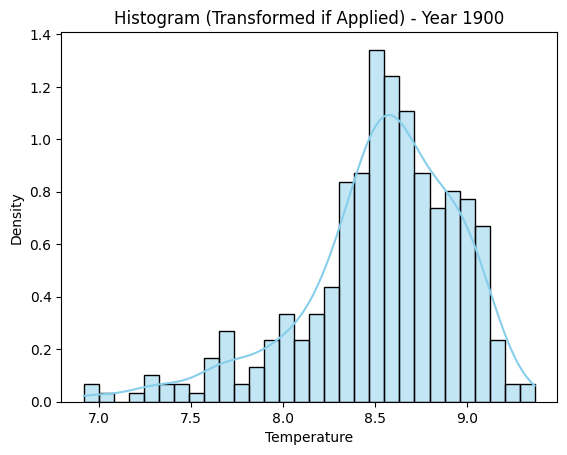

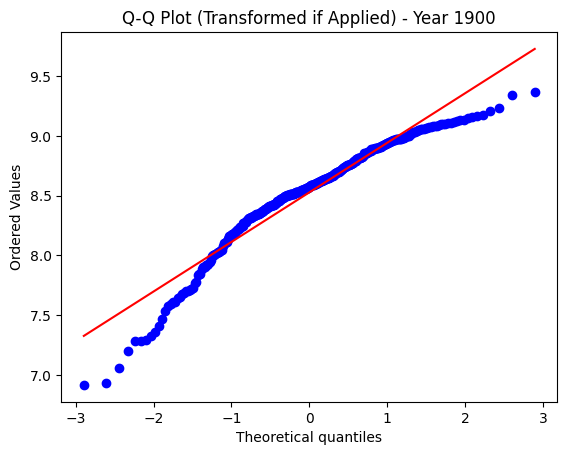


===== Year 1925 =====
Shapiro-Wilk test statistic: 0.9560, p-value: 0.0000
Data is NOT normally distributed. Applying Johnson transformation...

Post-transformation Shapiro-Wilk: stat = 0.9560, p = 0.0000


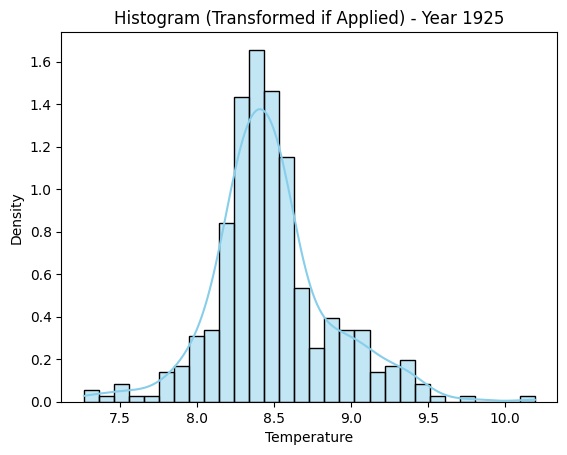

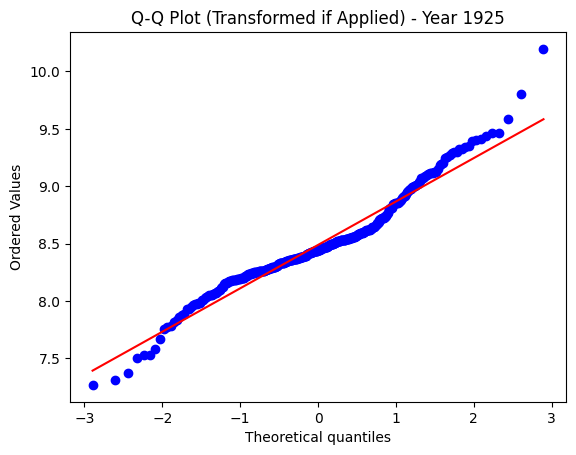


===== Year 1950 =====
Shapiro-Wilk test statistic: 0.9588, p-value: 0.0000
Data is NOT normally distributed. Applying Johnson transformation...

Post-transformation Shapiro-Wilk: stat = 0.9588, p = 0.0000


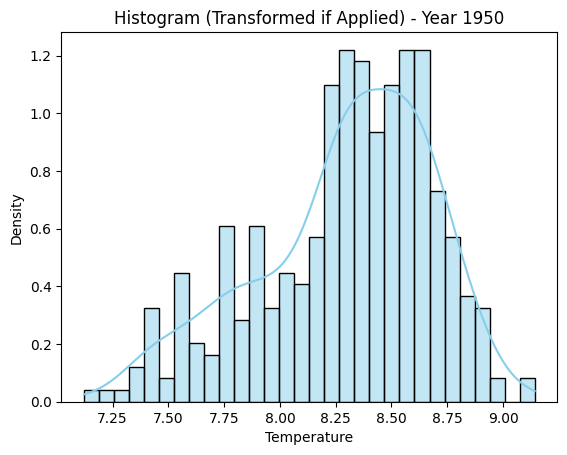

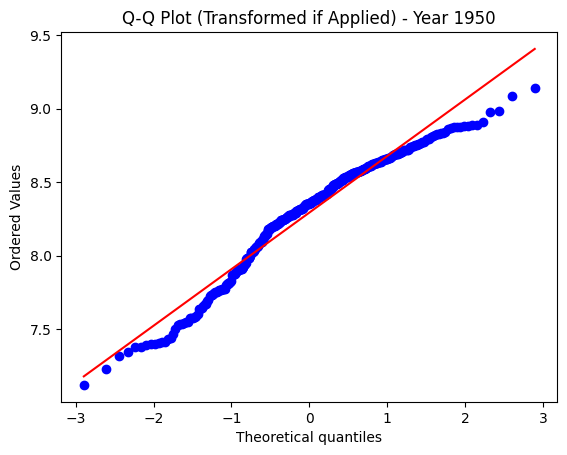


===== Year 1975 =====
Shapiro-Wilk test statistic: 0.9933, p-value: 0.1057
Data appears to be normally distributed.



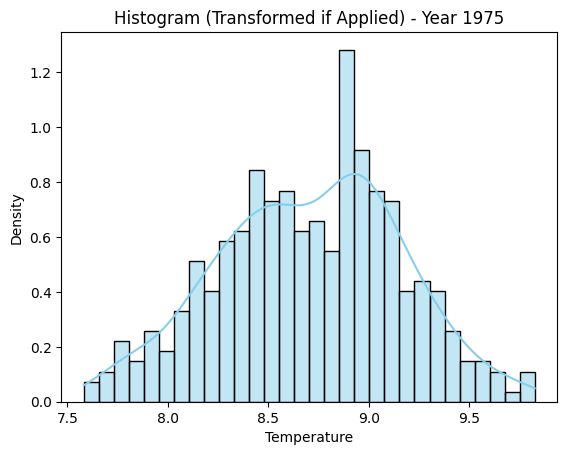

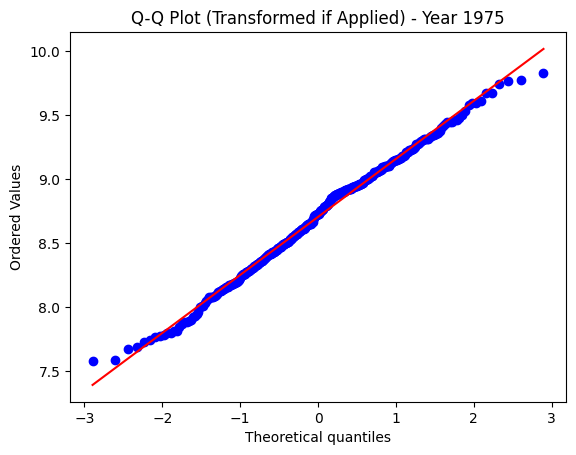


===== Year 2000 =====
Shapiro-Wilk test statistic: 0.9862, p-value: 0.0015
Data is NOT normally distributed. Applying Johnson transformation...

Post-transformation Shapiro-Wilk: stat = 0.9862, p = 0.0015


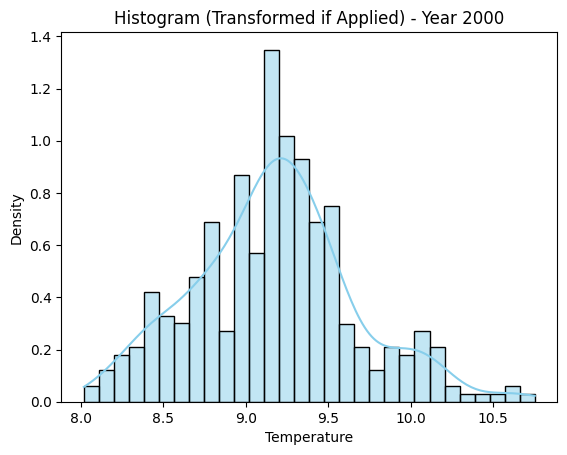

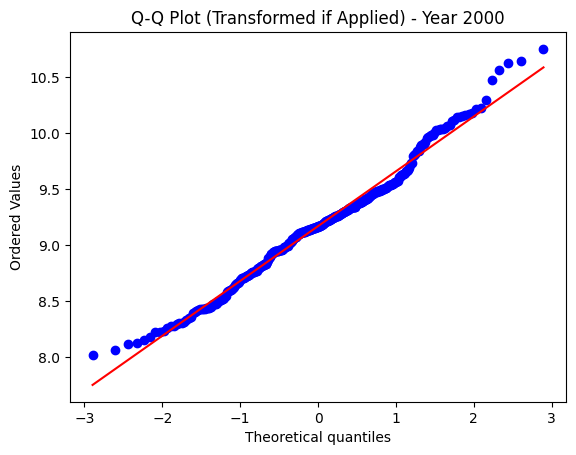


===== Year 2020 =====
Shapiro-Wilk test statistic: 0.9865, p-value: 0.0017
Data is NOT normally distributed. Applying Johnson transformation...

Post-transformation Shapiro-Wilk: stat = 0.9865, p = 0.0017


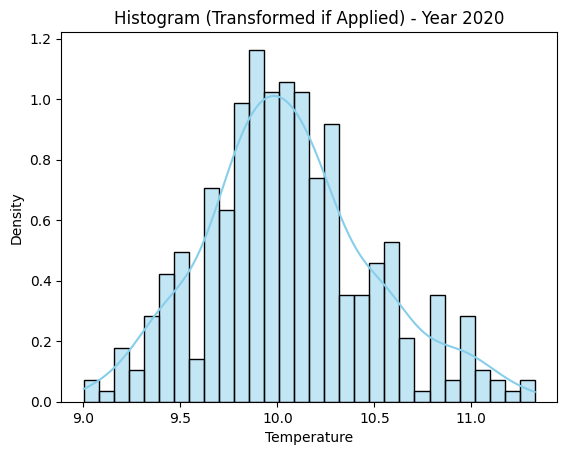

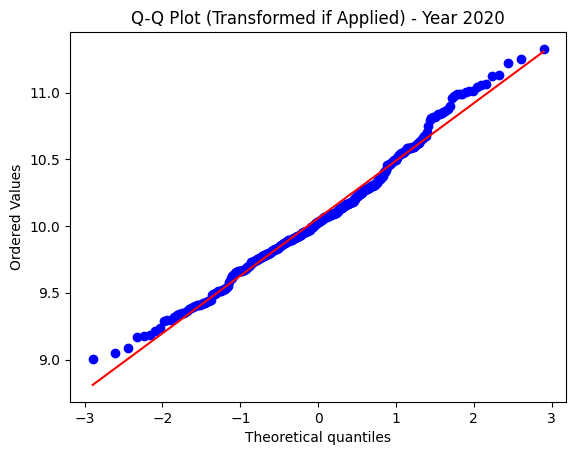

In [7]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy import stats
from scipy.stats import shapiro

# List of years to test
target_years = [1880, 1900, 1925, 1950, 1975, 2000, 2020]

# Iterate through each year
for year in target_years:
    year_data = df[df['Year'] == year]['Temperature'].dropna()
    
    if len(year_data) < 3:
        print(f"Year {year}: Not enough data for testing.")
        continue
    
    print(f"\n===== Year {year} =====")

    # Normality test (Shapiro-Wilk is good for small to medium sample sizes)
    stat, p_value = shapiro(year_data)
    print(f"Shapiro-Wilk test statistic: {stat:.4f}, p-value: {p_value:.4f}")

    if p_value > 0.05:
        print("Data appears to be normally distributed.\n")
        transformed_data = year_data  # No need to transform
    else:
        print("Data is NOT normally distributed. Applying Johnson transformation...\n")
        
        # Fit Johnson SU distribution
        fitted_params = stats.johnsonsu.fit(year_data)
        transformed_data = stats.johnsonsu(*fitted_params).ppf(stats.johnsonsu(*fitted_params).cdf(year_data))

        # Re-test for normality after transformation
        stat_t, p_t = shapiro(transformed_data)
        print(f"Post-transformation Shapiro-Wilk: stat = {stat_t:.4f}, p = {p_t:.4f}")
    
    # Plot the final data (original or transformed)
    sns.histplot(transformed_data, bins=30, kde=True, stat="density", color='skyblue')
    plt.title(f"Histogram (Transformed if Applied) - Year {year}")
    plt.xlabel("Temperature")
    plt.ylabel("Density")
    plt.show()
    
    # Q-Q Plot to visually check normality
    stats.probplot(transformed_data, dist="norm", plot=plt)
    plt.title(f"Q-Q Plot (Transformed if Applied) - Year {year}")
    plt.show()


In [4]:
import pandas as pd
import numpy as np
from scipy import stats

def detect_outliers_std(df, column, threshold=2.5):
    """
    Detects outliers in a DataFrame column based on standard deviations from the mean.

    Args:
        df (pd.DataFrame): The DataFrame to analyze.
        column (str): The name of the column to check for outliers.
        threshold (float): The number of standard deviations from the mean to consider as an outlier.
                         Defaults to 2.5, as used in Hansen et al. (2010).

    Returns:
        pd.DataFrame: A DataFrame containing the outliers and their values.
    """
    mean = df[column].mean()
    std = df[column].std()
    outliers = df[(df[column] > mean + threshold * std) | (df[column] < mean - threshold * std)]
    return outliers

def detect_inconsistent_neighbors(df, column='Temperature', year_col='Year', threshold=2.5):
    """
    Detects data points that are inconsistent with neighboring years based on standard deviations.
    This is a simplified version of the neighbor comparison mentioned in Hansen et al. (2010).

    Args:
        df (pd.DataFrame): The DataFrame to analyze, containing 'Year' and the temperature column.
        column (str): The name of the column to check for inconsistencies (e.g., 'Temperature').
        year_col (str): The name of the year column.
        threshold (float): Threshold for considering a point as inconsistent.

    Returns:
        pd.DataFrame: DataFrame of inconsistent data points.
    """

    df_shifted = df.copy()
    df_shifted['Temp_lag1'] = df_shifted[column].shift(1)
    df_shifted['Temp_lead1'] = df_shifted[column].shift(-1)

    df_shifted['Mean_Neighbor'] = df_shifted[['Temp_lag1', 'Temp_lead1']].mean(axis=1)
    df_shifted['Std_Neighbor'] = df_shifted[['Temp_lag1', 'Temp_lead1']].std(axis=1)

    df_shifted['Outlier_High'] = (df_shifted[column] > df_shifted['Mean_Neighbor'] + threshold * df_shifted['Std_Neighbor'])
    df_shifted['Outlier_Low'] = (df_shifted[column] < df_shifted['Mean_Neighbor'] - threshold * df_shifted['Std_Neighbor'])

    inconsistent_points = df_shifted[(df_shifted['Outlier_High'] == True) | (df_shifted['Outlier_Low'] == True)]

    return inconsistent_points[['Year', column]]  # Return only Year and Temperature



# Example Usage:
# Overall outlier detection
overall_temp_outliers = detect_outliers_std(df1, 'Temperature')
print("Overall Temperature Outliers (Std Dev):\n", overall_temp_outliers)

# Outlier detection by year (e.g., for each year's temperature)
yearly_outliers = df1.groupby('Year').apply(detect_outliers_std, column='Temperature')
print("\nYearly Temperature Outliers (Std Dev):\n", yearly_outliers)

# Detect points inconsistent with neighboring years
inconsistent_neighbor_points = detect_inconsistent_neighbors(df1)
print("\nInconsistent Neighboring Year Points:\n", inconsistent_neighbor_points)

Overall Temperature Outliers (Std Dev):
        Year  Month  Temperature        Year Group         Half Year Group 10
72     1880      3        6.968               NaN   First Half     1880-1889
73     1880      3        6.945               NaN   First Half     1880-1889
1063   1882     11        6.950  (1880.0, 1900.0]   First Half     1880-1889
1064   1882     11        6.921  (1880.0, 1900.0]   First Half     1880-1889
1070   1882     12        6.856  (1880.0, 1900.0]   First Half     1880-1889
...     ...    ...          ...               ...          ...           ...
51964  2022      4       10.816               NaN  Second Half           NaN
51965  2022      4       10.653               NaN  Second Half           NaN
52025  2022      6       10.385               NaN  Second Half           NaN
52030  2022      6       10.394               NaN  Second Half           NaN
52031  2022      6       10.518               NaN  Second Half           NaN

[885 rows x 6 columns]

Yearly Tem

In [60]:
# Extract daily temperature as a NumPy array
temperature = df["Temperature"].dropna().values  # Ensure no missing values

# 1. Create Yₙ series: 1 if Xₙ ≥ Xₙ₋₁, else -1
Y = np.where(temperature[1:] >= temperature[:-1], 1, -1)

# 2. Count how many times temperature increased or stayed the same
increase_or_same_count = np.sum(Y == 1)
total_transitions = len(Y)

print("Total days compared:", total_transitions)
print("Number of times temperature increased or stayed the same (Yₙ = 1):", increase_or_same_count)
print("Proportion of increase or same:", increase_or_same_count / total_transitions)

# 3. Create transition matrix to check Markov property
states = [-1, 1]
transition_counts = pd.DataFrame(0, index=states, columns=states)

for i in range(1, len(Y)):
    prev = Y[i - 1]
    curr = Y[i]
    transition_counts.loc[prev, curr] += 1

transition_probs = transition_counts.div(transition_counts.sum(axis=1), axis=0)

print("\nTransition Matrix (Counts):")
print(transition_counts)

print("\nTransition Matrix (Probabilities):")
print(transition_probs)

# 4. Chi-square test for Markov property
from scipy.stats import chi2_contingency
chi2, p, dof, expected = chi2_contingency(transition_counts)

print(f"\nChi-square test result:")
print(f"Chi2 = {chi2:.4f}, p-value = {p:.4f}")

if p < 0.05:
    print("Conclusion: Reject H0 ⇒ Series may follow a Markov process.")
else:
    print("Conclusion: Fail to reject H0 ⇒ No strong evidence of a Markov process.")


Total days compared: 52076
Number of times temperature increased or stayed the same (Yₙ = 1): 26105
Proportion of increase or same: 0.501286581150626

Transition Matrix (Counts):
       -1      1
-1  15384  10587
 1  10587  15517

Transition Matrix (Probabilities):
          -1         1
-1  0.592353  0.407647
 1  0.405570  0.594430

Chi-square test result:
Chi2 = 1816.0394, p-value = 0.0000
Conclusion: Reject H0 ⇒ Series may follow a Markov process.


In [63]:
import pandas as pd
import numpy as np
from scipy.stats import chi2_contingency

# Load dataset
df = pd.read_csv("C:\\Users\\marat\\OneDrive\\Desktop\\project\\global temperature.csv")

# Convert to datetime and set index
df['Date'] = pd.to_datetime(df[['Year', 'Month', 'Day']])
df.set_index('Date', inplace=True)

# Use only 'Temperature' and drop NA
temperature = df['Temperature'].dropna()

# 1. Create Yₙ series: 1 if Xₙ ≥ Xₙ₋₁ else -1
Y = np.where(temperature[1:].values >= temperature[:-1].values, 1, -1)

# Display first 50 values of Yₙ
print("Yₙ series (first 50 values):")
print(Y[:50])

# Count of increase or same
increase_or_same_count = np.sum(Y == 1)
print("\nNumber of times temperature increased or stayed the same (Yₙ = 1):", increase_or_same_count)
print("Total comparisons:", len(Y))
print("Proportion of increase/same:", increase_or_same_count / len(Y))

# 2. Function to compute transition matrix and perform chi-square test
def markov_analysis(sub_series, label):
    states = [-1, 1]
    trans_counts = pd.DataFrame(0, index=states, columns=states)
    
    for i in range(1, len(sub_series)):
        prev = sub_series[i - 1]
        curr = sub_series[i]
        trans_counts.loc[prev, curr] += 1
    
    trans_probs = trans_counts.div(trans_counts.sum(axis=1), axis=0)
    
    # Chi-square test
    chi2, p, _, _ = chi2_contingency(trans_counts)
    
    print(f"\nYear: {label}")
    print("Transition Count Matrix:")
    print(trans_counts)
    print("Transition Probability Matrix:")
    print(trans_probs)
    print(f"Chi-square: {chi2:.4f}, p-value: {p:.4f}")
    if p < 0.05:
        print("=> Reject H0: Likely Markov dependence")
    else:
        print("=> Fail to reject H0: No strong Markov property evidence")

# 3. Check for full dataset
print("\n===== FULL DATASET ANALYSIS =====")
markov_analysis(Y, "1880–2020")

# 4. Year-wise Markov check
years_to_check = [1880, 1901, 1926, 1951, 1976, 2001, 2020]

for yr in years_to_check:
    temp_year = df[df.index.year == yr]['Temperature'].dropna().values
    if len(temp_year) > 1:
        Yn_year = np.where(temp_year[1:] >= temp_year[:-1], 1, -1)
        markov_analysis(Yn_year, yr)
    else:
        print(f"\nYear {yr}: Not enough data to perform analysis.")


Yₙ series (first 50 values):
[ 1 -1  1 -1 -1  1 -1 -1  1 -1 -1  1  1  1  1  1 -1 -1 -1 -1  1  1 -1 -1
 -1 -1 -1  1  1  1 -1 -1 -1 -1  1 -1 -1  1  1  1  1 -1 -1  1  1  1 -1 -1
  1  1]

Number of times temperature increased or stayed the same (Yₙ = 1): 26105
Total comparisons: 52076
Proportion of increase/same: 0.501286581150626

===== FULL DATASET ANALYSIS =====

Year: 1880–2020
Transition Count Matrix:
       -1      1
-1  15384  10587
 1  10587  15517
Transition Probability Matrix:
          -1         1
-1  0.592353  0.407647
 1  0.405570  0.594430
Chi-square: 1816.0394, p-value: 0.0000
=> Reject H0: Likely Markov dependence

Year: 1880
Transition Count Matrix:
     -1    1
-1  104   75
 1   75  110
Transition Probability Matrix:
          -1         1
-1  0.581006  0.418994
 1  0.405405  0.594595
Chi-square: 10.5325, p-value: 0.0012
=> Reject H0: Likely Markov dependence

Year: 1901
Transition Count Matrix:
    -1   1
-1  81  95
 1  95  92
Transition Probability Matrix:
          -1

In [64]:
import pandas as pd
import numpy as np
from scipy.stats import chi2_contingency

# Load dataset
df = pd.read_csv("C:\\Users\\marat\\OneDrive\\Desktop\\project\\global temperature.csv")
df['Date'] = pd.to_datetime(df[['Year', 'Month', 'Day']])
df.set_index('Date', inplace=True)
temperature = df['Temperature'].dropna()

# Construct Yₙ series: 1 if Xₙ ≥ Xₙ₋₁ else -1
Y = np.where(temperature[1:].values >= temperature[:-1].values, 1, -1)

# Function to compute transition counts and chi-square for a series
def markov_test(sub_series):
    states = [-1, 1]
    trans_counts = pd.DataFrame(0, index=states, columns=states)
    for i in range(1, len(sub_series)):
        trans_counts.loc[sub_series[i-1], sub_series[i]] += 1
    chi2, p, _, _ = chi2_contingency(trans_counts)
    return {
        "(-1→-1)": trans_counts.loc[-1, -1],
        "(-1→1)": trans_counts.loc[-1, 1],
        "(1→-1)": trans_counts.loc[1, -1],
        "(1→1)": trans_counts.loc[1, 1],
        "Chi2": round(chi2, 4),
        "p-value": round(p, 4),
        "Markov": "Yes" if p < 0.05 else "No"
    }

# Check years
years_to_check = [1880, 1901, 1926, 1951, 1976, 2001, 2020]
results = []

for yr in years_to_check:
    temp_year = df[df.index.year == yr]['Temperature'].dropna().values
    if len(temp_year) > 1:
        Yn_year = np.where(temp_year[1:] >= temp_year[:-1], 1, -1)
        result = markov_test(Yn_year)
        result["Year"] = yr
        results.append(result)
    else:
        results.append({
            "Year": yr,
            "(-1→-1)": "NA",
            "(-1→1)": "NA",
            "(1→-1)": "NA",
            "(1→1)": "NA",
            "Chi2": "NA",
            "p-value": "NA",
            "Markov": "Insufficient data"
        })

# Create and display the summary table
summary_df = pd.DataFrame(results)
summary_df = summary_df[["Year", "(-1→-1)", "(-1→1)", "(1→-1)", "(1→1)", "Chi2", "p-value", "Markov"]]

print("\n=== Markov Chain Analysis Summary Table ===")
print(summary_df.to_string(index=False))

# Save as CSV if needed
# summary_df.to_csv("markov_summary_table.csv", index=False)



=== Markov Chain Analysis Summary Table ===
 Year  (-1→-1)  (-1→1)  (1→-1)  (1→1)    Chi2  p-value Markov
 1880      104      75      75    110 10.5325   0.0012    Yes
 1901       81      95      95     92  0.6489   0.4205     No
 1926      113      79      79     92  5.3169   0.0211    Yes
 1951      118      65      65    115 28.0920   0.0000    Yes
 1976      108      72      72    112 15.0297   0.0001    Yes
 2001      115      64      64    120 30.3436   0.0000    Yes
 2020      121      70      71    102 17.2445   0.0000    Yes


     Year  P(Increase)
0    1880     0.508197
1    1881     0.512329
2    1882     0.490411
3    1883     0.506849
4    1884     0.513661
..    ...          ...
138  2018     0.493151
139  2019     0.476712
140  2020     0.475410
141  2021     0.517808
142  2022     0.514151

[143 rows x 2 columns]


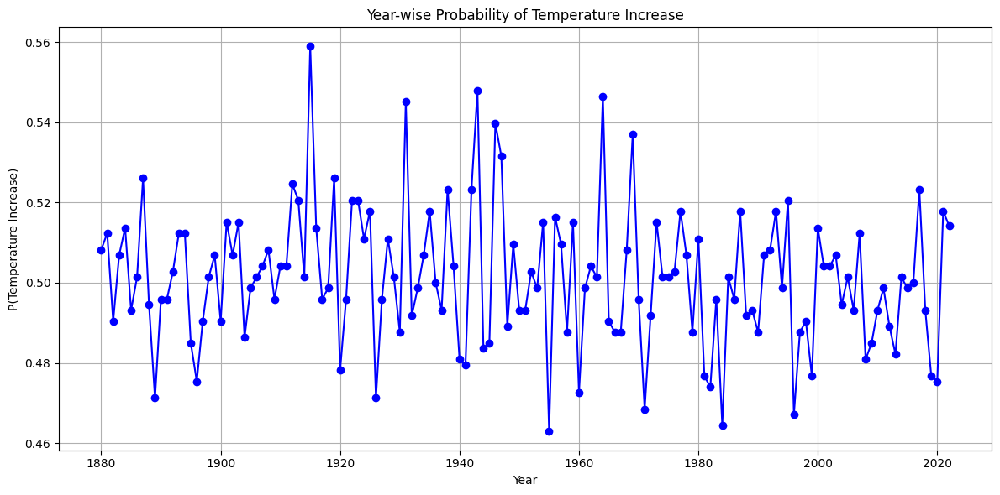

PermissionError: [Errno 13] Permission denied: 'C:\\Users\\marat\\OneDrive\\Desktop\\project\\temperature_increase_probabilities.csv'

In [70]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Load and prepare data
df = pd.read_csv("C:\\Users\\marat\\OneDrive\\Desktop\\project\\global temperature.csv")
df['Date'] = pd.to_datetime(df[['Year', 'Month', 'Day']])
df.set_index('Date', inplace=True)
df = df[['Temperature']].dropna()

# Create Y_n = 1 if increase or equal, else -1
df['Y'] = np.where(df['Temperature'].diff() >= 0, 1, -1)

# Group by year and calculate probability of increase
prob_df = df.groupby(df.index.year)['Y'].agg(
    total='count',
    increases=lambda x: (x == 1).sum()
)
prob_df['P(Increase)'] = prob_df['increases'] / prob_df['total']
prob_df.reset_index(inplace=True)
prob_df.rename(columns={'Date': 'Year'}, inplace=True)

# Display result
print(prob_df[['Year', 'P(Increase)']])

# Optional: plot the probabilities
plt.figure(figsize=(12, 6))
plt.plot(prob_df['Year'], prob_df['P(Increase)'], marker='o', linestyle='-', color='blue')
plt.title("Year-wise Probability of Temperature Increase")
plt.xlabel("Year")
plt.ylabel("P(Temperature Increase)")
plt.grid(True)
plt.tight_layout()
plt.savefig("probability_temperature_increase.jpg", format='jpg', dpi=300)
plt.show()


# Save the result as a CSV file
prob_df[['Year', 'P(Increase)']].to_csv("C:\\Users\\marat\\OneDrive\\Desktop\\project\\temperature_increase_probabilities.csv", index=False)


In [68]:
import pandas as pd
import numpy as np

# Load the dataset
df = pd.read_csv("C:\\Users\\marat\\OneDrive\\Desktop\\project\\global temperature.csv")
df['Date'] = pd.to_datetime(df[['Year', 'Month', 'Day']])
df.set_index('Date', inplace=True)

# Keep only temperature and drop missing values
df = df[['Temperature']].dropna()
df['Year'] = df.index.year

# Create state series: Y = 1 if temp >= previous, -1 if temp < previous
df['Y'] = np.where(df['Temperature'].diff() >= 0, 1, -1)

# Function to compute Transition Probability Matrix
def compute_tpm(y_seq):
    transitions = pd.crosstab(y_seq[:-1], y_seq[1:], normalize='index')
    return transitions

# Function to compute expected second-order transitions
def compute_second_order(y_seq):
    first = pd.crosstab(y_seq[:-1], y_seq[1:], normalize='index')
    second_order = {}
    for i in [-1, 1]:
        for j in [-1, 1]:
            for k in [-1, 1]:
                pij = first.loc[i, j] if (i in first.index and j in first.columns) else 0
                pjk = first.loc[j, k] if (j in first.index and k in first.columns) else 0
                second_order[(i, j, k)] = pij * pjk
    return second_order

# Analyze for 10-year intervals
intervals = [(y, y + 9) for y in range(1880, 2021, 10)]
markov_results = []

for start, end in intervals:
    y_seq = df.loc[(df['Year'] >= start) & (df['Year'] <= end), 'Y'].dropna().values
    if len(y_seq) < 3:
        continue  # Not enough data for second-order test

    tpm = compute_tpm(y_seq)
    second_order_empirical = pd.crosstab([y_seq[:-2], y_seq[1:-1]], y_seq[2:], normalize='index')
    second_order_expected = compute_second_order(y_seq)

    markov_results.append({
        'Interval': f'{start}-{end}',
        'TPM': tpm,
        'SecondOrderEmpirical': second_order_empirical,
        'SecondOrderExpected': second_order_expected
    })

# Format one sample output for inspection
sample_result = markov_results[0]
sample_result['Interval'], sample_result['TPM'], sample_result['SecondOrderEmpirical']


('1880-1889',
 col_0        -1         1
 row_0                    
 -1     0.571193  0.428807
  1     0.425532  0.574468,
 col_0              -1         1
 row_0 row_1                    
 -1    -1     0.537572  0.462428
        1     0.397436  0.602564
  1    -1     0.616667  0.383333
        1     0.446344  0.553656)

## Missing Values: Check for missing or inconsistent records.

## Outlier Detection: Boxplots and IQR method.

## Trend Analysis: Moving averages, seasonal decomposition.

## Visualization:

### 1.Time series plots for different periods.

### 2.Rolling mean and standard deviation.

### 3. Histogram of temperature anomalies.

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 51349 entries, 0 to 51348
Data columns (total 8 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Year          51349 non-null  int64  
 1   Month         51349 non-null  int64  
 2   Day           51349 non-null  int64  
 3   Day of Year   51349 non-null  int64  
 4   Anomaly       51349 non-null  float64
 5   Temperature   51349 non-null  float64
 6   Rolling_Mean  50985 non-null  float64
 7   Rolling_Std   50985 non-null  float64
dtypes: float64(4), int64(4)
memory usage: 3.1 MB
None
   Year  Month  Day  Day of Year  Anomaly  Temperature  Rolling_Mean  \
0  1881     12   29          363    0.232        8.822           NaN   
1  1881     12   30          364   -0.015        8.575           NaN   
2  1881     12   31          365    0.013        8.603           NaN   
3  1882      1    1            1    0.020        8.610           NaN   
4  1882      1    2            2   -0.043      

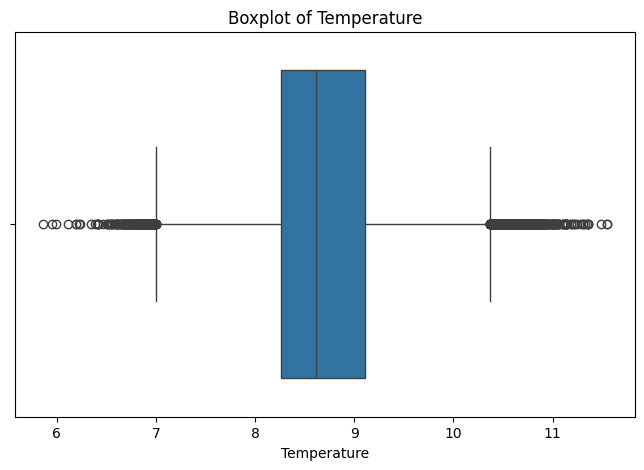

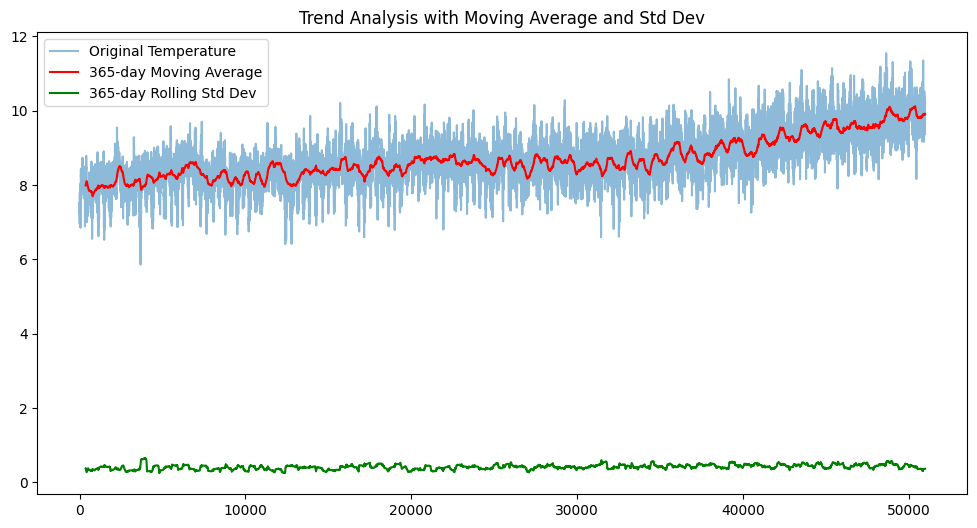

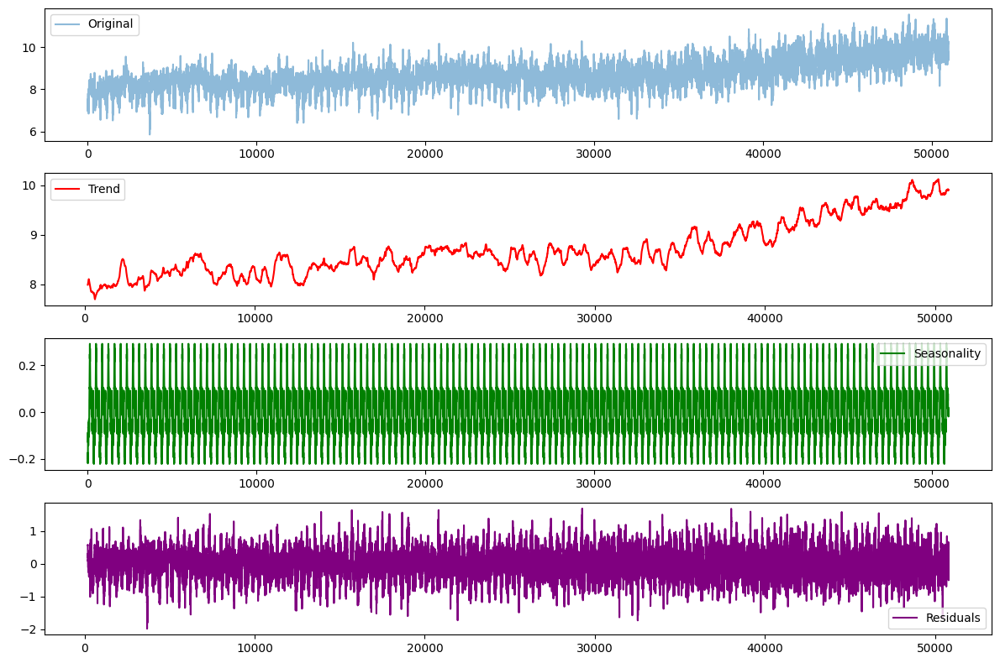

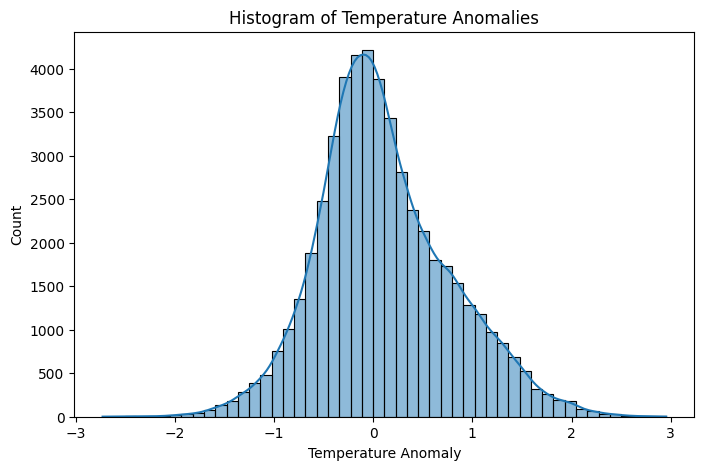

In [12]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.tsa.seasonal import seasonal_decompose



# Display basic info
print(df.info())
print(df.head())

# Check for missing values
missing_values = df.isnull().sum()
print("Missing Values:\n", missing_values)

# Handling missing values (if any)
df.dropna(inplace=True)  # Remove missing records
df.reset_index(drop=True, inplace=True)

# Outlier Detection using IQR
Q1 = df['Temperature'].quantile(0.25)
Q3 = df['Temperature'].quantile(0.75)
IQR = Q3 - Q1

lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

outliers = df[(df['Temperature'] < lower_bound) | (df['Temperature'] > upper_bound)]
print(f"Number of Outliers: {len(outliers)}")

# Boxplot for outlier visualization
plt.figure(figsize=(8, 5))
sns.boxplot(x=df['Temperature'])
plt.title("Boxplot of Temperature")
plt.show()

# Trend Analysis using Moving Average
df['Rolling_Mean'] = df['Temperature'].rolling(window=365).mean()
df['Rolling_Std'] = df['Temperature'].rolling(window=365).std()

plt.figure(figsize=(12, 6))
plt.plot(df['Temperature'], label="Original Temperature", alpha=0.5)
plt.plot(df['Rolling_Mean'], label="365-day Moving Average", color='red')
plt.plot(df['Rolling_Std'], label="365-day Rolling Std Dev", color='green')
plt.title("Trend Analysis with Moving Average and Std Dev")
plt.legend()
plt.show()

# Seasonal Decomposition
decomposition = seasonal_decompose(df['Temperature'], period=365, model='additive')

plt.figure(figsize=(12, 8))
plt.subplot(411)
plt.plot(df['Temperature'], label="Original", alpha=0.5)
plt.legend()

plt.subplot(412)
plt.plot(decomposition.trend, label="Trend", color='red')
plt.legend()

plt.subplot(413)
plt.plot(decomposition.seasonal, label="Seasonality", color='green')
plt.legend()

plt.subplot(414)
plt.plot(decomposition.resid, label="Residuals", color='purple')
plt.legend()

plt.tight_layout()
plt.show()

# Histogram of temperature anomalies
plt.figure(figsize=(8, 5))
sns.histplot(df['Anomaly'], bins=50, kde=True)
plt.title("Histogram of Temperature Anomalies")
plt.xlabel("Temperature Anomaly")
plt.show()


Linear Regression Trend Slope: 0.011487


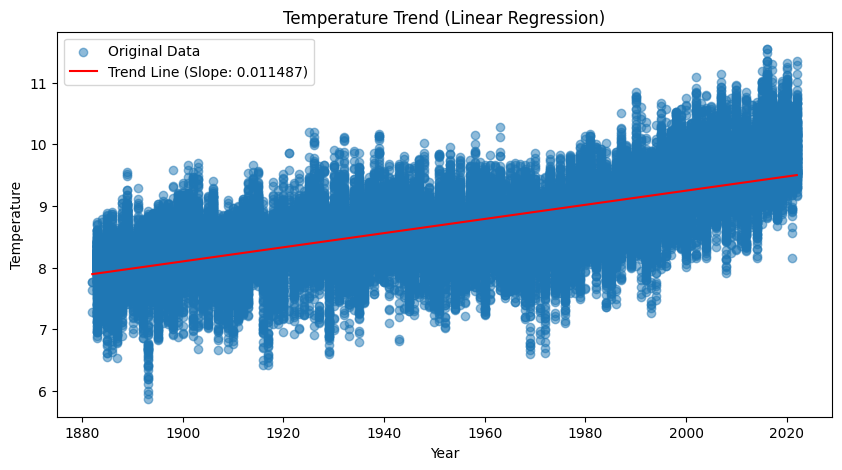

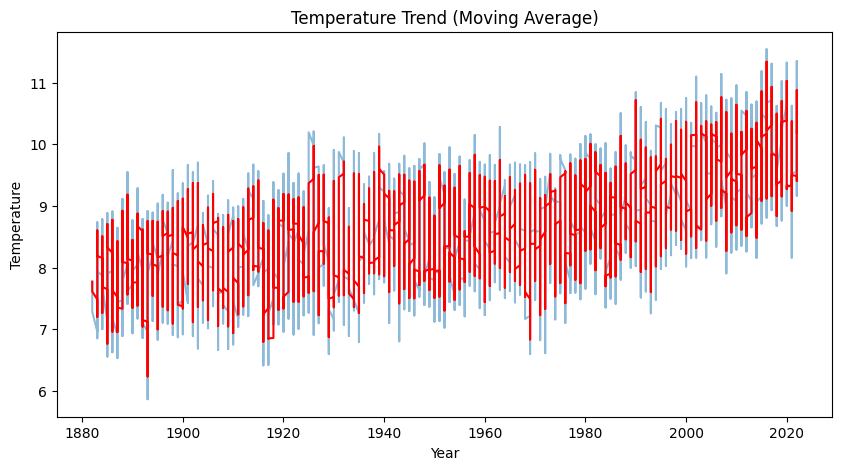

ADF Statistic: -9.437660805688283
p-value: 4.991882507815218e-16
Linear Regression Slope: 0.011487
ADF Test p-value: 0.000000


In [15]:

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import theilslopes
from sklearn.linear_model import LinearRegression
from statsmodels.tsa.stattools import adfuller
import pymannkendall as mk

X = df[['Year']].values.reshape(-1, 1)
y = df['Temperature'].values

model = LinearRegression()
model.fit(X, y)

trend_slope = model.coef_[0]
intercept = model.intercept_
print(f"Linear Regression Trend Slope: {trend_slope:.6f}")

# Plot the trend line
plt.figure(figsize=(10, 5))
plt.scatter(df['Year'], df['Temperature'], label="Original Data", alpha=0.5)
plt.plot(df['Year'], model.predict(X), color='red', label=f"Trend Line (Slope: {trend_slope:.6f})")
plt.xlabel("Year")
plt.ylabel("Temperature")
plt.title("Temperature Trend (Linear Regression)")
plt.legend()
plt.show()




df['Rolling_Mean'] = df['Temperature'].rolling(window=10, min_periods=1).mean()

plt.figure(figsize=(10, 5))
plt.plot(df['Year'], df['Temperature'], label="Original Data", alpha=0.5)
plt.plot(df['Year'], df['Rolling_Mean'], label="10-Year Moving Average", color='red')
plt.xlabel("Year")
plt.ylabel("Temperature")
plt.title("Temperature Trend (Moving Average)")
plt.show()



adf_test = adfuller(df['Temperature'])
print(f"ADF Statistic: {adf_test[0]}")
print(f"p-value: {adf_test[1]}")


methods = {
    "Linear Regression Slope": trend_slope,
    "ADF Test p-value": adf_test[1]
}

for method, value in methods.items():
    print(f"{method}: {value:.6f}")


Analyzing period: 1880-1890
Number of Outliers: 69


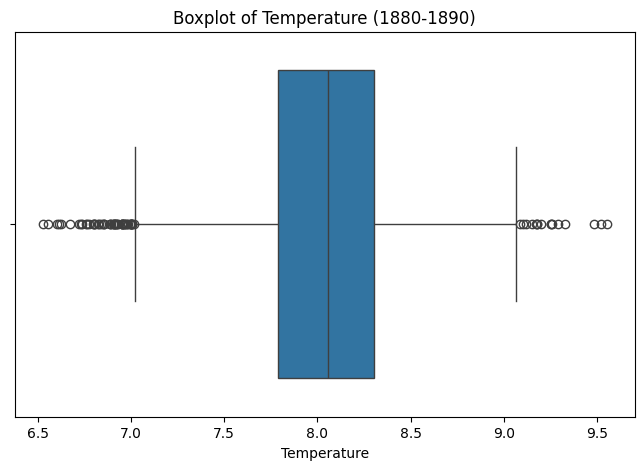

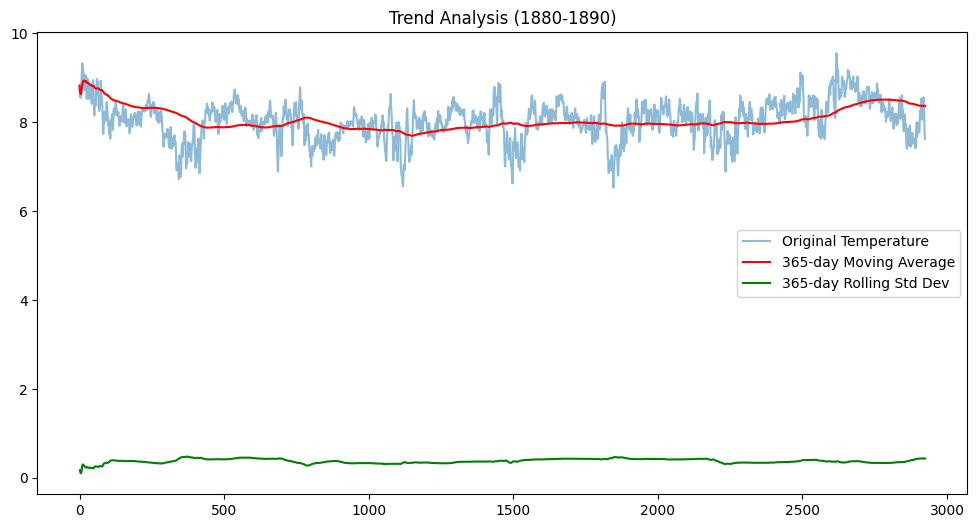

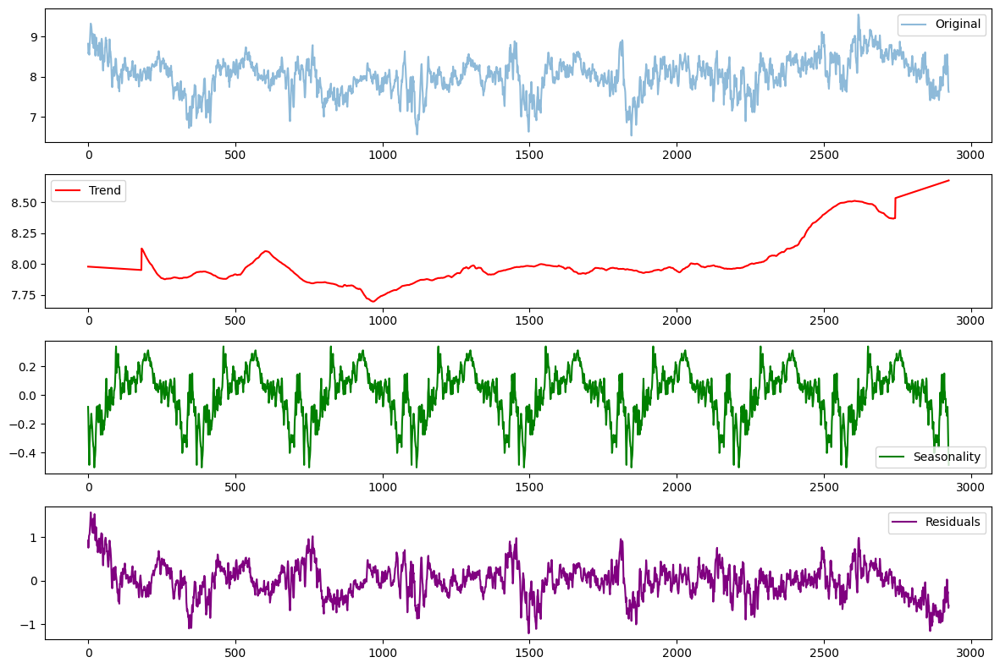

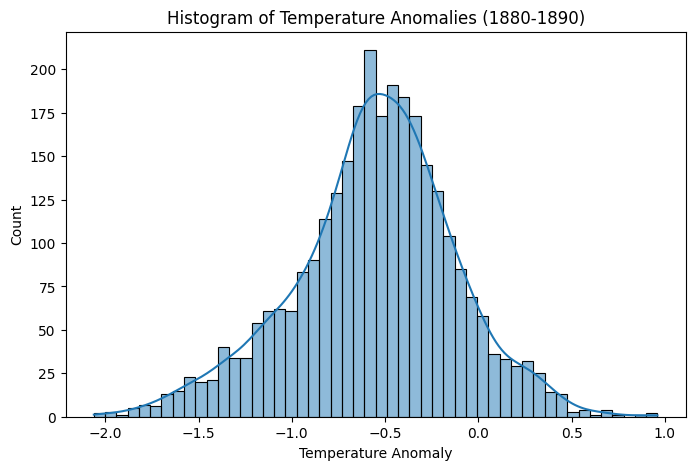

Analyzing period: 1890-1900
Number of Outliers: 137


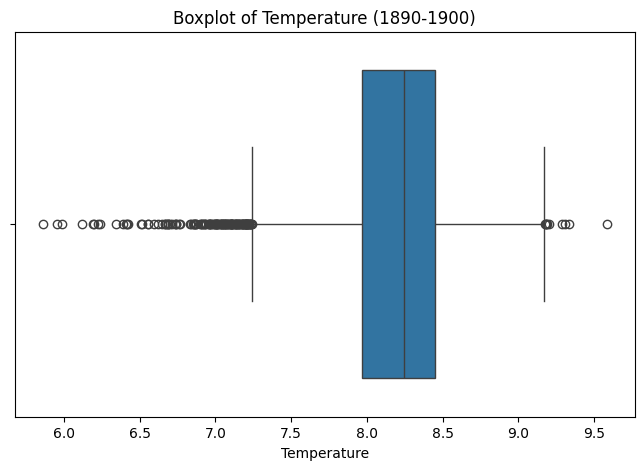

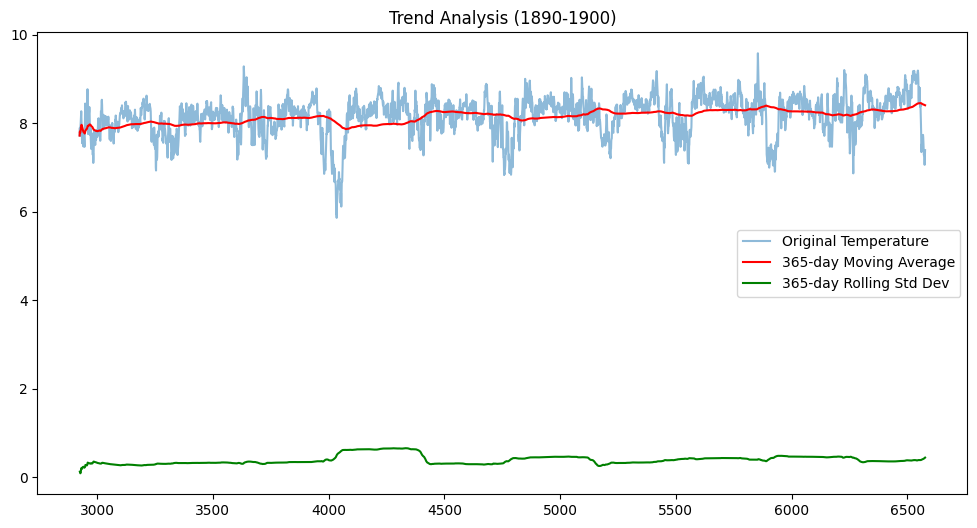

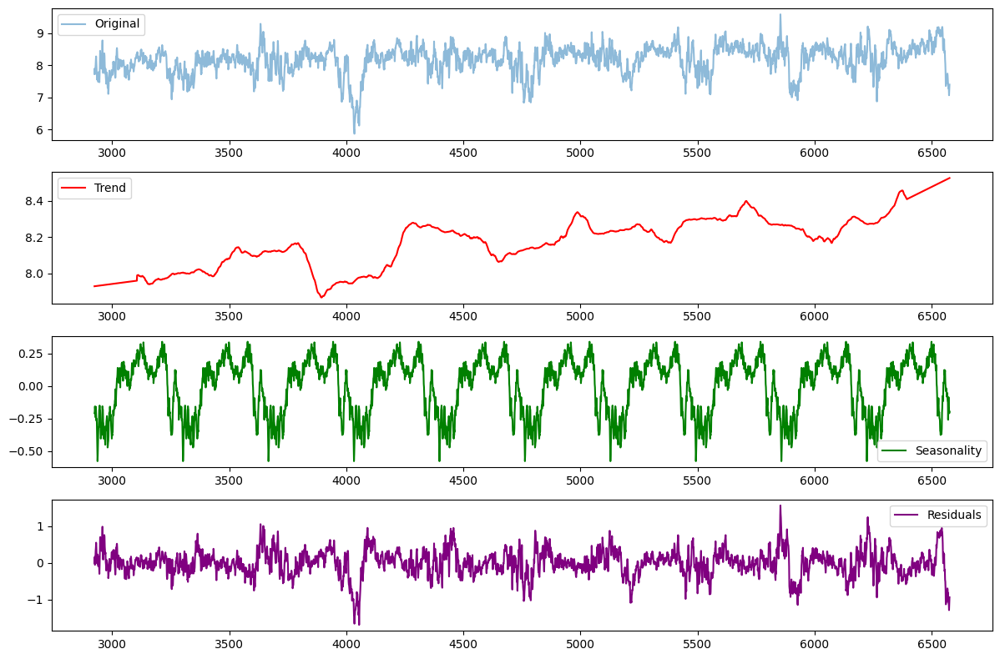

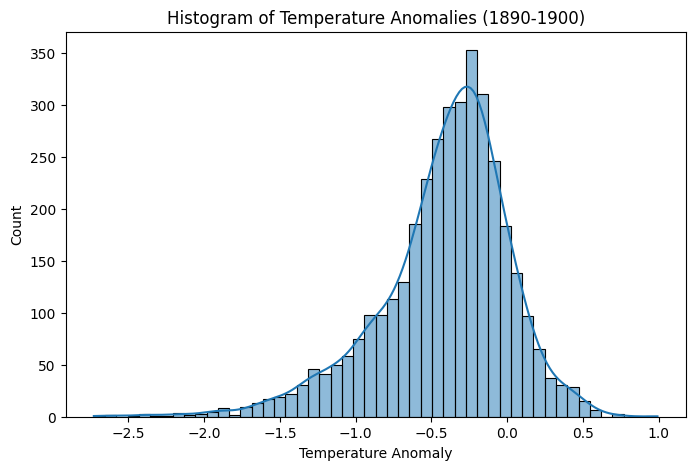

Analyzing period: 1900-1910
Number of Outliers: 105


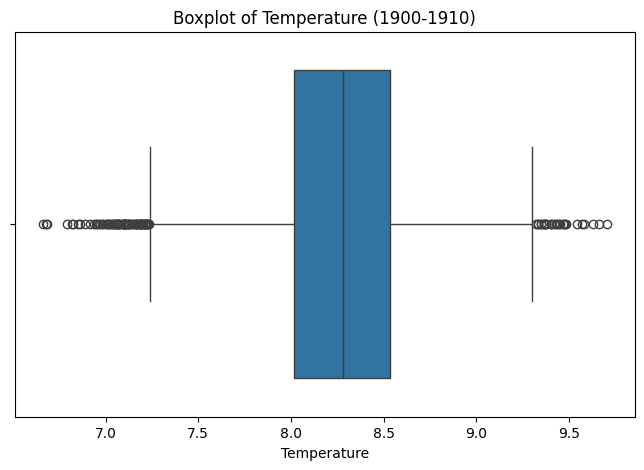

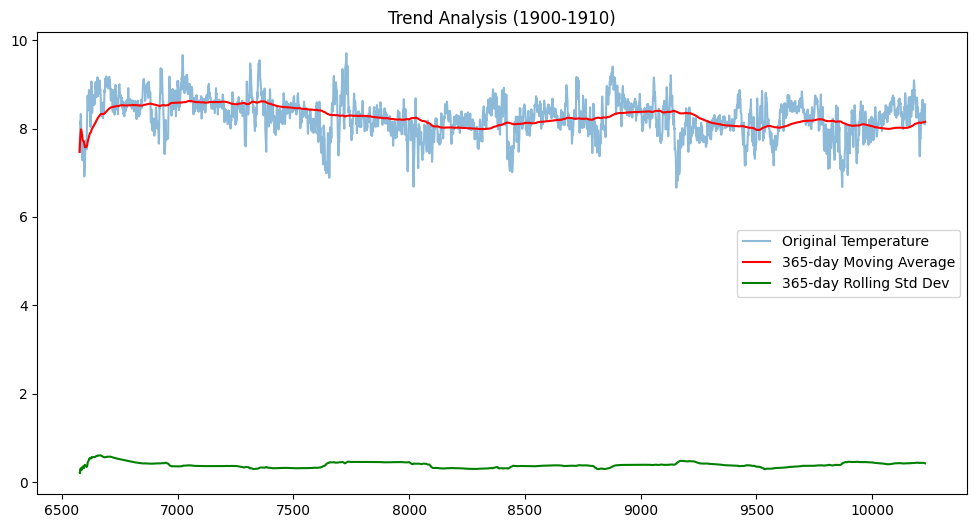

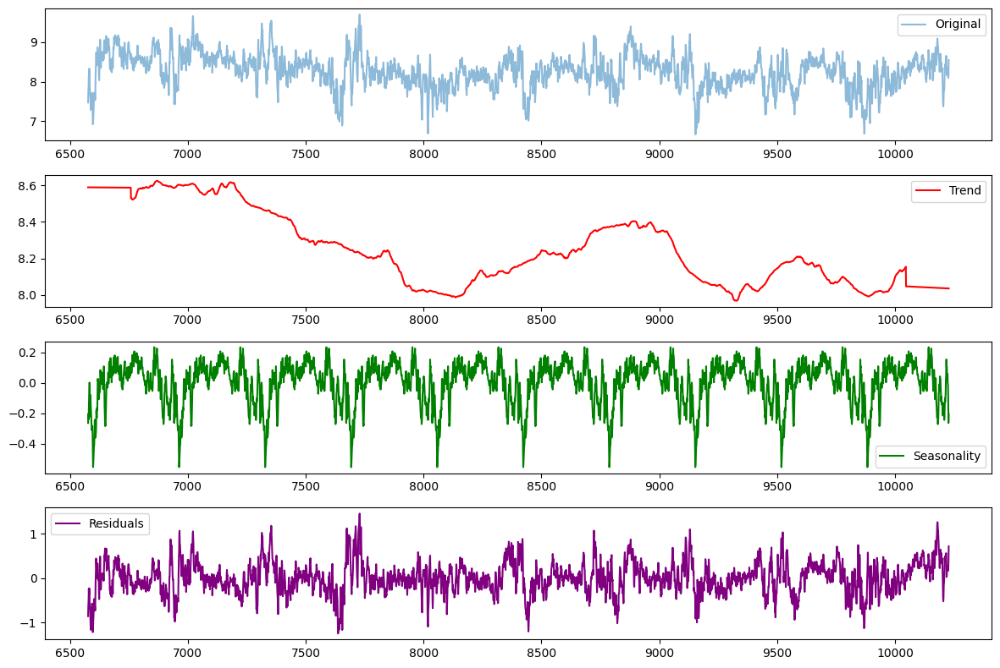

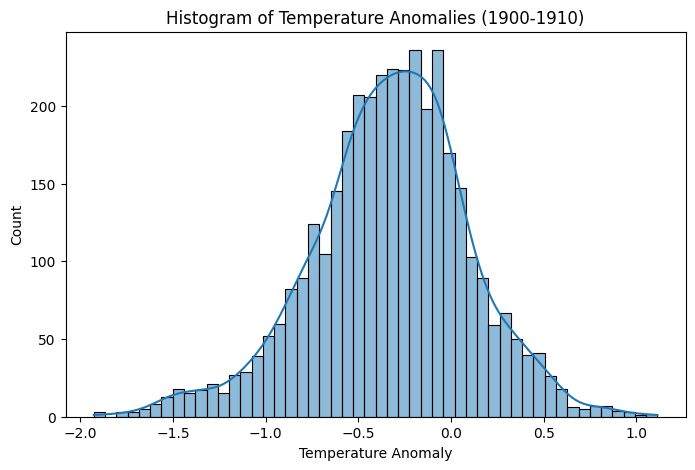

Analyzing period: 1910-1920
Number of Outliers: 88


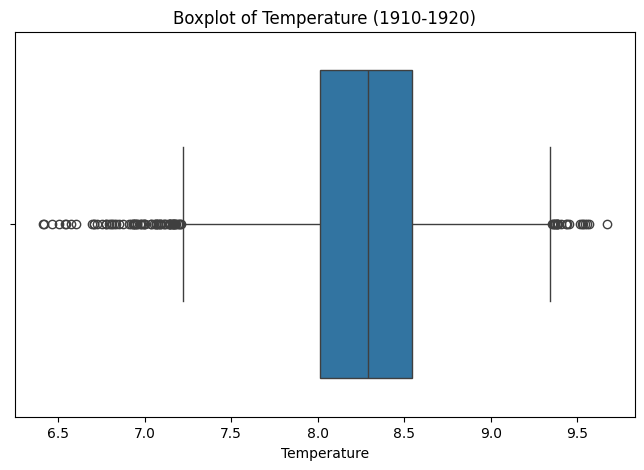

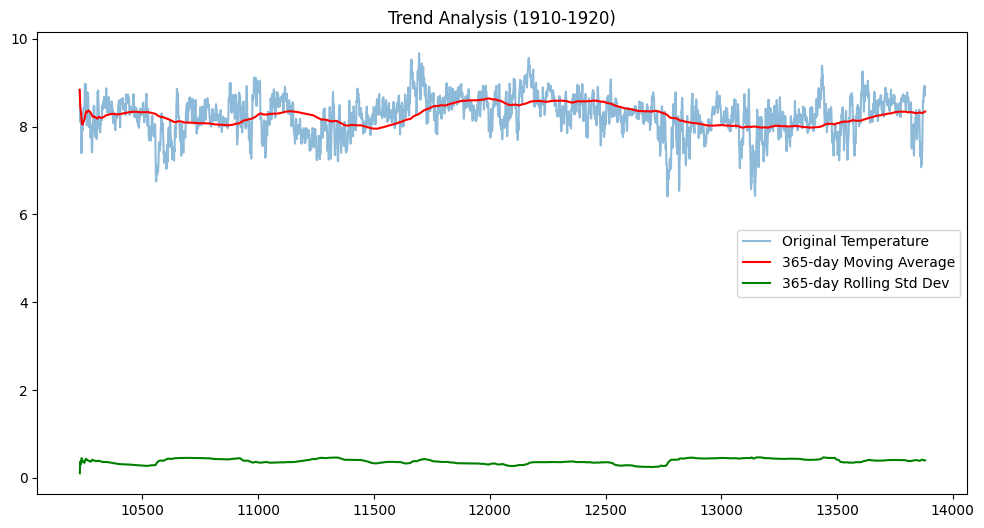

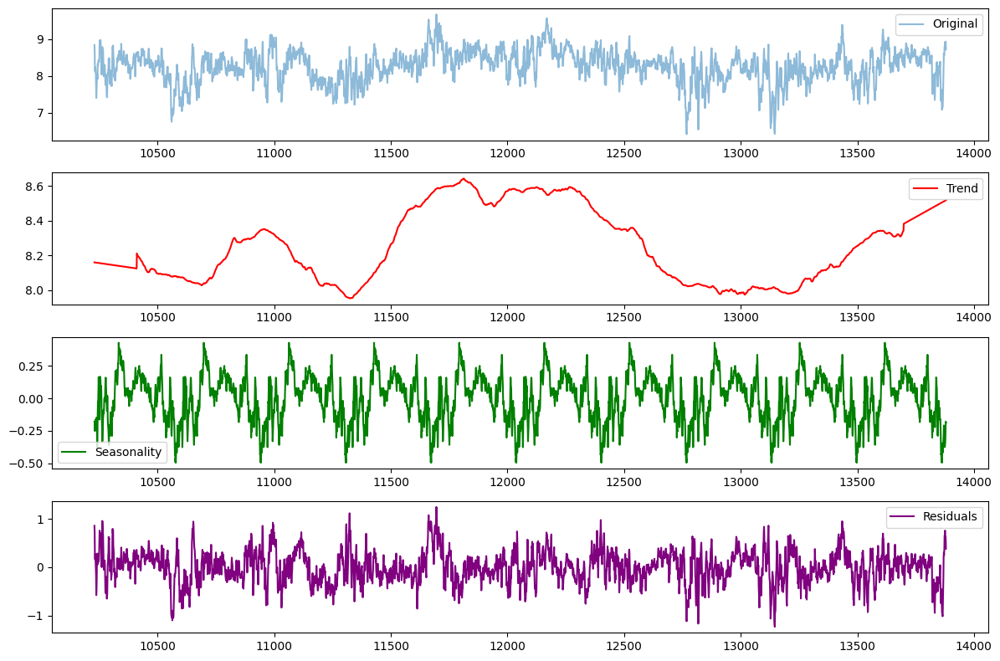

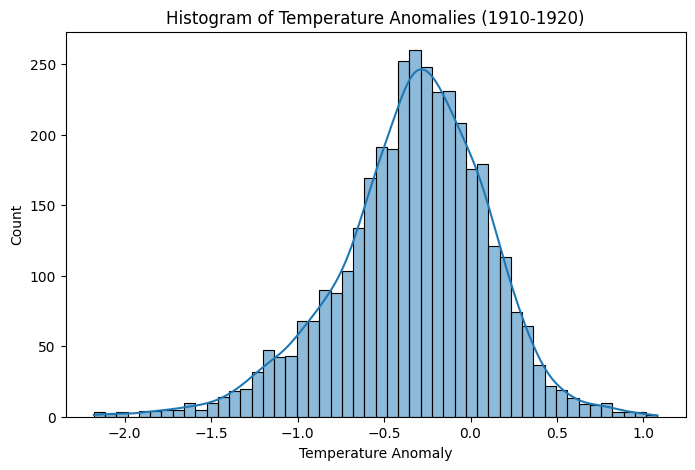

Analyzing period: 1920-1930
Number of Outliers: 236


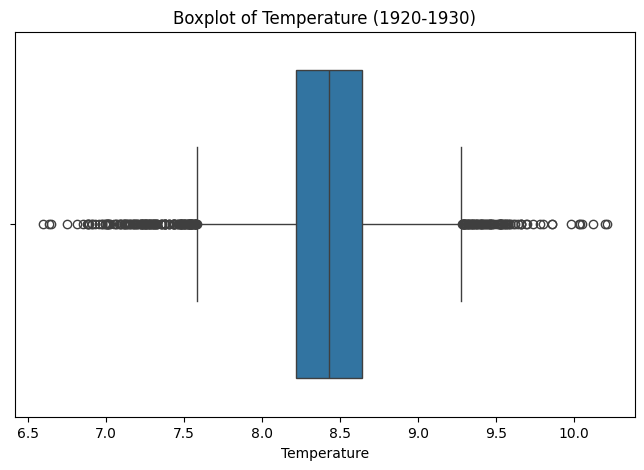

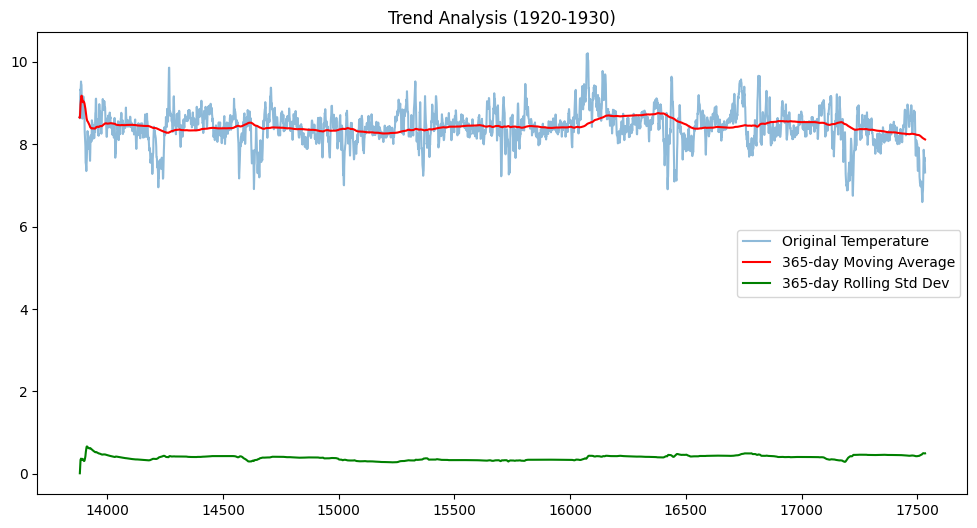

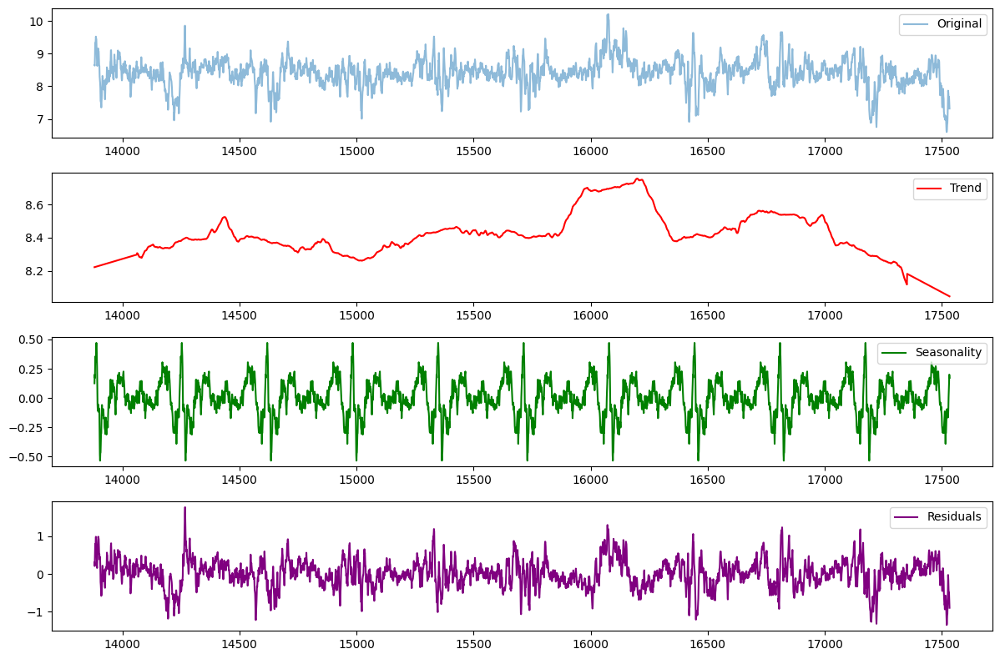

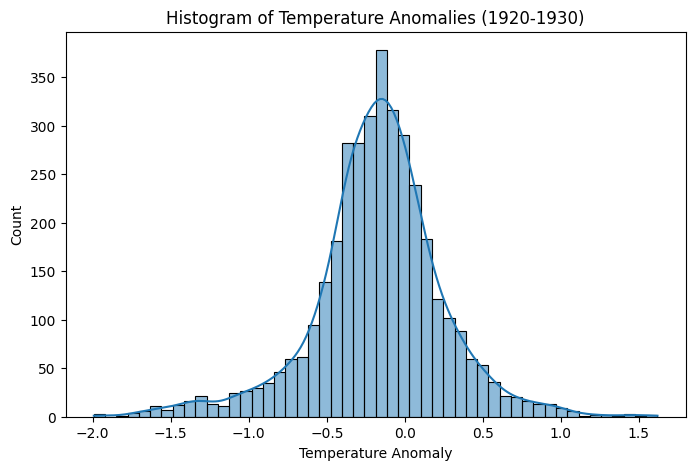

Analyzing period: 1930-1940
Number of Outliers: 121


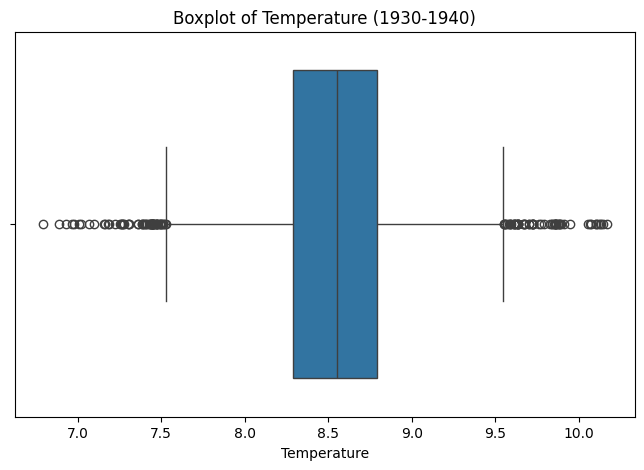

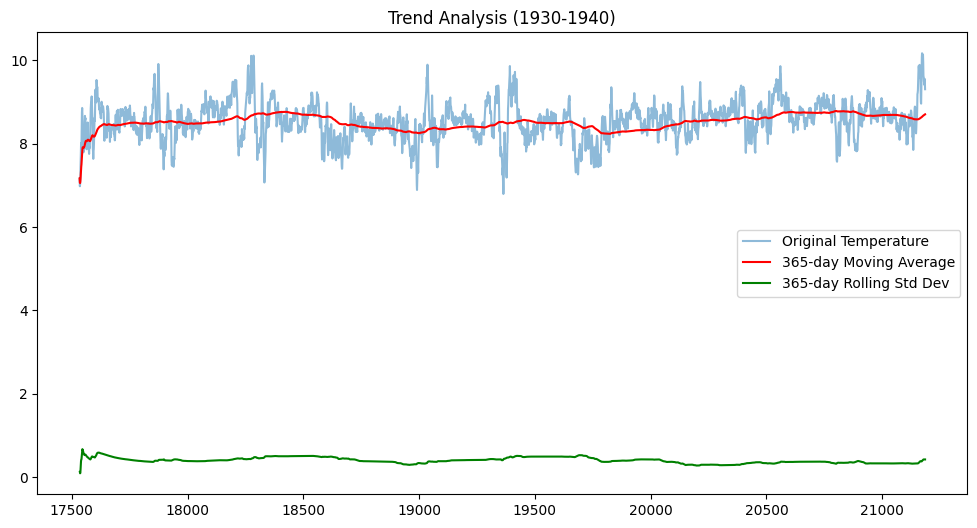

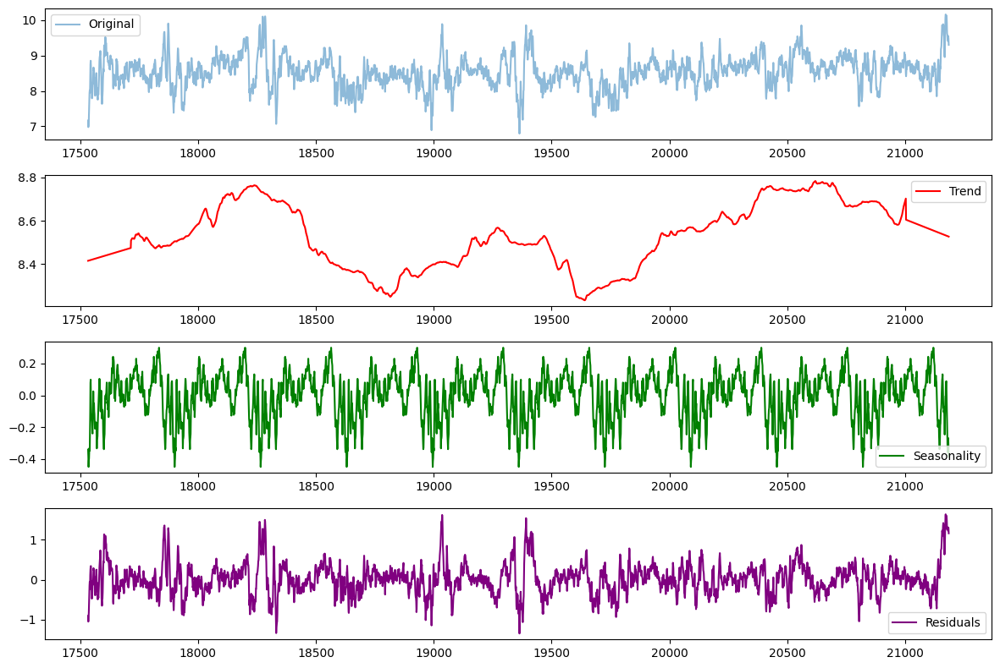

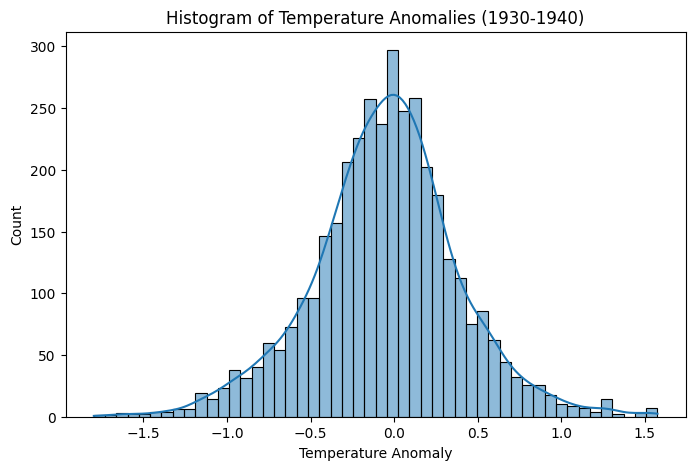

Analyzing period: 1940-1950
Number of Outliers: 120


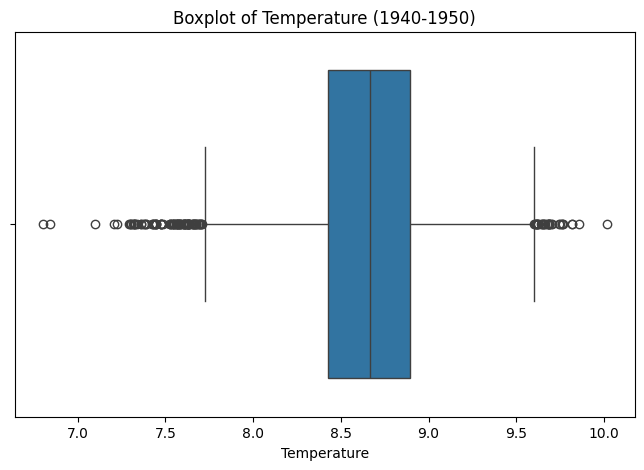

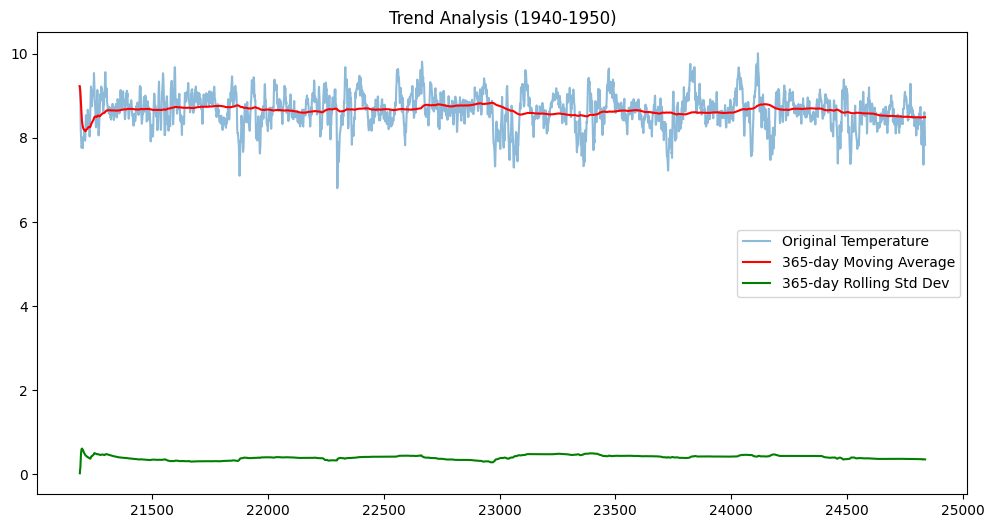

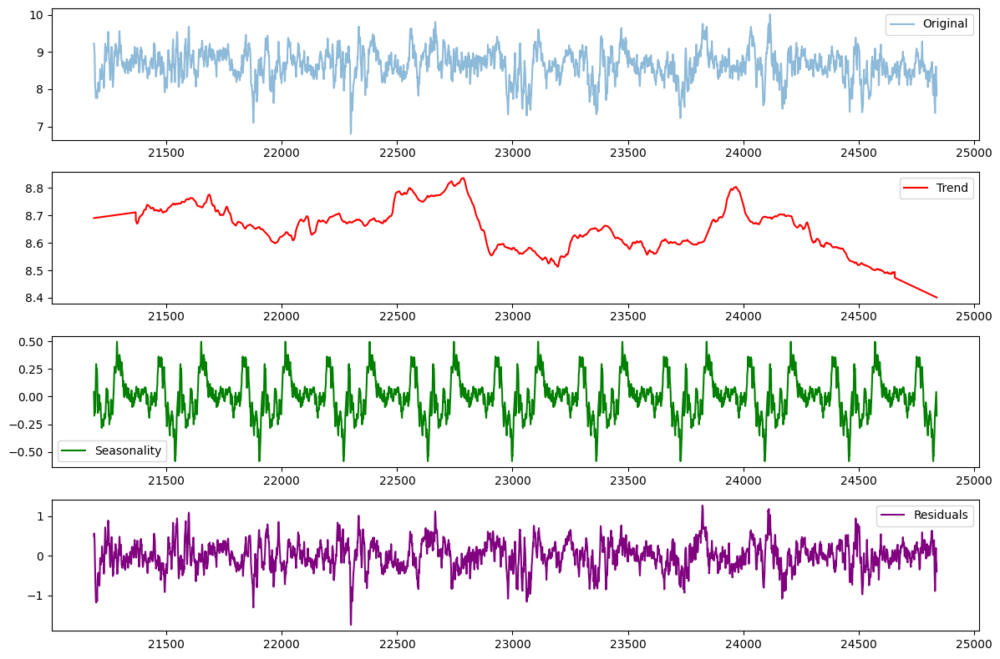

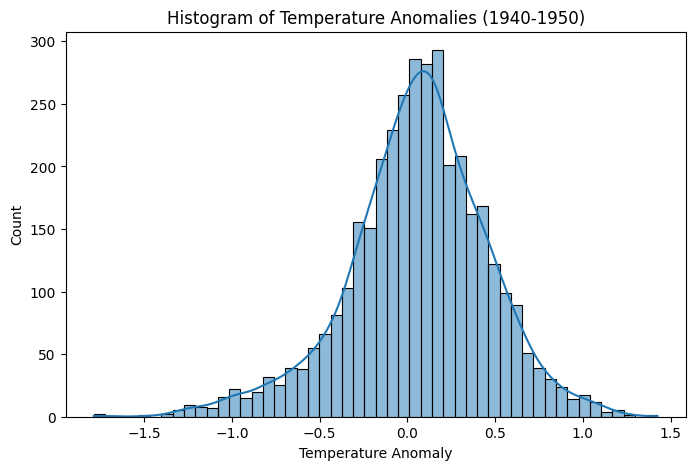

Analyzing period: 1950-1960
Number of Outliers: 52


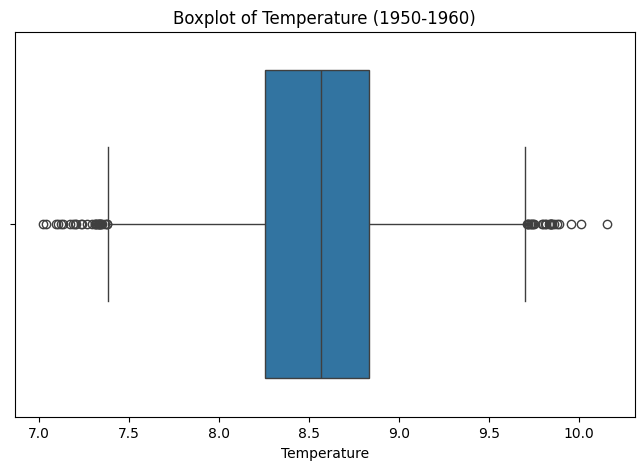

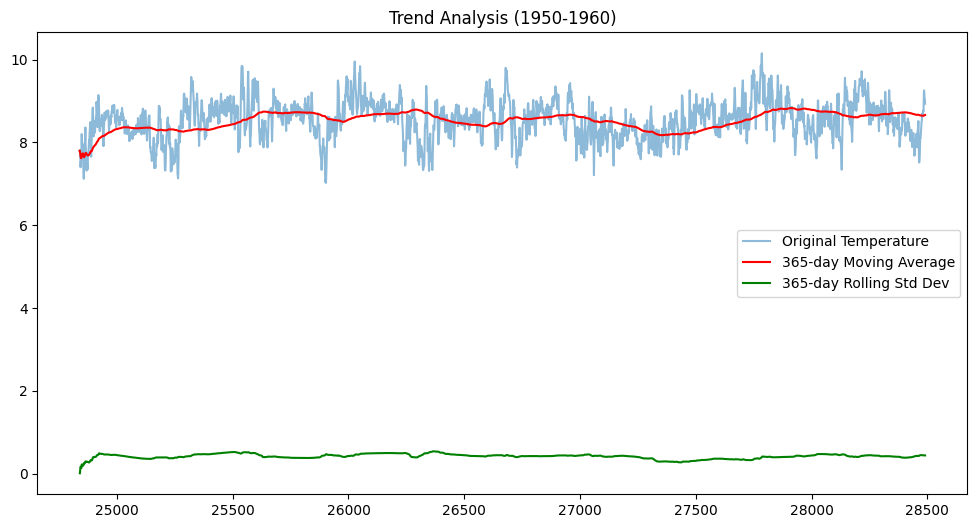

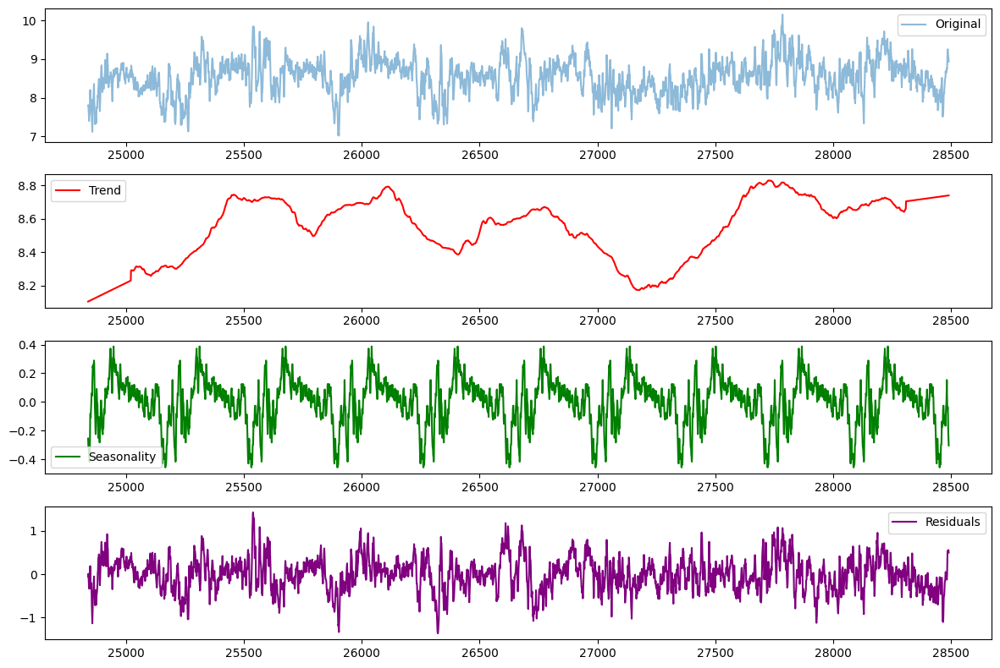

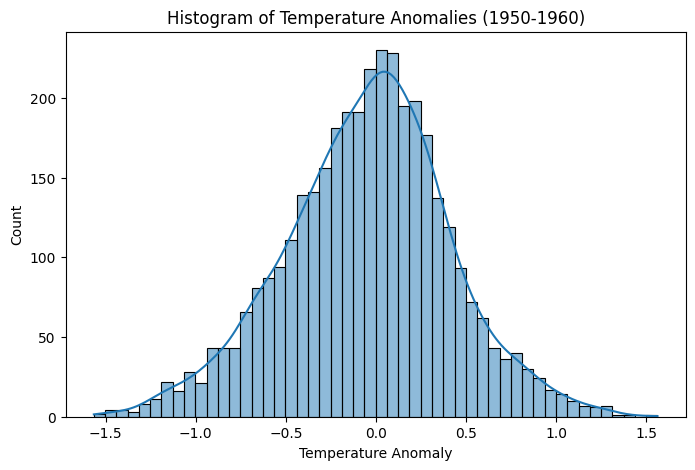

Analyzing period: 1960-1970
Number of Outliers: 33


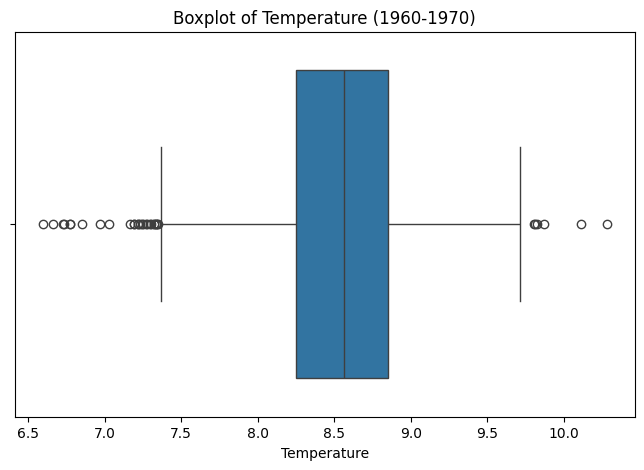

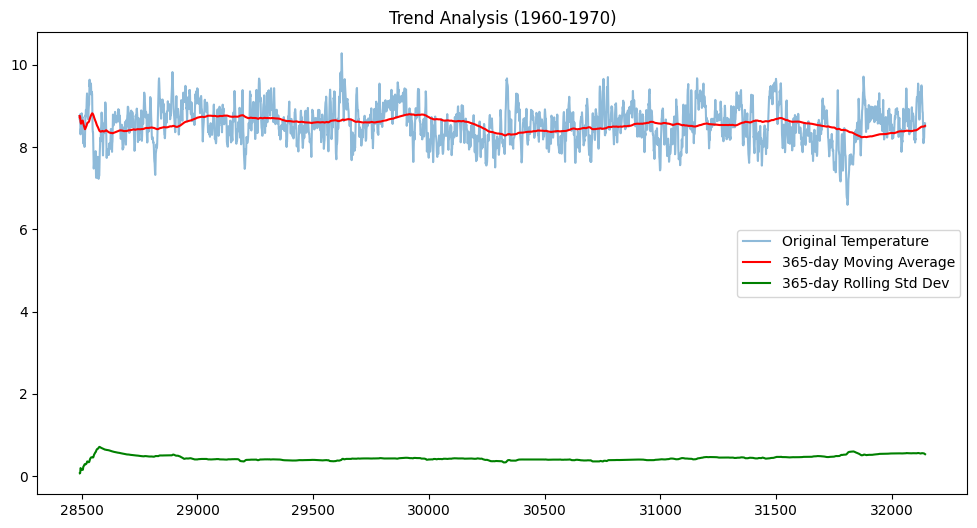

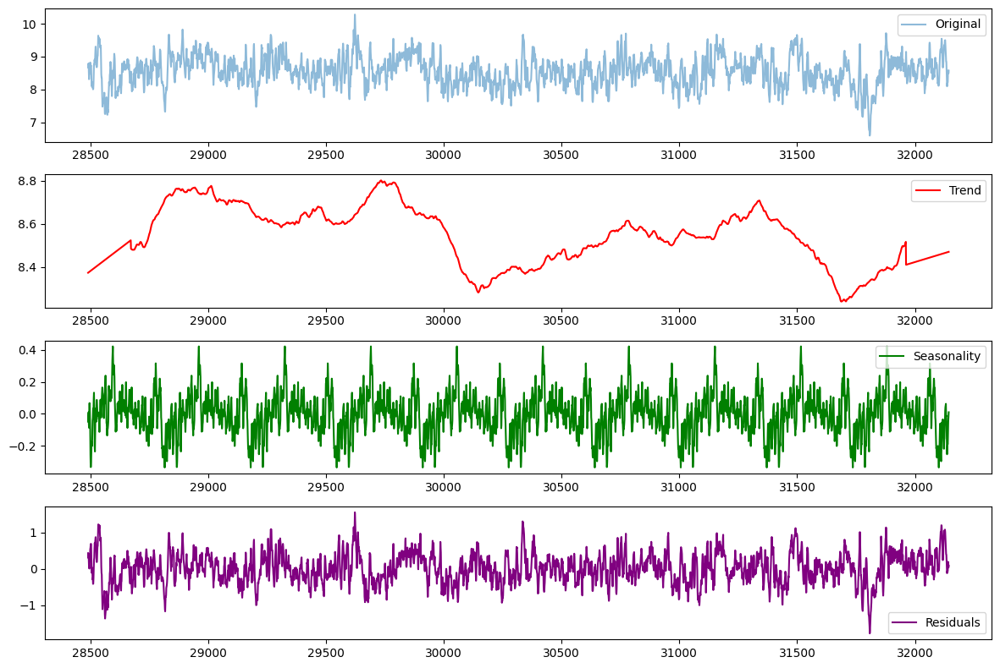

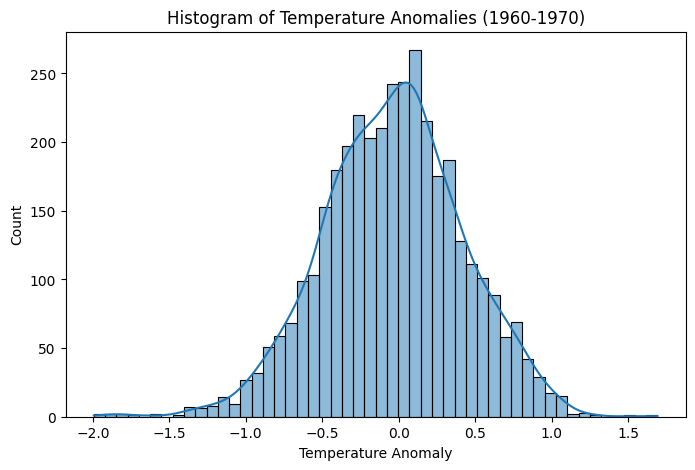

Analyzing period: 1970-1980
Number of Outliers: 50


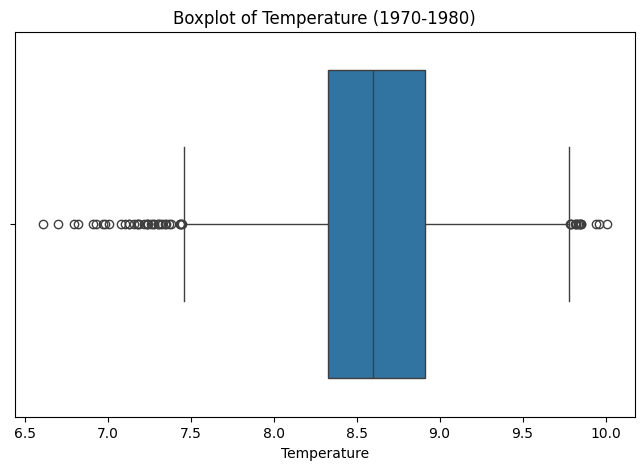

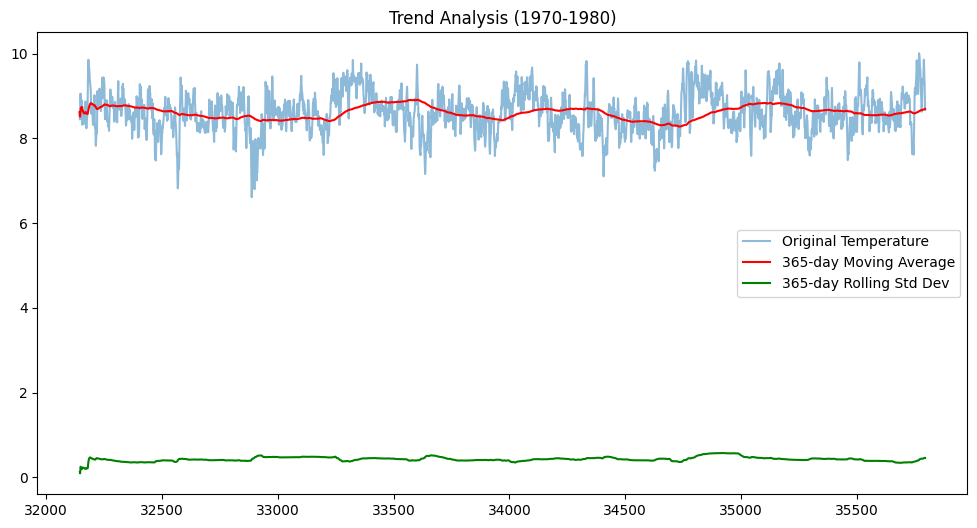

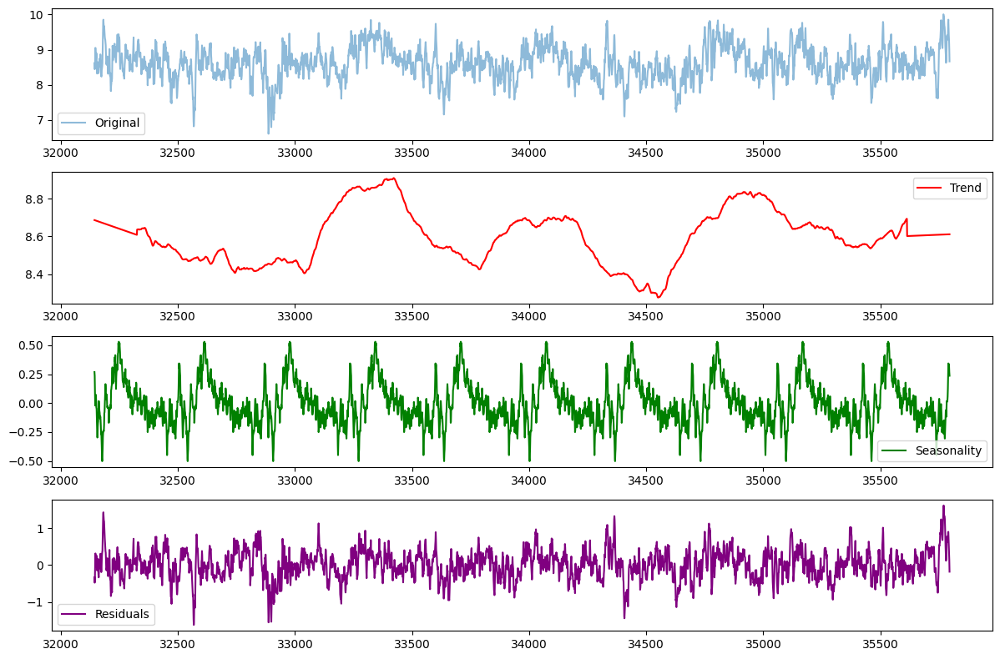

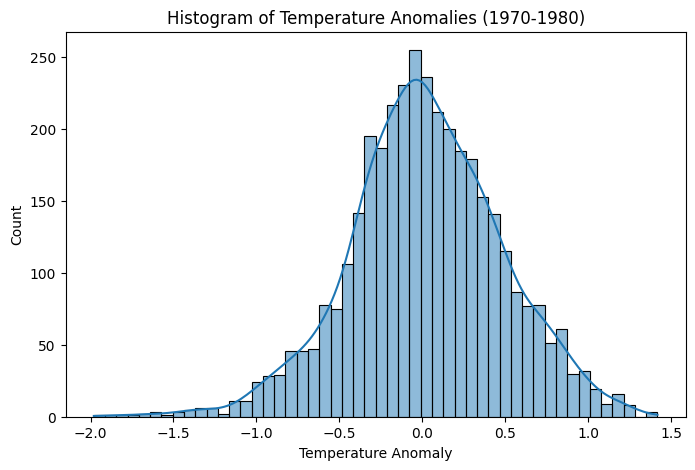

Analyzing period: 1980-1990
Number of Outliers: 17


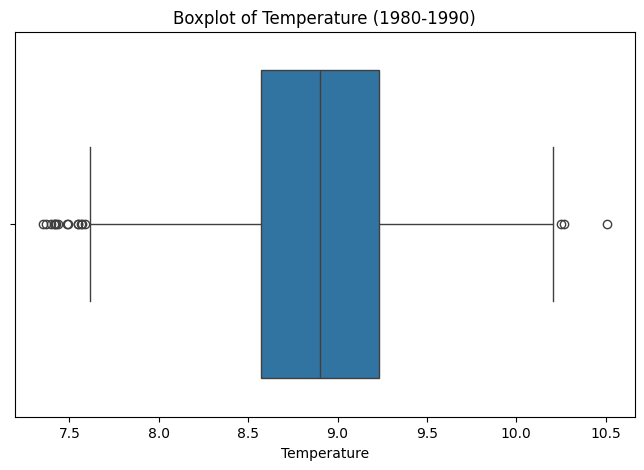

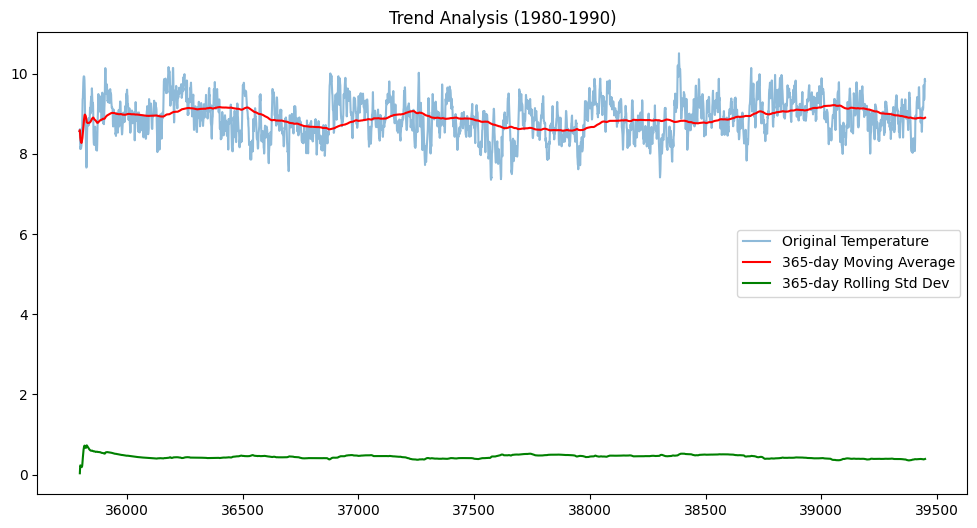

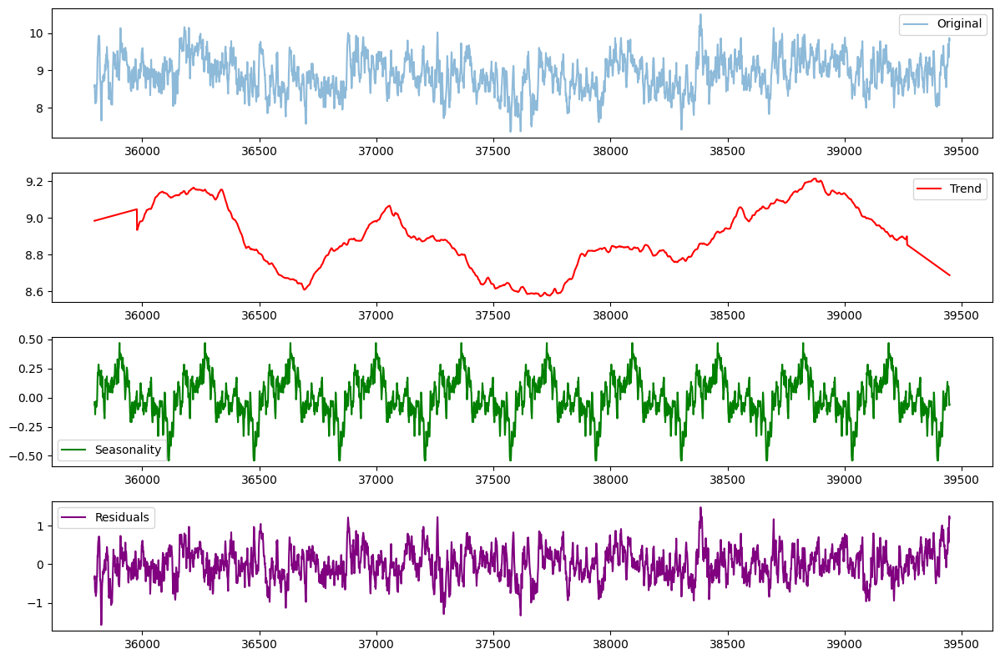

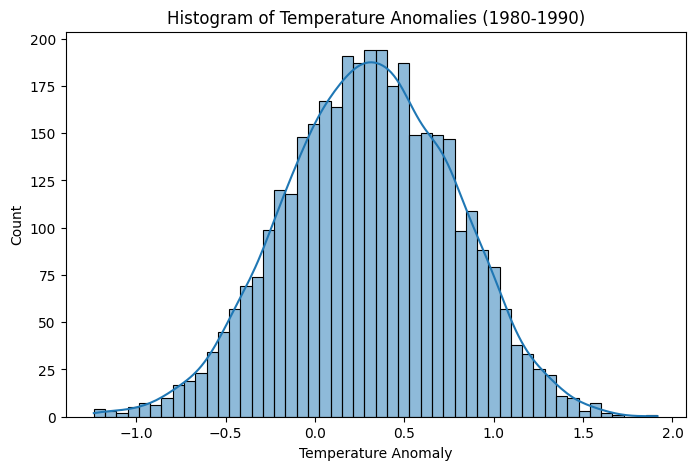

Analyzing period: 1990-2000
Number of Outliers: 72


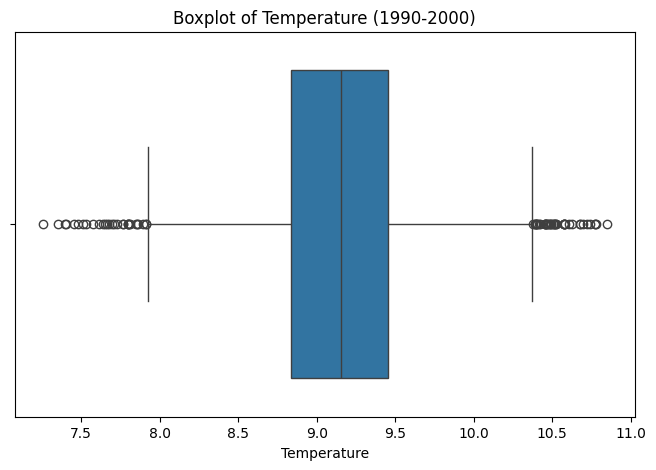

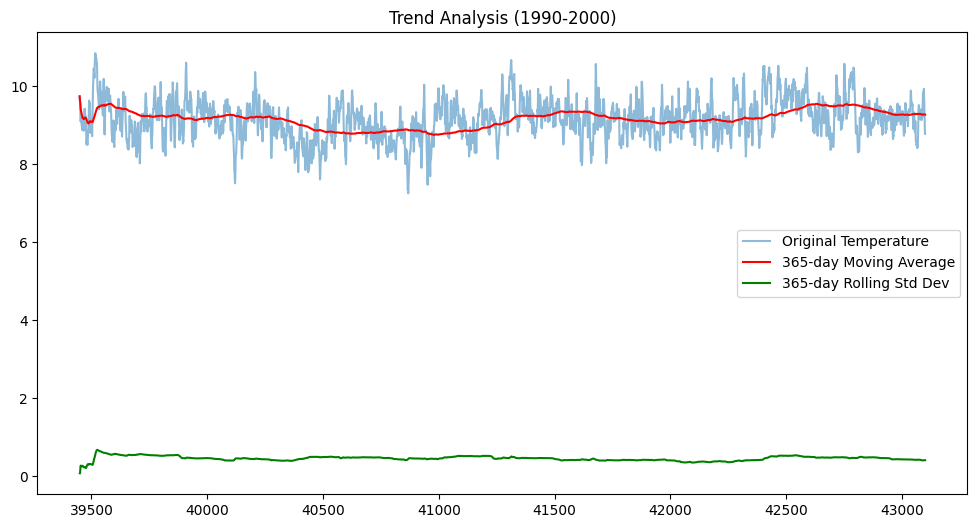

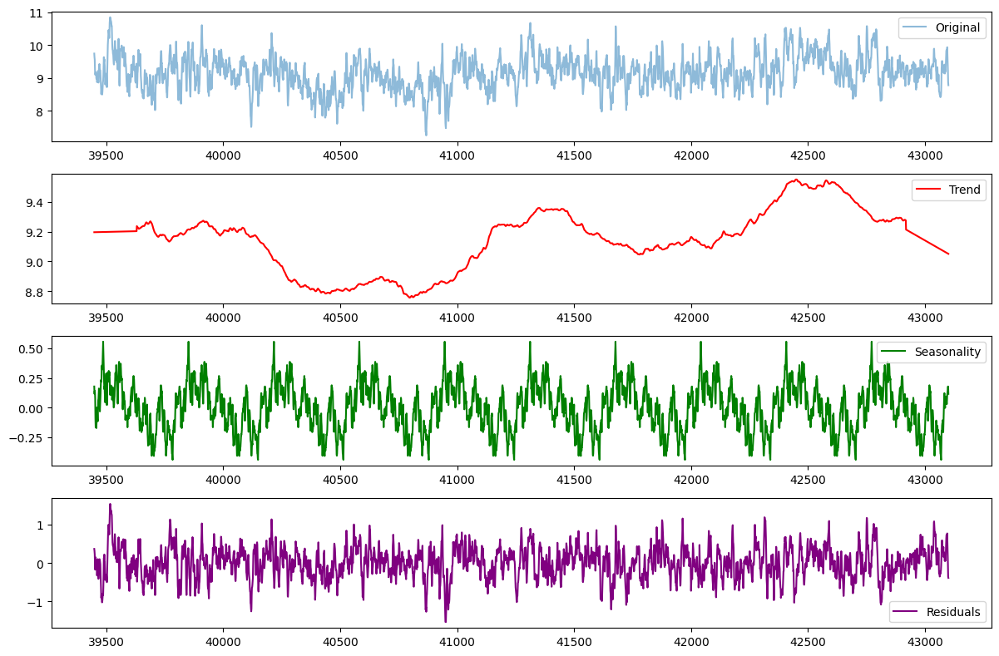

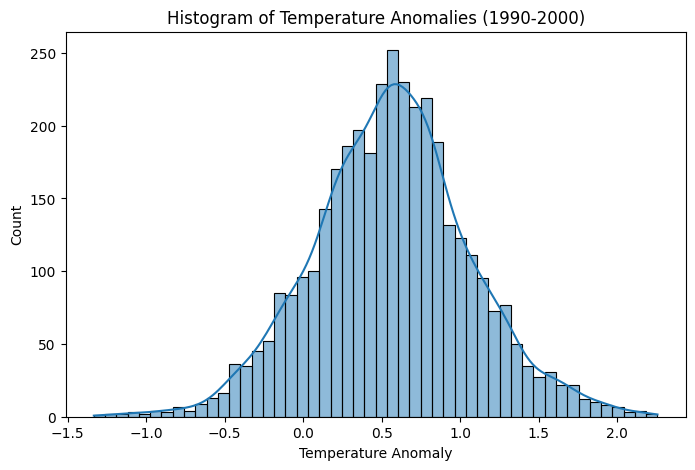

Analyzing period: 2000-2010
Number of Outliers: 48


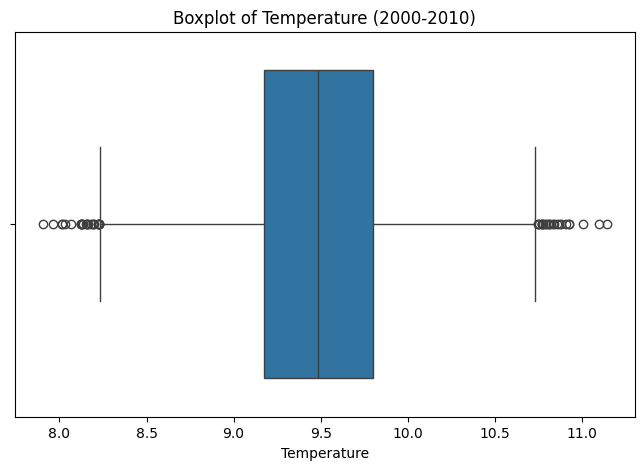

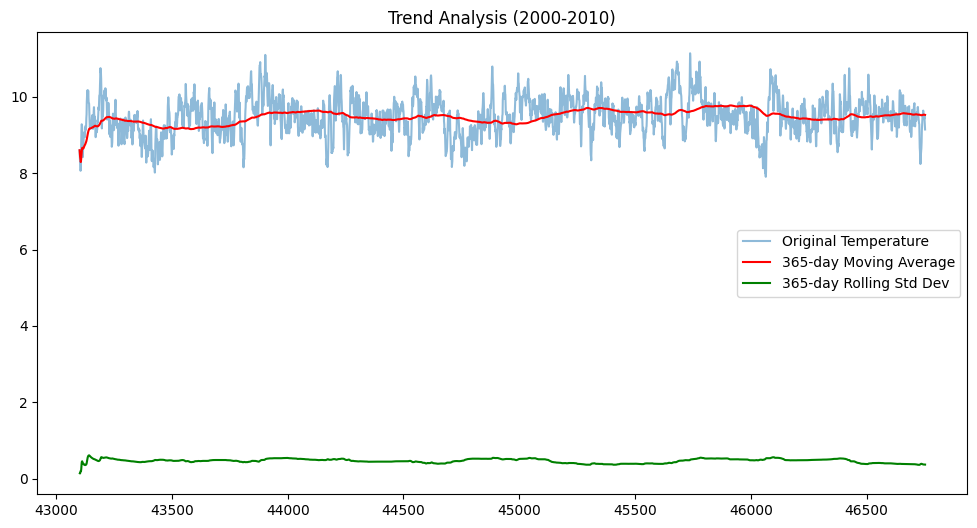

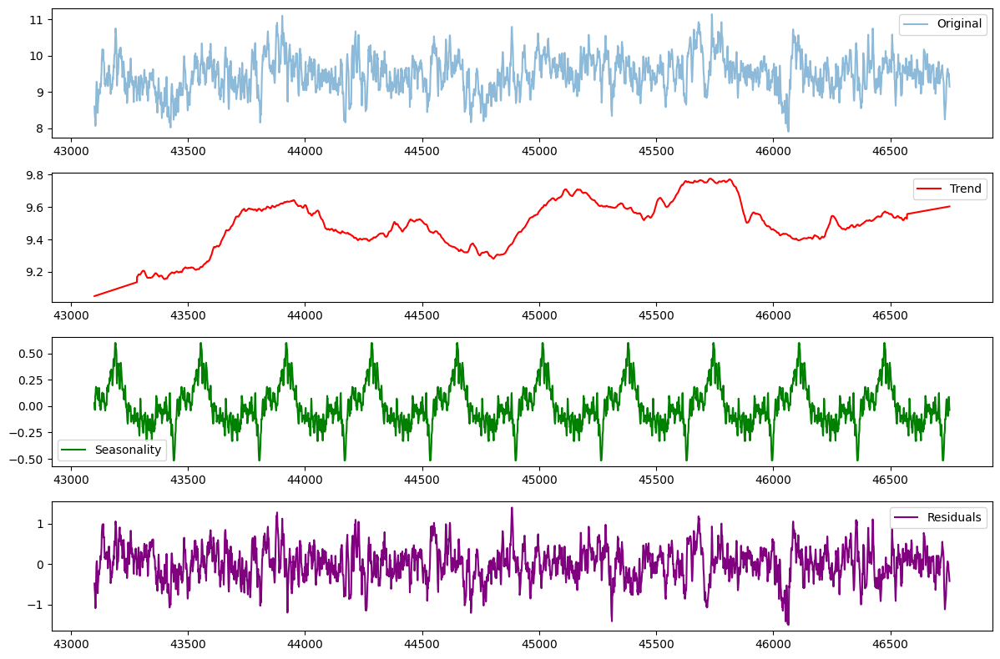

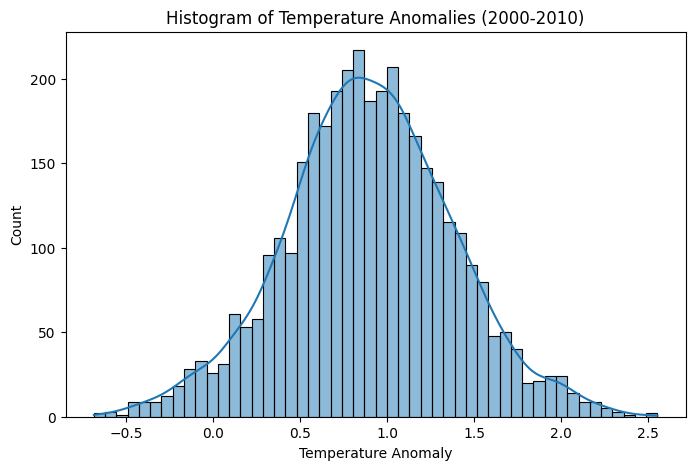

Analyzing period: 2010-2020
Number of Outliers: 67


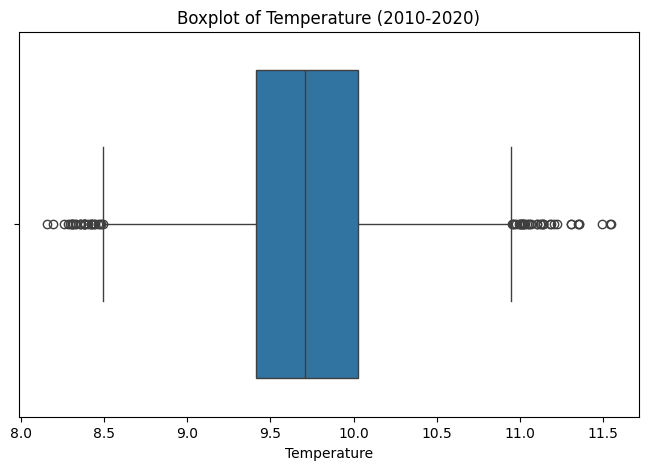

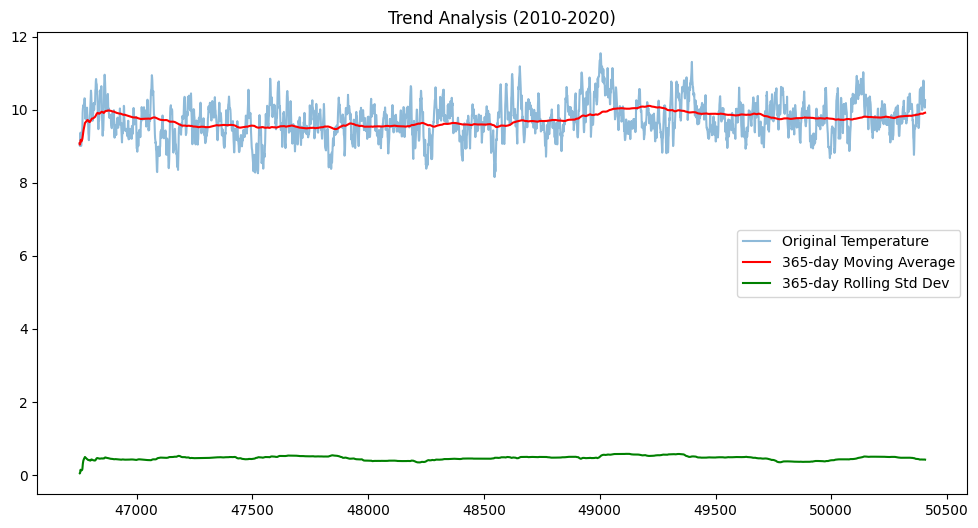

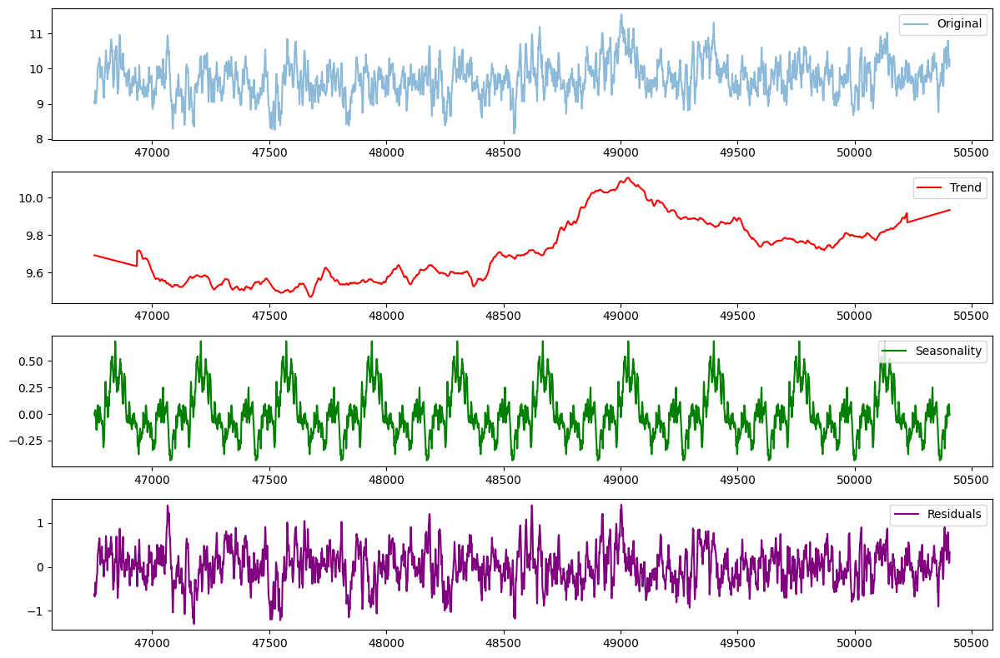

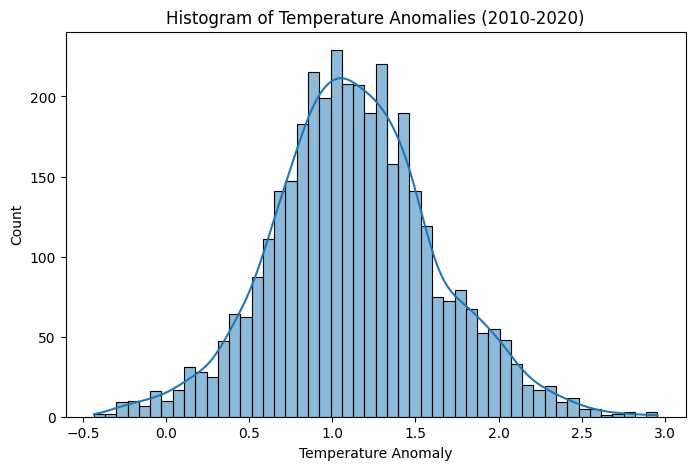

In [11]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.tsa.seasonal import seasonal_decompose

# Assuming df contains the dataset with 'Year', 'Temperature', and 'Anomaly' columns
group_size = 10
start_year = 1880
end_year = 2020

for start in range(start_year, end_year, group_size):
    df_group = df[(df['Year'] >= start) & (df['Year'] < start + group_size)].copy()
    print(f"Analyzing period: {start}-{start + group_size}")
    
    # Outlier Detection using IQR
    Q1 = df_group['Temperature'].quantile(0.25)
    Q3 = df_group['Temperature'].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers = df_group[(df_group['Temperature'] < lower_bound) | (df_group['Temperature'] > upper_bound)]
    print(f"Number of Outliers: {len(outliers)}")
    
    # Boxplot for Outliers
    plt.figure(figsize=(8, 5))
    sns.boxplot(x=df_group['Temperature'])
    plt.title(f"Boxplot of Temperature ({start}-{start + group_size})")
    plt.show()
    
    # Trend Analysis using Moving Average
    df_group['Rolling_Mean'] = df_group['Temperature'].rolling(window=365, min_periods=1).mean()
    df_group['Rolling_Std'] = df_group['Temperature'].rolling(window=365, min_periods=1).std()
    
    plt.figure(figsize=(12, 6))
    plt.plot(df_group['Temperature'], label="Original Temperature", alpha=0.5)
    plt.plot(df_group['Rolling_Mean'], label="365-day Moving Average", color='red')
    plt.plot(df_group['Rolling_Std'], label="365-day Rolling Std Dev", color='green')
    plt.title(f"Trend Analysis ({start}-{start + group_size})")
    plt.legend()
    plt.show()
    
    # Seasonal Decomposition
    decomposition = seasonal_decompose(df_group['Temperature'], period=365, model='additive', extrapolate_trend='freq')
    
    plt.figure(figsize=(12, 8))
    plt.subplot(411)
    plt.plot(df_group['Temperature'], label="Original", alpha=0.5)
    plt.legend()
    
    plt.subplot(412)
    plt.plot(decomposition.trend, label="Trend", color='red')
    plt.legend()
    
    plt.subplot(413)
    plt.plot(decomposition.seasonal, label="Seasonality", color='green')
    plt.legend()
    
    plt.subplot(414)
    plt.plot(decomposition.resid, label="Residuals", color='purple')
    plt.legend()
    
    plt.tight_layout()
    plt.show()
    
    # Histogram of Temperature Anomalies
    plt.figure(figsize=(8, 5))
    sns.histplot(df_group['Anomaly'], bins=50, kde=True)
    plt.title(f"Histogram of Temperature Anomalies ({start}-{start + group_size})")
    plt.xlabel("Temperature Anomaly")
    plt.show()


# Mean significance tests 

In [8]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import ttest_ind, f_oneway, shapiro
import scipy.stats as stats

# Convert 'Date' column to datetime (modify column name if needed)
if 'Date' in df.columns:
    df['Date'] = pd.to_datetime(df['Date'])
    df.set_index('Date', inplace=True)

# Drop missing values
df.dropna(subset=['Temperature'], inplace=True)
print(df.head())
### ---- 1. Hypothesis Testing ---- ###

# Splitting the data into two periods for t-test
early_period = df[df.index.year < 1950]['Temperature']
recent_period = df[df.index.year >= 2000]['Temperature']

# Independent t-test (assumes normality)
t_stat, p_value = ttest_ind(early_period, recent_period, equal_var=False)
print(f"T-test results: t-statistic={t_stat:.4f}, p-value={p_value:.4f}")

if p_value < 0.05:
    print("Reject H0: The mean temperature has significantly changed over time.")
else:
    print("Fail to reject H0: No significant change in mean temperature.")

# ANOVA test for multiple time periods (dividing data into 50-year bins)
df['Year'] = df.index.year
df['Period'] = pd.cut(df['Year'], bins=[1880, 1930, 1980, 2020], labels=['1880-1930', '1930-1980', '1980-2020'])

# Perform ANOVA
anova_groups = [df[df['Period'] == period]['Temperature'] for period in df['Period'].unique()]
anova_stat, anova_p = f_oneway(*anova_groups)
print(f"ANOVA results: F-statistic={anova_stat:.4f}, p-value={anova_p:.4f}")

if anova_p < 0.05:
    print("Reject H0: Mean temperatures differ significantly across time periods.")
else:
    print("Fail to reject H0: No significant difference in mean temperatures across periods.")

### ---- 2. Fitting a Multivariate Normal Distribution ---- ###

# Check normality assumption (Shapiro-Wilk Test on a sample)
sample = df['Temperature'].sample(500, random_state=42)  # Take a sample for normality check
shapiro_stat, shapiro_p = shapiro(sample)
print(f"Shapiro-Wilk Test: Statistic={shapiro_stat:.4f}, p-value={shapiro_p:.4f}")

if shapiro_p < 0.05:
    print("Data is not normally distributed (p < 0.05). Consider transformations.")
else:
    print("Data follows normal distribution (p >= 0.05).")

# QQ Plot for normality check
plt.figure(figsize=(6, 6))
stats.probplot(sample, dist="norm", plot=plt)
plt.title("QQ Plot of Temperature")
plt.show()

# Compute Covariance Matrix
cov_matrix = np.cov(df[['Temperature', 'Anomaly']].dropna().T)
print("Covariance Matrix:\n", cov_matrix)



   Year  Month  Day  Day of Year  Anomaly  Temperature  Rolling_Mean  \
0  1880      1    1            1   -0.692        7.898      7.898000   
1  1880      1    2            2   -0.592        7.998      7.948000   
2  1880      1    3            3   -0.673        7.917      7.937667   
3  1880      1    4            4   -0.615        7.975      7.947000   
4  1880      1    5            5   -0.681        7.909      7.939400   

   Rolling_Std  
0          NaN  
1          NaN  
2          NaN  
3          NaN  
4          NaN  


AttributeError: 'RangeIndex' object has no attribute 'year'

# 10 years group study and 35 years group study

In [ ]:
# Extract Year and compute yearly average temperature
df["Year"] = df.index.year
yearly_avg_temp = df.groupby("Year")["Temperature"].mean().reset_index()

# Define group configurations
group_configs = {
    "10-Year Groups": (14, 10),
    "35-Year Groups": (4, 35),
}

# Dictionary to store all results
all_distribution_stats = {}

# Perform analysis for each group size
for group_name, (num_groups, group_size) in group_configs.items():
    
    # Create figure for subplots
    fig, axes = plt.subplots(num_groups, 2, figsize=(12, 5 * num_groups))

    # Dictionary to store statistics for the current group
    distribution_stats = {}

    # Perform distribution analysis for each group
    for i in range(num_groups):
        start_index = i * group_size
        end_index = start_index + group_size

        if end_index > len(yearly_avg_temp):
            break  # Stop if out of range

        # Extract temperature data for the group
        group_data = yearly_avg_temp.iloc[start_index:end_index]["Temperature"]
        start_year = yearly_avg_temp.iloc[start_index]["Year"]
        end_year = yearly_avg_temp.iloc[end_index - 1]["Year"]
        group_label = f"{start_year}-{end_year}"

        # Compute statistical metrics
        stats_dict = {
            "Mean": np.mean(group_data),
            "Median": np.median(group_data),
            "Variance": np.var(group_data, ddof=1),
            "Skewness": stats.skew(group_data),
            "Kurtosis": stats.kurtosis(group_data),
        }
        distribution_stats[group_label] = stats_dict

        # Plot Histogram & KDE
        sns.histplot(group_data, bins=10, kde=True, ax=axes[i, 0], color="skyblue")
        axes[i, 0].set_title(f"Histogram & KDE: {group_label}")
        axes[i, 0].set_xlabel("Temperature")

        # Q-Q Plot (Normality Check)
        stats.probplot(group_data, dist="norm", plot=axes[i, 1])
        axes[i, 1].set_title(f"Q-Q Plot: {group_label}")

    # Convert dictionary to DataFrame and store results
    distribution_df = pd.DataFrame.from_dict(distribution_stats, orient="index")
    all_distribution_stats[group_name] = distribution_df

    # Save statistics to CSV
    filename = f"temperature_distribution_{group_name.replace(' ', '_').lower()}.csv"
    distribution_df.to_csv(filename)

    # Show plots
    plt.tight_layout()
    plt.show()

    # Print DataFrame
    print(f"📊 Distribution Statistics for {group_name}:")
    print(distribution_df)
    print("\n" + "=" * 80 + "\n")

In [ ]:
df["Year"] = df.index.year
yearly_avg_temp = df.groupby("Year")["Temperature"].mean().reset_index()

# Define the number of groups and group size
num_groups = 14
group_size = 10

# Plot KDE curves for each group
plt.figure(figsize=(12, 6))

for i in range(num_groups):
    start_index = i * group_size
    end_index = start_index + group_size

    if end_index > len(yearly_avg_temp):
        break  # Stop if out of range

    # Extract temperature data for the group
    group_data = yearly_avg_temp.iloc[start_index:end_index]["Temperature"]
    start_year = yearly_avg_temp.iloc[start_index]["Year"]
    end_year = yearly_avg_temp.iloc[end_index - 1]["Year"]

    # Plot KDE for the group
    sns.kdeplot(group_data, label=f"{start_year}-{end_year}", linewidth=2)

# Add labels and title
plt.xlabel("Temperature", fontsize=12)
plt.ylabel("Density", fontsize=12)
plt.title("Kernel Density Estimation (KDE) of Temperature Distributions (14 Groups of 10 Years)", fontsize=14)
plt.legend(title="Year Ranges", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)

# Show plot
plt.show()

# 20 years group study 

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import scipy.stats as stats

# Extract Year, Month, and Day
df["Year"] = df.index.year
df["Month"] = df.index.month
df["Day"] = df.index.day


# Define the number of groups and group size
num_groups = 7
group_size = 20

# Create an empty dictionary to store statistics
distribution_stats = {}

# Create plots
fig, axes = plt.subplots(num_groups, 3, figsize=(18, 5 * num_groups))  # Added an extra column for log-normality

# Perform distribution analysis for each group
for i in range(num_groups):
    start_index = i * group_size
    end_index = start_index + group_size

    if end_index > len(df):
        break  # Stop if out of range

    # Extract daily temperature data for the group
    group_data = df.iloc[start_index:end_index]["Temperature"]
    group_label = f"Group {i+1} ({df.iloc[start_index]['Year']}-{df.iloc[start_index]['Month']}-{df.iloc[start_index]['Day']} to {df.iloc[end_index-1]['Year']}-{df.iloc[end_index-1]['Month']}-{df.iloc[end_index-1]['Day']})"

    # Compute descriptive statistics
    stats_dict = {
        "Mean": np.mean(group_data),
        "Median": np.median(group_data),
        "Variance": np.var(group_data, ddof=1),
        "Skewness": stats.skew(group_data),
        "Kurtosis": stats.kurtosis(group_data),
    }

    # **Normality Test** (Shapiro-Wilk)
    shapiro_test = stats.shapiro(group_data)
    stats_dict["Normality (Shapiro-Wilk) p-value"] = shapiro_test.pvalue

    # **Log-Normality Test** (Kolmogorov-Smirnov Test)
    log_data = np.log(group_data[group_data > 0])  # Take log, avoid log(0) issues
    ks_test = stats.kstest(log_data, 'norm', args=(np.mean(log_data), np.std(log_data)))
    stats_dict["Log-Normality (KS test) p-value"] = ks_test.pvalue

    distribution_stats[group_label] = stats_dict

    # **Histogram & KDE plot**
    sns.histplot(group_data, bins=10, kde=True, ax=axes[i, 0], color="skyblue")
    axes[i, 0].set_title(f"Histogram & KDE: {group_label}")
    axes[i, 0].set_xlabel("Temperature")

    # **Q-Q Plot for Normality**
    stats.probplot(group_data, dist="norm", plot=axes[i, 1])
    axes[i, 1].set_title(f"Q-Q Plot: {group_label}")

    # **Q-Q Plot for Log-Normality**
    stats.probplot(log_data, dist="norm", plot=axes[i, 2])
    axes[i, 2].set_title(f"Log-Normal Q-Q Plot: {group_label}")

# Save distribution statistics to a DataFrame
distribution_df = pd.DataFrame.from_dict(distribution_stats, orient="index")

# Show plots
plt.tight_layout()
plt.show()

# Save statistics to CSV
distribution_df.to_csv("daily_temperature_distribution_study_with_normality.csv")

# Print results
print(distribution_df)


In [ ]:
# Define the number of groups and group size
num_groups = 7
group_size = 20

# Plot KDE curves for each group
plt.figure(figsize=(12, 6))

for i in range(num_groups):
    start_index = i * group_size
    end_index = start_index + group_size

    if end_index > len(yearly_avg_temp):
        break  # Stop if out of range

    # Extract temperature data for the group
    group_data = yearly_avg_temp.iloc[start_index:end_index]["Temperature"]
    start_year = yearly_avg_temp.iloc[start_index]["Year"]
    end_year = yearly_avg_temp.iloc[end_index - 1]["Year"]

    # Plot KDE for the group
    sns.kdeplot(group_data, label=f"{start_year}-{end_year}", linewidth=2)

# Add labels and title
plt.xlabel("Temperature", fontsize=12)
plt.ylabel("Density", fontsize=12)
plt.title("Kernel Density Estimation (KDE) of Temperature Distributions (7 Groups of 20 Years)", fontsize=14)
plt.legend(title="Year Ranges")
plt.grid(True)

# Show plot
plt.show()

# Growth Rate calculations 
Annual growth rate and n- yearly growth rates (n=10,20,35,70)

In [ ]:
import pandas as pd
import numpy as np

# Load data (Assuming df is already loaded and indexed by Date)

# Extract Year and calculate yearly average temperature
df["Year"] = df.index.year
yearly_avg_temp = df.groupby("Year")["Temperature"].mean().reset_index()

# Function to calculate CAGR using two formulas
def calculate_cagr1(initial, final, years):
    return ((final / initial) ** (1 / years)) - 1 if years > 0 else np.nan

def calculate_cagr2(initial, final, years):
    return ((final / initial)) - 1 if years > 0 else np.nan

# Define the group sizes and names
group_sizes = [10, 20, 35, 70]  # Groups of 10, 20, 35, and 70 years
group_labels = ["10-Year Growth", "20-Year Growth", "35-Year Growth", "70-Year Growth"]

all_growth_data = {}

# Loop through each group size and compute CAGR using both formulas
for group_size, label in zip(group_sizes, group_labels):
    num_groups = len(yearly_avg_temp) // group_size  # Number of full groups
    growth_list1, growth_list2 = [], []

    for i in range(num_groups):
        start_index = i * group_size
        end_index = start_index + group_size - 1

        if end_index < len(yearly_avg_temp):
            temp_initial = yearly_avg_temp.iloc[start_index]["Temperature"]
            temp_final = yearly_avg_temp.iloc[end_index]["Temperature"]
            growth_list1.append(calculate_cagr1(temp_initial, temp_final, group_size))
            growth_list2.append(calculate_cagr2(temp_initial, temp_final, group_size))
        else:
            break  # Stop if the range goes out of bounds

    # Store results
    all_growth_data[f"{label} - CAGR1"] = growth_list1
    all_growth_data[f"{label} - CAGR2"] = growth_list2

# Find the maximum length among the lists
max_length = max(map(len, all_growth_data.values()))

# Pad shorter lists with NaN to match the maximum length
for key in all_growth_data:
    all_growth_data[key] += [np.nan] * (max_length - len(all_growth_data[key]))

# Convert to DataFrame
growth_df = pd.DataFrame.from_dict(all_growth_data)

growth_df.index = [f"Group {i+1}" for i in range(len(growth_df))]

# Save to CSV
growth_df.to_csv("temperature1_growth_analysis.csv")

# Display results
print(growth_df)


# Time Series Modelling

In [20]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_absolute_error, mean_squared_error
from pmdarima import auto_arima

# Exploratory Analysis
plt.figure(figsize=(14,6))
plt.plot(df['Temperature'], label='Daily Temperature')
plt.title('Daily Global Temperature Over Time')
plt.xlabel('Index')
plt.ylabel('Temperature')
plt.legend()
plt.savefig("daily_global_temperature.png")  # Save with a meaningful filename
plt.close()

# ADF Test for Stationarity
def adf_test(series):
    result = adfuller(series.dropna())
    print(f"ADF Statistic: {result[0]}")
    print(f"p-value: {result[1]}")
    if result[1] > 0.05:
        print("Non-stationary series (p > 0.05)")
    else:
        print("Stationary series (p <= 0.05)")

print("ADF Test (Original Series):")
adf_test(df['Temperature'])

# Differencing
df['Temperature_Diff'] = df['Temperature'].diff()

print("\nADF Test (After Differencing):")
adf_test(df['Temperature_Diff'])

# ACF and PACF
fig, axes = plt.subplots(1, 2, figsize=(14,5))
plot_acf(df['Temperature_Diff'].dropna(), ax=axes[0])
plot_pacf(df['Temperature_Diff'].dropna(), ax=axes[1])
plt.savefig("acf_pacf_analysis.png")  # Save with an appropriate filename
plt.close() 

# Automatically select best ARIMA order
auto_model = auto_arima(
    df['Temperature'],
    seasonal=False,
    stepwise=True,
    suppress_warnings=True,
    error_action='ignore',
    trace=True,
    max_p=6,
    max_q=6
)

print(f"\nBest ARIMA Order Found: {auto_model.order}")

# Fit ARIMA Model
model = ARIMA(df['Temperature'], order=auto_model.order)
arima_result = model.fit()
print(arima_result.summary())

# Forecast next 365 days
forecast = arima_result.forecast(steps=365)

# Plot
plt.figure(figsize=(14,6))
plt.plot(df['Temperature'][-365:], label='Actual')
plt.plot(np.arange(len(df), len(df) + 365), forecast, label='Forecast', linestyle='dashed')
plt.title('ARIMA Forecast vs Actual (Last 365 Days)')
plt.xlabel('Index')
plt.ylabel('Temperature')
plt.legend()
plt.savefig("arima_forecast_vs_actual.png")  # Save with an appropriate filename
plt.close()  


# Evaluation
y_actual = df['Temperature'][-365:]
y_pred = forecast[:365]
mae = mean_absolute_error(y_actual, y_pred)
rmse = np.sqrt(mean_squared_error(y_actual, y_pred))
print(f"\nARIMA Performance on Full Dataset:")
print(f"MAE: {mae:.4f}")
print(f"RMSE: {rmse:.4f}")


ADF Test (Original Series):
ADF Statistic: -9.437660805688283
p-value: 4.991882507815218e-16
Stationary series (p <= 0.05)

ADF Test (After Differencing):
ADF Statistic: -43.762296113685935
p-value: 0.0
Stationary series (p <= 0.05)
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=-57163.089, Time=29.44 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=-48399.827, Time=2.20 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=-53767.450, Time=1.42 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=-54586.133, Time=3.08 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=-48401.822, Time=1.34 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=-54582.434, Time=8.30 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=-56872.395, Time=29.94 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=inf, Time=33.32 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=inf, Time=38.43 sec
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=-54594.783, Time=3.82 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=-57204.109, 


Analyzing period: 1880-1900


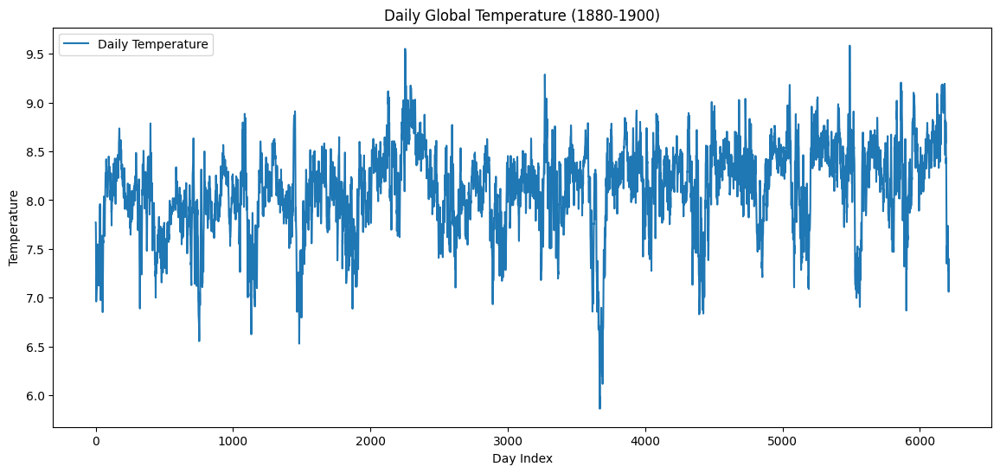

ADF Statistic: -9.505999565937447
p-value: 3.3461405645231796e-16
Stationary series (p <= 0.05)
ADF Statistic: -24.730374567814753
p-value: 0.0
Stationary series (p <= 0.05)


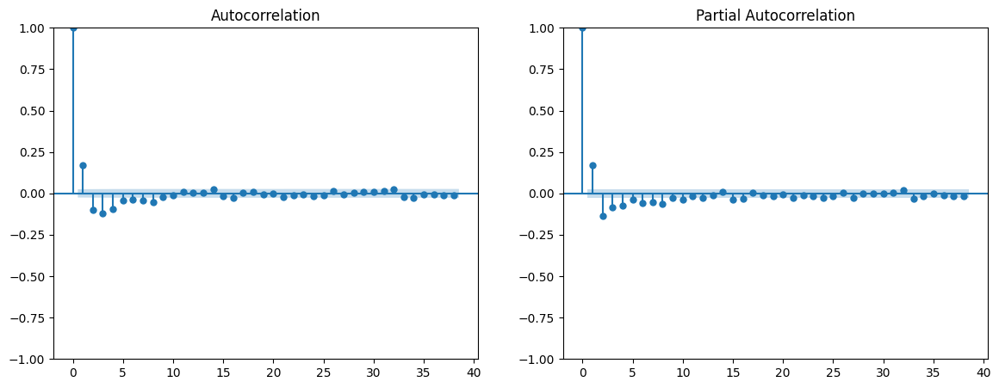

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=-7356.225, Time=4.08 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=-6890.814, Time=0.34 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=-7074.713, Time=0.51 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=-7120.486, Time=0.57 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=-6892.813, Time=0.16 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=-7360.900, Time=3.05 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=-7150.586, Time=1.63 sec
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=-7134.081, Time=1.28 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=-7362.650, Time=4.74 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=-7222.532, Time=1.04 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=-7357.826, Time=2.19 sec
 ARIMA(1,1,4)(0,0,0)[0] intercept   : AIC=-7361.274, Time=4.74 sec
 ARIMA(0,1,4)(0,0,0)[0] intercept   : AIC=-7295.500, Time=1.42 sec
 ARIMA(2,1,4)(0,0,0)[0] intercept   : AIC=-7359.212, Time=5.32 sec
 ARIMA(1,1,3)(0,0,0

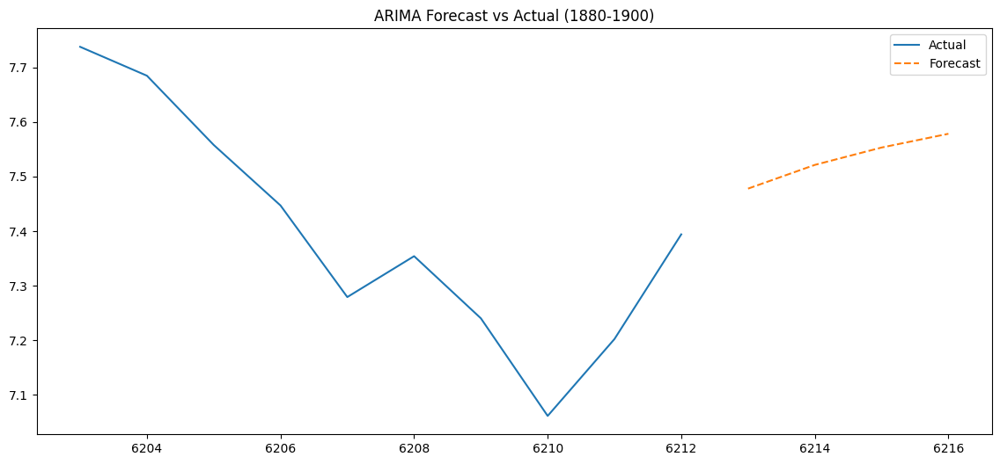

ARIMA MAE (1880-1900): 0.3085, RMSE: 0.3264

Analyzing period: 1900-1920


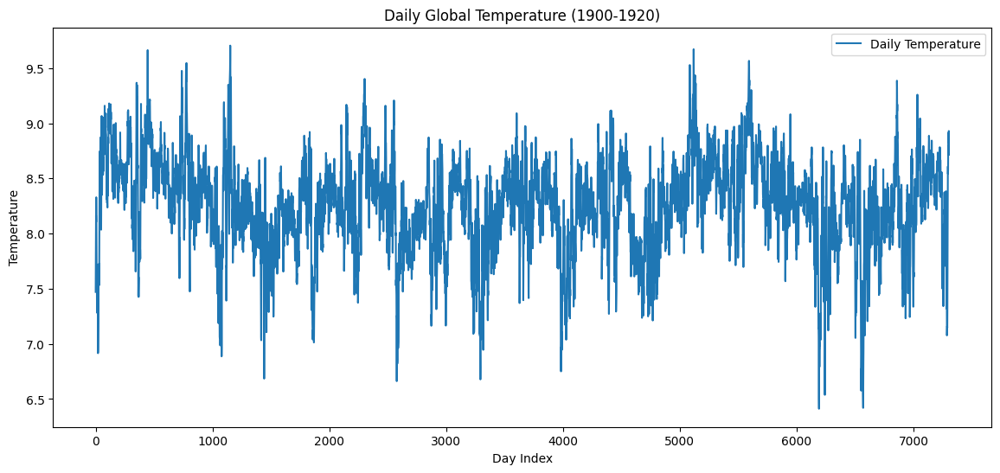

ADF Statistic: -11.319604391380265
p-value: 1.1830963854949672e-20
Stationary series (p <= 0.05)
ADF Statistic: -21.167372868090293
p-value: 0.0
Stationary series (p <= 0.05)


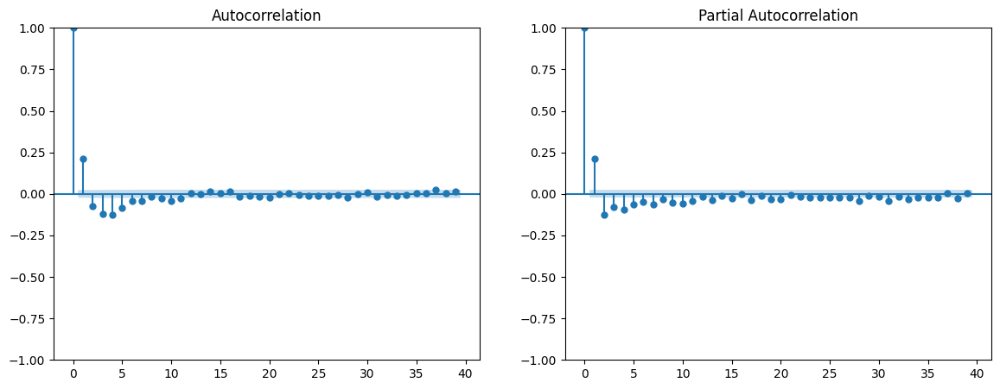

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=-7798.864, Time=4.07 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=-7008.392, Time=0.44 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=-7349.110, Time=0.31 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=-7415.822, Time=0.58 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=-7010.382, Time=0.15 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=inf, Time=5.81 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=-7789.314, Time=5.10 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=-7791.952, Time=4.65 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=-7789.912, Time=4.96 sec
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=-7420.823, Time=1.64 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=-7794.653, Time=4.56 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=-7804.966, Time=5.13 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=-7511.321, Time=0.74 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=-7804.548, Time=5.47 sec
 ARIMA(2,1,0)(0,0,0)[0] i

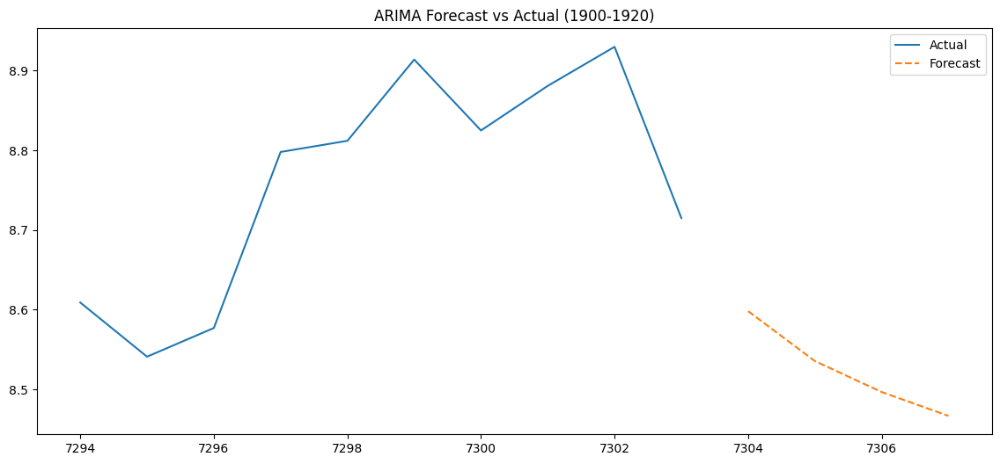

ARIMA MAE (1900-1920): 0.3136, RMSE: 0.3242

Analyzing period: 1920-1940


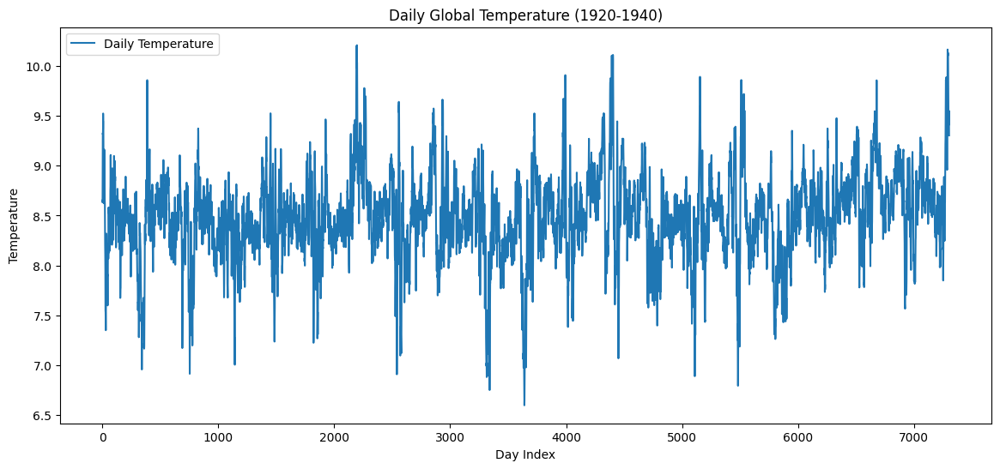

ADF Statistic: -13.478767214028714
p-value: 3.2724619072701088e-25
Stationary series (p <= 0.05)
ADF Statistic: -22.837800799250253
p-value: 0.0
Stationary series (p <= 0.05)


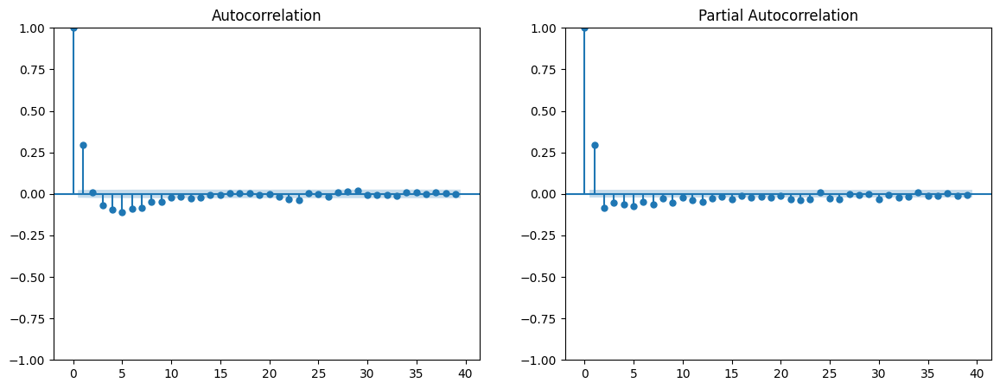

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=-9226.554, Time=4.12 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=-8286.312, Time=0.30 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=-8955.796, Time=1.40 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=-8989.146, Time=0.54 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=-8288.309, Time=0.14 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=-8999.913, Time=3.03 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=-9268.339, Time=3.10 sec
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=-8995.692, Time=0.78 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=-9009.027, Time=0.29 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=inf, Time=4.15 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=-9025.861, Time=0.77 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=inf, Time=6.89 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=inf, Time=1.32 sec

Best model:  ARIMA(2,1,1)(0,0,0)[0] intercept
Total fit time: 26.883 seconds
Selected Order (p,d,q): (2

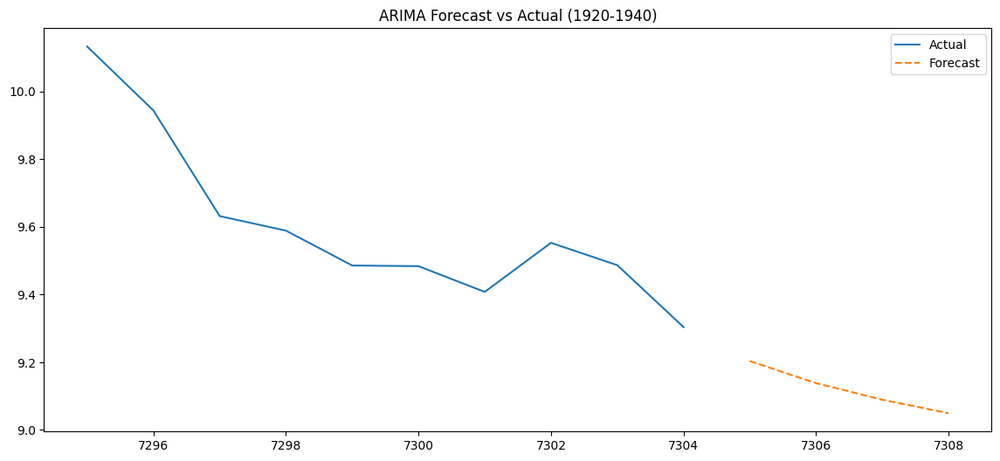

ARIMA MAE (1920-1940): 0.3177, RMSE: 0.3303

Analyzing period: 1940-1960


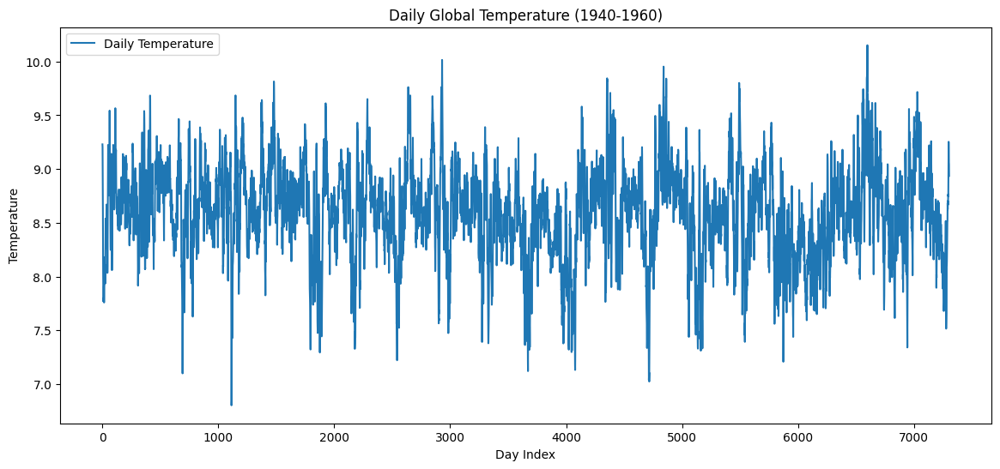

ADF Statistic: -12.27529371649404
p-value: 8.459582293576229e-23
Stationary series (p <= 0.05)
ADF Statistic: -20.324966838133054
p-value: 0.0
Stationary series (p <= 0.05)


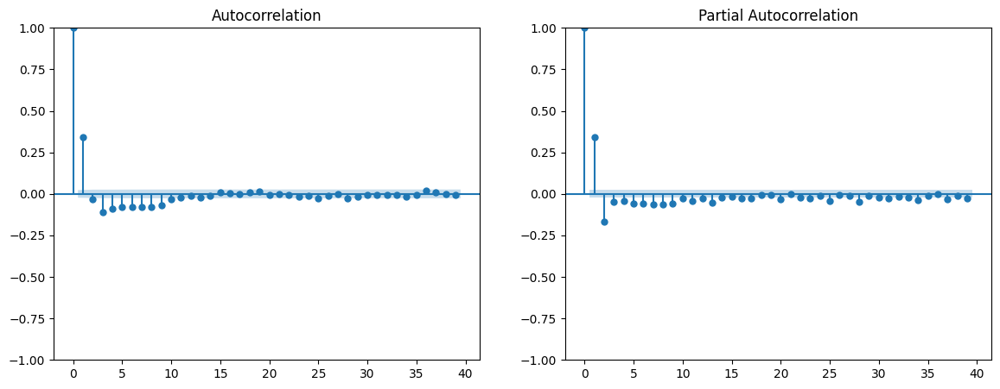

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=-9197.336, Time=3.74 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=-7804.979, Time=0.31 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=-8696.580, Time=0.67 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=-8841.272, Time=0.58 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=-7806.978, Time=0.22 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=-9110.173, Time=2.61 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=-9131.656, Time=2.43 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=-9165.646, Time=4.32 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=inf, Time=5.45 sec
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=-8843.897, Time=0.91 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=inf, Time=5.18 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=-9201.021, Time=4.94 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=-8910.869, Time=0.38 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=-9186.042, Time=4.95 sec
 ARIMA(2,1,0)(0,0,0)[0] interce

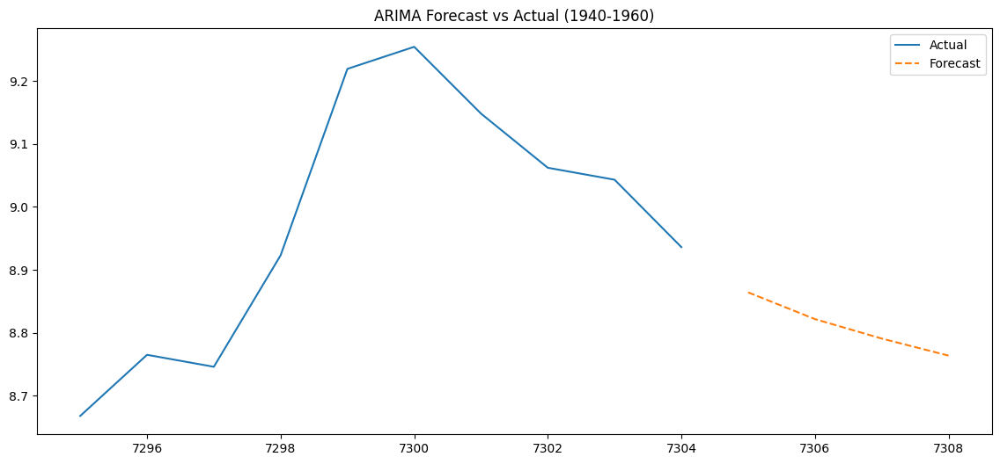

ARIMA MAE (1940-1960): 0.2372, RMSE: 0.2406

Analyzing period: 1960-1980


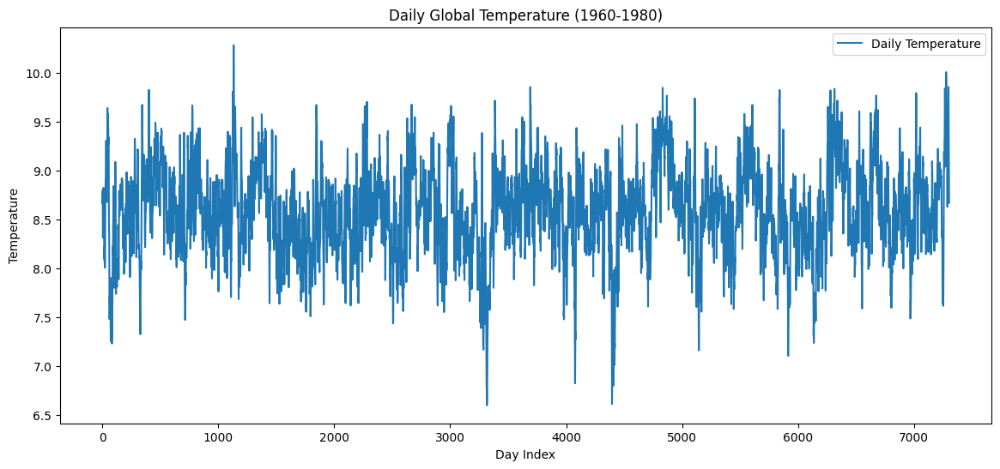

ADF Statistic: -11.993721933526885
p-value: 3.4729483329151113e-22
Stationary series (p <= 0.05)
ADF Statistic: -20.037106267414817
p-value: 0.0
Stationary series (p <= 0.05)


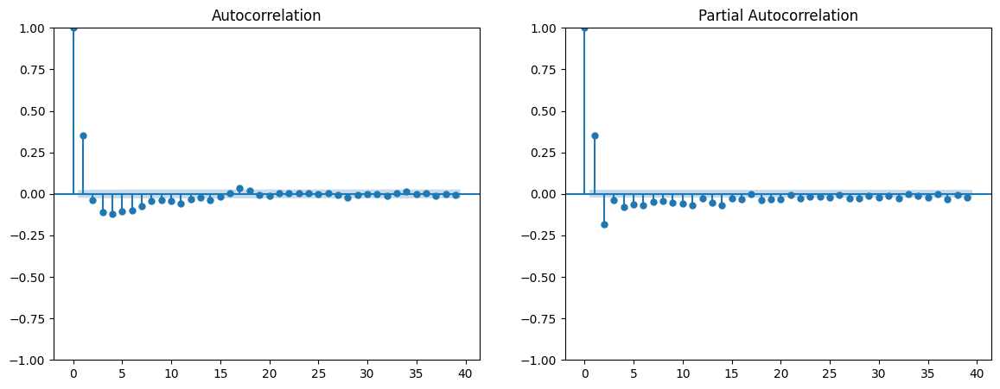

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=-7113.495, Time=2.74 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=52160.627, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.27 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=inf, Time=0.32 sec
 ARIMA(1,0,2)(0,0,0)[0]             : AIC=-7118.198, Time=0.73 sec
 ARIMA(0,0,2)(0,0,0)[0]             : AIC=32969.431, Time=0.49 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=-7117.974, Time=0.23 sec
 ARIMA(1,0,3)(0,0,0)[0]             : AIC=-7144.448, Time=0.96 sec
 ARIMA(0,0,3)(0,0,0)[0]             : AIC=25465.631, Time=0.91 sec
 ARIMA(2,0,3)(0,0,0)[0]             : AIC=-7114.261, Time=2.36 sec
 ARIMA(1,0,4)(0,0,0)[0]             : AIC=-7207.252, Time=0.78 sec
 ARIMA(0,0,4)(0,0,0)[0]             : AIC=19531.028, Time=1.38 sec
 ARIMA(2,0,4)(0,0,0)[0]             : AIC=-7140.346, Time=3.28 sec
 ARIMA(1,0,5)(0,0,0)[0]             : AIC=-7270.931, Time=1.07 sec
 ARIMA(0,0,5)(0,0,0)[0]        

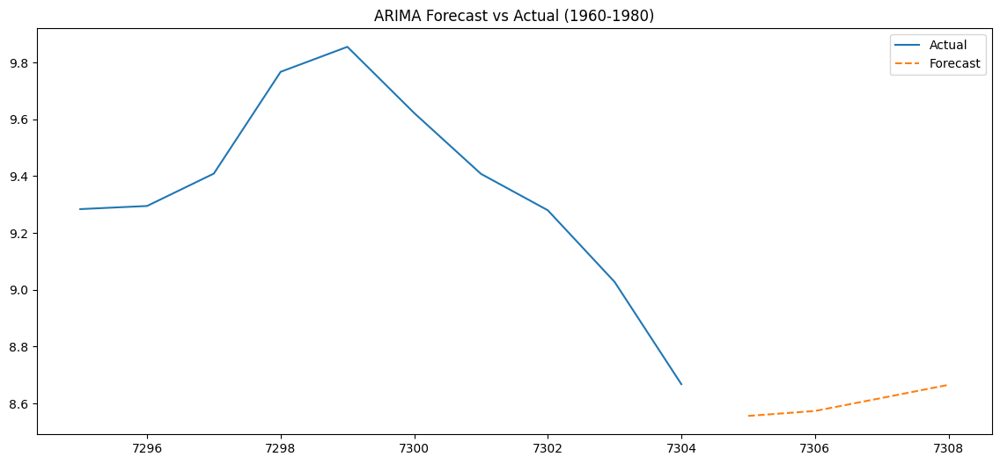

ARIMA MAE (1960-1980): 0.4921, RMSE: 0.5897

Analyzing period: 1980-2000


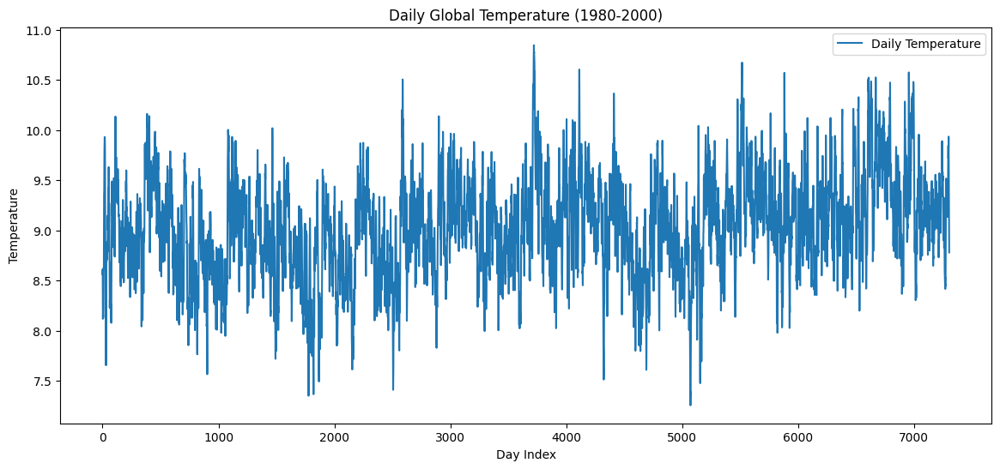

ADF Statistic: -7.820413456227168
p-value: 6.693545479622451e-12
Stationary series (p <= 0.05)
ADF Statistic: -21.99891719650499
p-value: 0.0
Stationary series (p <= 0.05)


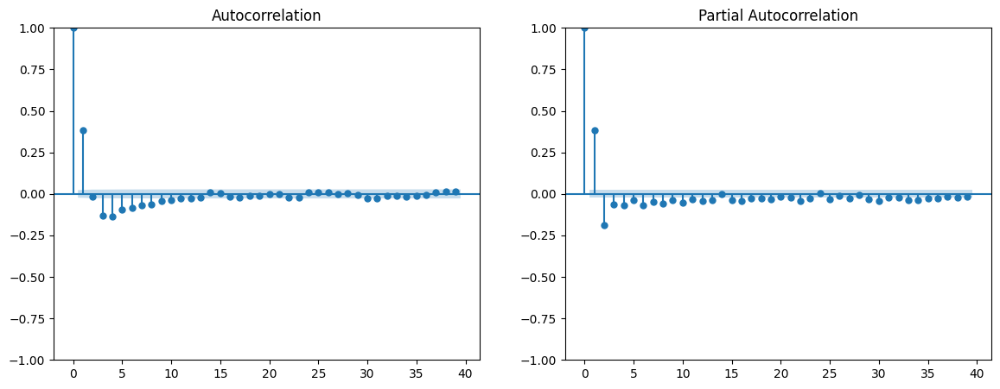

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=-7568.907, Time=3.75 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=-5799.393, Time=0.41 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=-6941.991, Time=0.76 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=-7123.404, Time=0.53 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=-5801.392, Time=0.15 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=inf, Time=3.84 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=-7483.240, Time=3.38 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=-7505.095, Time=4.59 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=-7550.989, Time=5.04 sec
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=-7136.362, Time=1.01 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=inf, Time=3.21 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=-7572.700, Time=4.65 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=-7229.854, Time=0.45 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=-7551.042, Time=4.83 sec
 ARIMA(2,1,0)(0,0,0)[0] interce

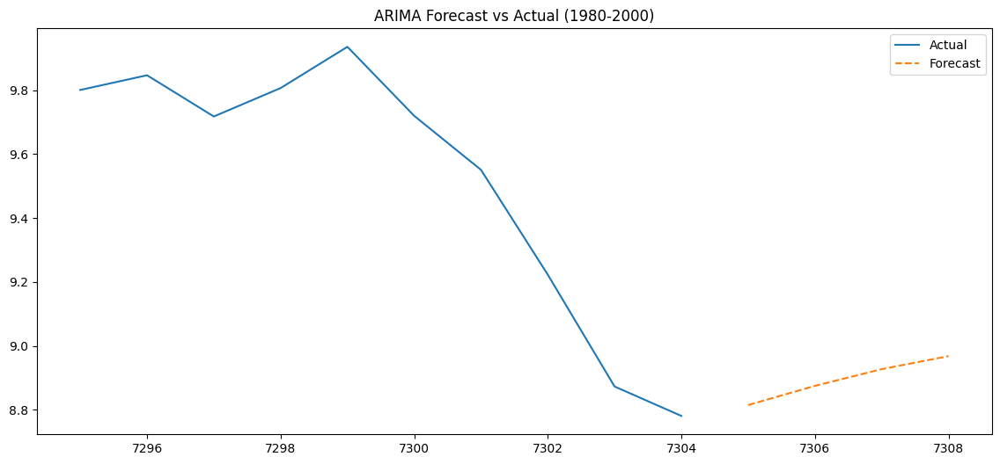

ARIMA MAE (1980-2000): 0.3313, RMSE: 0.4185

Analyzing period: 2000-2020


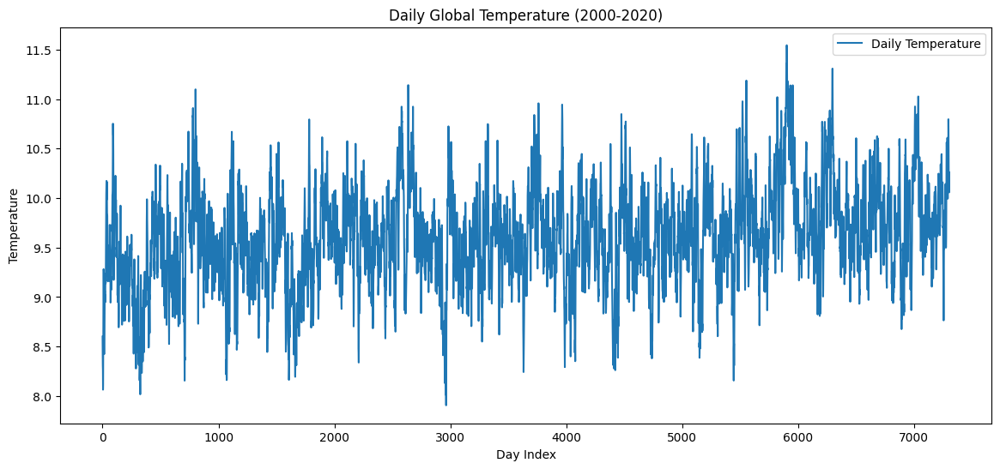

ADF Statistic: -14.245515559630434
p-value: 1.5119106986016173e-26
Stationary series (p <= 0.05)
ADF Statistic: -20.557143402726886
p-value: 0.0
Stationary series (p <= 0.05)


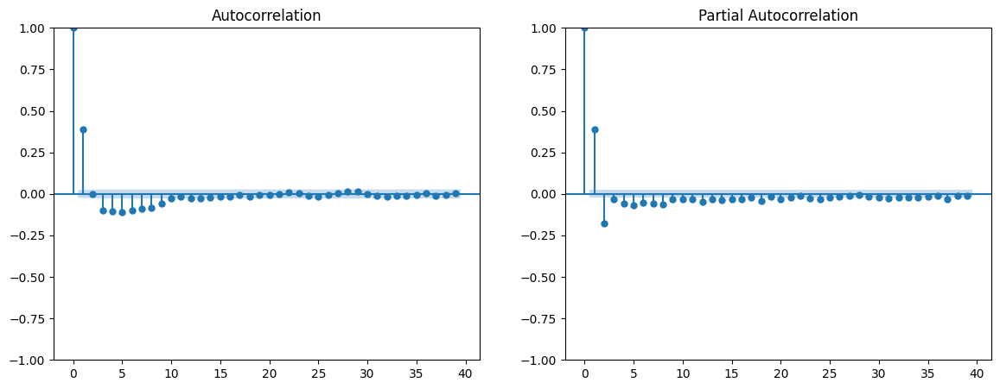

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=inf, Time=6.59 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=-6194.864, Time=0.32 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=-7387.833, Time=0.18 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=-7558.217, Time=0.52 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=-6196.849, Time=0.19 sec
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=-7577.079, Time=0.91 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=-7864.979, Time=3.34 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=-7624.647, Time=0.75 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=inf, Time=4.58 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=inf, Time=3.46 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=-7630.980, Time=0.45 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=-7880.396, Time=4.77 sec
 ARIMA(4,1,2)(0,0,0)[0] intercept   : AIC=-7927.260, Time=6.13 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=-7879.431, Time=6.29 sec
 ARIMA(5,1,2)(0,0,0)[0] intercept   :

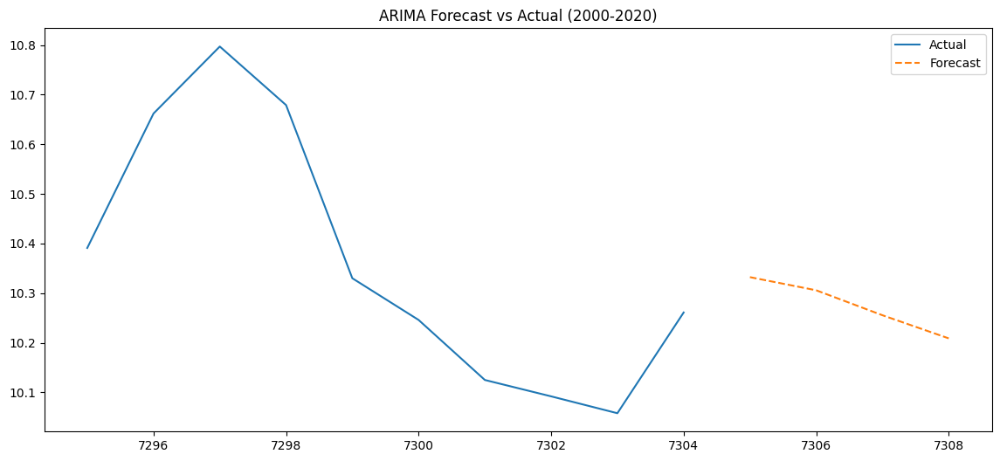

ARIMA MAE (2000-2020): 0.1676, RMSE: 0.1805

ARIMA Performance Summary:
  Time Period      Order       MAE      RMSE
0   1880-1900  (1, 1, 3)  0.308529  0.326355
1   1900-1920  (3, 1, 2)  0.313560  0.324202
2   1920-1940  (2, 1, 1)  0.317736  0.330327
3   1940-1960  (3, 1, 1)  0.237159  0.240629
4   1960-1980  (4, 0, 6)  0.492115  0.589666
5   1980-2000  (3, 1, 1)  0.331345  0.418542
6   2000-2020  (1, 1, 4)  0.167644  0.180514


In [21]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from sklearn.metrics import mean_absolute_error, mean_squared_error
from pmdarima import auto_arima

group_size = 20
start_year = 1880
end_year = 2020

def adf_test(series):
    result = adfuller(series.dropna())
    print(f"ADF Statistic: {result[0]}")
    print(f"p-value: {result[1]}")
    if result[1] > 0.05:
        print("Non-stationary series (p > 0.05)")
    else:
        print("Stationary series (p <= 0.05)")

results_list = []

for start in range(start_year, end_year, group_size):
    df_group = df[(df['Year'] >= start) & (df['Year'] < start + group_size)].copy()
    df_group.reset_index(drop=True, inplace=True)
    
    print(f"\nAnalyzing period: {start}-{start + group_size}")
    
    # Plot original temperature
    plt.figure(figsize=(14,6))
    plt.plot(df_group['Temperature'], label='Daily Temperature')
    plt.title(f'Daily Global Temperature ({start}-{start + group_size})')
    plt.xlabel('Day Index')
    plt.ylabel('Temperature')
    plt.legend()
    plt.show()
    
    # ADF Test
    adf_test(df_group['Temperature'])

    # Differencing
    df_group['Temperature_Diff'] = df_group['Temperature'].diff()
    adf_test(df_group['Temperature_Diff'].dropna())

    # ACF and PACF
    fig, axes = plt.subplots(1, 2, figsize=(14,5))
    plot_acf(df_group['Temperature_Diff'].dropna(), ax=axes[0])
    plot_pacf(df_group['Temperature_Diff'].dropna(), ax=axes[1])
    plt.show()

    # Auto ARIMA Order Selection
    auto_model = auto_arima(
        df_group['Temperature'],
        seasonal=False,
        stepwise=True,
        suppress_warnings=True,
        error_action='ignore',
        trace=True,
        max_p=6,
        max_q=6
    )

    print(f"Selected Order (p,d,q): {auto_model.order}")
    
    # Fit ARIMA using selected order
    model = ARIMA(df_group['Temperature'], order=auto_model.order)
    model_fit = model.fit()
    print(model_fit.summary())

    # Forecast next 4 values
    forecast = model_fit.forecast(steps=4)

    # Plot actual and forecast
    plt.figure(figsize=(14,6))
    plt.plot(df_group['Temperature'][-10:], label='Actual')
    plt.plot(
        np.arange(len(df_group), len(df_group)+4),
        forecast,
        label='Forecast',
        linestyle='dashed'
    )
    plt.title(f'ARIMA Forecast vs Actual ({start}-{start + group_size})')
    plt.legend()
    plt.show()

    # Performance metrics using actual last 4 values
    y_actual = df_group['Temperature'][-4:].values
    y_pred = forecast[:4]
    mae = mean_absolute_error(y_actual, y_pred)
    rmse = np.sqrt(mean_squared_error(y_actual, y_pred))
    print(f'ARIMA MAE ({start}-{start + group_size}): {mae:.4f}, RMSE: {rmse:.4f}')
    
    results_list.append({
        "Time Period": f"{start}-{start + group_size}",
        "Order": auto_model.order,
        "MAE": mae,
        "RMSE": rmse
    })

# Final DataFrame of results
results_df = pd.DataFrame(results_list)
print("\nARIMA Performance Summary:")
print(results_df)


Annual Temperature Summary:
   Year  MinTemp  MaxTemp  MeanTemp
0  1880    6.945    8.666  7.995557
1  1881    7.213    9.006  8.255378
2  1882    6.720    9.325  8.116529
3  1883    6.852    8.735  7.995145
4  1884    7.001    8.786  7.801880

=== Annual Minimum Temperature ===


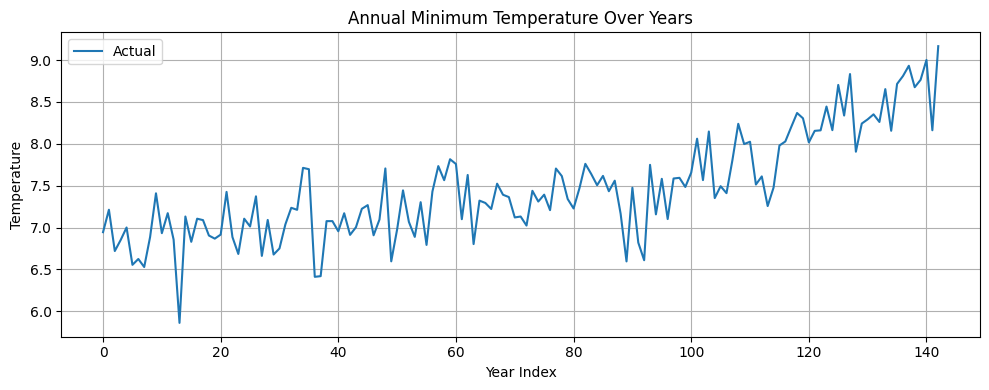


ADF Test - Annual Minimum Temperature
ADF Statistic: 0.1330
p-value: 0.9682
=> Non-stationary (p > 0.05)


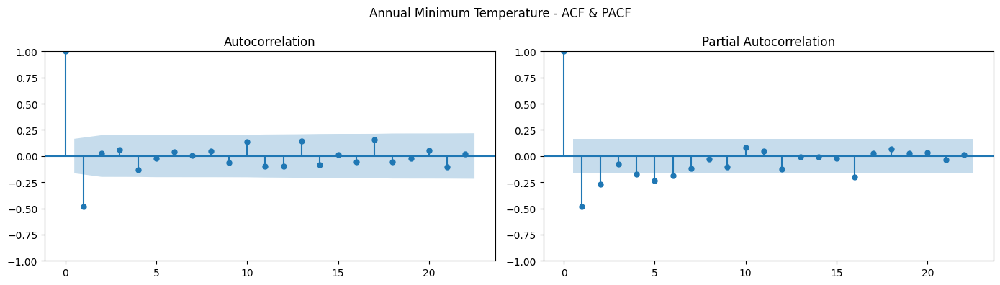

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=104.664, Time=0.34 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=163.981, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=126.994, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=100.377, Time=0.06 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=162.173, Time=0.01 sec
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=101.663, Time=0.08 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=101.781, Time=0.09 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=104.128, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=103.725, Time=0.03 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0] intercept
Total fit time: 0.754 seconds
Selected ARIMA Order: (0, 1, 1)
                               SARIMAX Results                                
Dep. Variable:                MinTemp   No. Observations:                  143
Model:                 ARIMA(0, 1, 1)   Log Likelihood                 -49.863
Date:                Tue, 

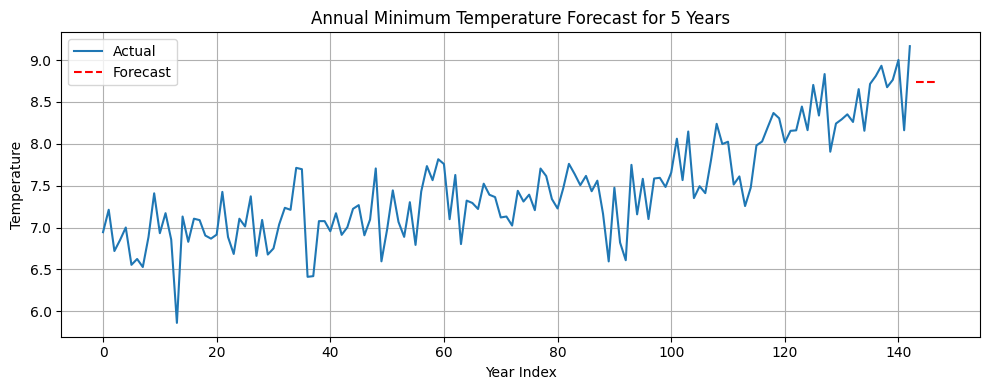


=== Annual Maximum Temperature ===


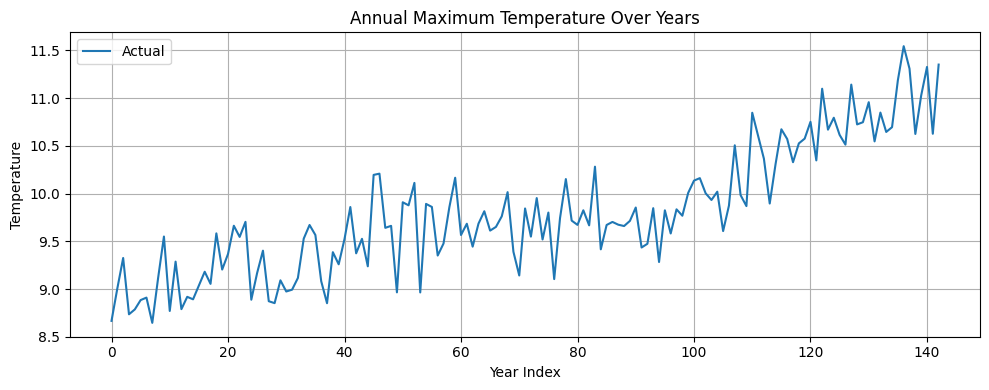


ADF Test - Annual Maximum Temperature
ADF Statistic: 0.8198
p-value: 0.9919
=> Non-stationary (p > 0.05)


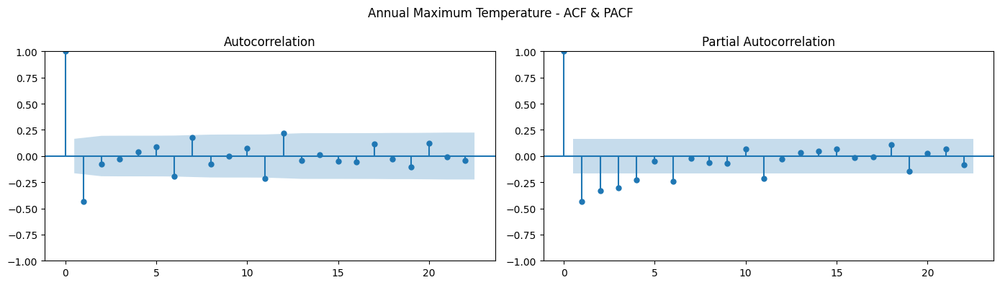

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=82.085, Time=0.34 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=149.246, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=120.757, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=77.889, Time=0.06 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=147.557, Time=0.01 sec
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=79.858, Time=0.11 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=79.849, Time=0.21 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=inf, Time=0.25 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=84.407, Time=0.03 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0] intercept
Total fit time: 1.068 seconds
Selected ARIMA Order: (0, 1, 1)
                               SARIMAX Results                                
Dep. Variable:                MaxTemp   No. Observations:                  143
Model:                 ARIMA(0, 1, 1)   Log Likelihood                 -40.204
Date:                Tue, 06 May 20

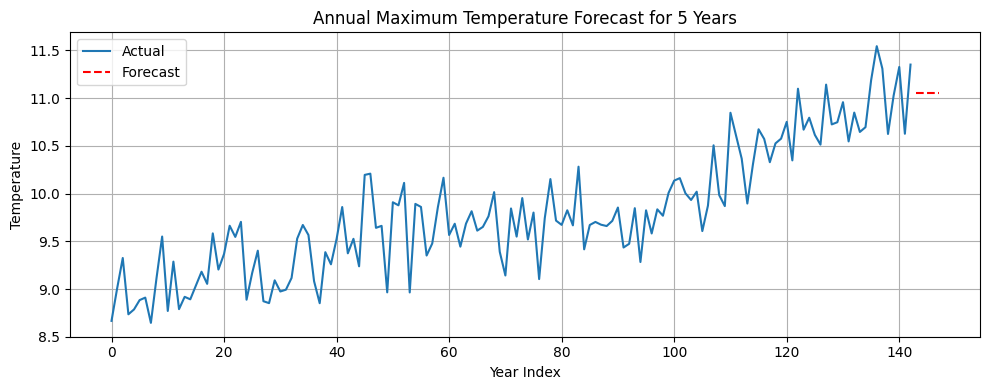


=== Annual Mean Temperature ===


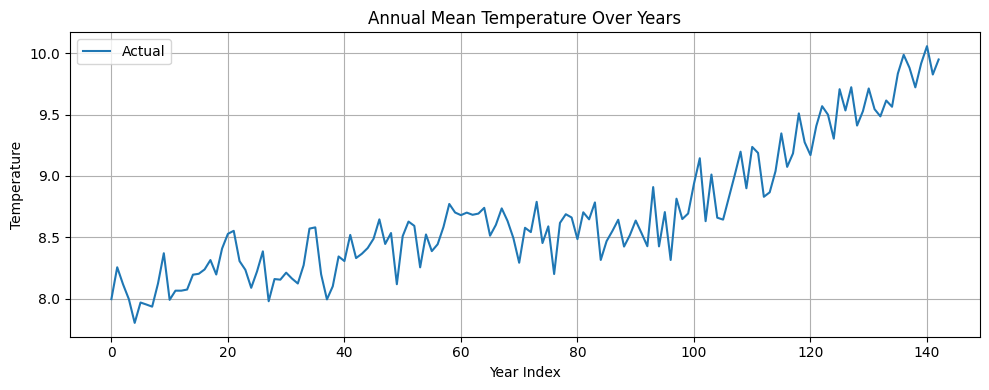


ADF Test - Annual Mean Temperature
ADF Statistic: 1.7800
p-value: 0.9983
=> Non-stationary (p > 0.05)


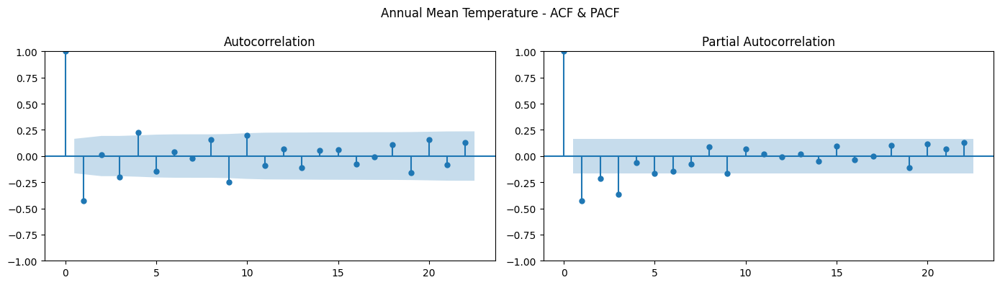

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=-83.595, Time=0.22 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=-32.737, Time=0.04 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=-59.463, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=-84.205, Time=0.06 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=-34.143, Time=0.01 sec
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=-82.957, Time=0.09 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=-82.956, Time=0.09 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=-82.726, Time=0.17 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=-78.140, Time=0.02 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0] intercept
Total fit time: 0.737 seconds
Selected ARIMA Order: (0, 1, 1)
                               SARIMAX Results                                
Dep. Variable:               MeanTemp   No. Observations:                  143
Model:                 ARIMA(0, 1, 1)   Log Likelihood                  41.070
Date:                Tue, 

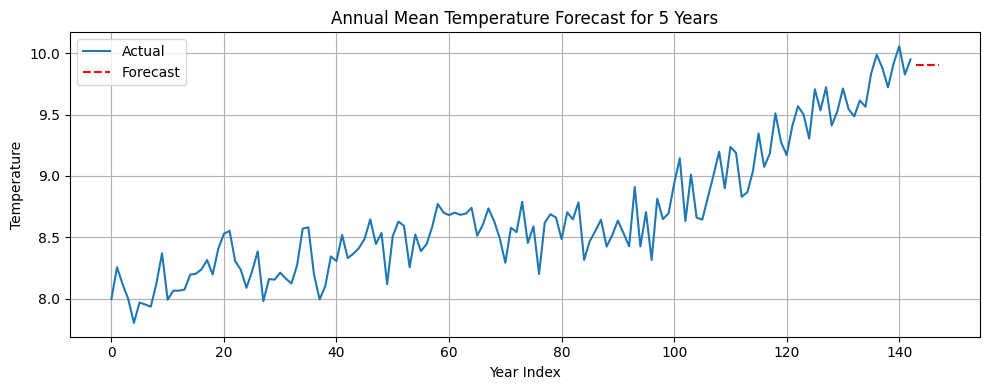


Forecasted Annual Temperatures:
     Year  Min Forecast  Max Forecast  Mean Forecast
143  2023      8.734658     11.052061       9.905106
144  2024      8.734658     11.052061       9.905106
145  2025      8.734658     11.052061       9.905106
146  2026      8.734658     11.052061       9.905106
147  2027      8.734658     11.052061       9.905106


In [15]:
# todays work
#=== Import Libraries ===
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from pmdarima import auto_arima
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_absolute_error, mean_squared_error

# === Step 1: Prepare Data ===
# Assuming df already has 'Year', 'Month', 'Day', 'Temperature', and 'Anomaly' columns

# Convert to datetime and set as index
df['Date'] = pd.to_datetime(df[['Year', 'Month', 'Day']])
df.set_index('Date', inplace=True)

# Retain only needed columns
df = df[['Temperature', 'Anomaly']]

# Add 'Year' column for aggregation
df['Year'] = df.index.year

# === Step 2: Aggregate to Annual Min, Max, Mean ===
annual_stats = df.groupby('Year')['Temperature'].agg(['min', 'max', 'mean']).reset_index()
annual_stats.columns = ['Year', 'MinTemp', 'MaxTemp', 'MeanTemp']
print("Annual Temperature Summary:")
print(annual_stats.head())

# === Step 3: Define ADF Test Function ===
def adf_test(series, title=""):
    result = adfuller(series.dropna())
    print(f"\nADF Test - {title}")
    print(f"ADF Statistic: {result[0]:.4f}")
    print(f"p-value: {result[1]:.4f}")
    if result[1] > 0.05:
        print("=> Non-stationary (p > 0.05)")
    else:
        print("=> Stationary (p <= 0.05)")

# === Step 4: Define Forecasting Function ===
def model_forecast(series, title, forecast_years=5):
    print(f"\n=== {title} ===")
    
    # Plot time series
    plt.figure(figsize=(10, 4))
    plt.plot(series.values, label='Actual')
    plt.title(f'{title} Over Years')
    plt.xlabel('Year Index')
    plt.ylabel('Temperature')
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()
    
    # ADF Test
    adf_test(series, title)
    
    # Differencing
    series_diff = series.diff().dropna()
    
    # ACF and PACF
    fig, axes = plt.subplots(1, 2, figsize=(14, 4))
    plot_acf(series_diff, ax=axes[0])
    plot_pacf(series_diff, ax=axes[1])
    fig.suptitle(f'{title} - ACF & PACF')
    plt.tight_layout()
    plt.show()
    
    # Fit Auto ARIMA
    auto_model = auto_arima(series, seasonal=False, trace=True,
                            error_action='ignore', suppress_warnings=True)
    print(f"Selected ARIMA Order: {auto_model.order}")
    
    # Fit ARIMA model
    model = ARIMA(series, order=auto_model.order)
    model_fit = model.fit()
    print(model_fit.summary())
    
    # Forecast
    forecast = model_fit.forecast(steps=forecast_years)
    forecast_index = np.arange(len(series), len(series) + forecast_years)
    
    # Plot forecast
    plt.figure(figsize=(10, 4))
    plt.plot(series.values, label='Actual')
    plt.plot(forecast_index, forecast, label='Forecast', linestyle='--', color='red')
    plt.title(f'{title} Forecast for {forecast_years} Years')
    plt.xlabel('Year Index')
    plt.ylabel('Temperature')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()
    
    return forecast

# === Step 5: Apply to All Three Series ===
min_forecast = model_forecast(annual_stats['MinTemp'], "Annual Minimum Temperature")
max_forecast = model_forecast(annual_stats['MaxTemp'], "Annual Maximum Temperature")
mean_forecast = model_forecast(annual_stats['MeanTemp'], "Annual Mean Temperature")

# === Step 6: Combine Forecasts into One Table ===
forecast_years = np.arange(annual_stats['Year'].iloc[-1] + 1, annual_stats['Year'].iloc[-1] + 6)
forecast_df = pd.DataFrame({
    'Year': forecast_years,
    'Min Forecast': min_forecast,
    'Max Forecast': max_forecast,
    'Mean Forecast': mean_forecast
})

print("\nForecasted Annual Temperatures:")
print(forecast_df)


In [22]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_absolute_error, mean_squared_error


# Convert to datetime if not already
if 'Date' in df.columns:
    df['Date'] = pd.to_datetime(df['Date'])
    df.set_index('Date', inplace=True)

# Set year column for grouping
df['Year'] = df.index.year

# Initialize parameters
group_size = 10
start_year = 1880
end_year = 2020

# Function to perform ADF test
def adf_test(series):
    result = adfuller(series.dropna())
    return result[0], result[1]

# Store results
mae_rmse_arima_results = []

# Loop over 20-year groups
for start in range(start_year, end_year, group_size):
    df_group = df[(df['Year'] >= start) & (df['Year'] < start + group_size)].copy()
    if len(df_group) < 40:  # skip very small samples
        continue

    # ADF Test
    _, pval = adf_test(df_group['Temperature'])
    if pval > 0.05:
        df_group['Temperature_Diff'] = df_group['Temperature'].diff()
        diff_data = df_group['Temperature_Diff'].dropna()
    else:
        diff_data = df_group['Temperature']

    # Fit ARIMA (5,1,2) arbitrarily; in full work, ACF/PACF should guide p,d,q
    try:
        model = ARIMA(df_group['Temperature'], order=(5,1,2))
        arima_result = model.fit()

        # Forecast last 4 days
        forecast = arima_result.forecast(steps=4)
        y_actual = df_group['Temperature'][-4:]
        y_pred = forecast[:4]

        # Compute MAE and RMSE
        mae = mean_absolute_error(y_actual, y_pred)
        rmse = np.sqrt(mean_squared_error(y_actual, y_pred))
        mae_rmse_arima_results.append([f"{start}-{start + group_size}", mae, rmse])
    except:
        continue

# Create results DataFrame
results_arima_df = pd.DataFrame(mae_rmse_arima_results, columns=["Time Period", "ARIMA_MAE", "ARIMA_RMSE"])
results_arima_df



AttributeError: 'RangeIndex' object has no attribute 'year'

# lstm models 



Analyzing period: 1880-1890


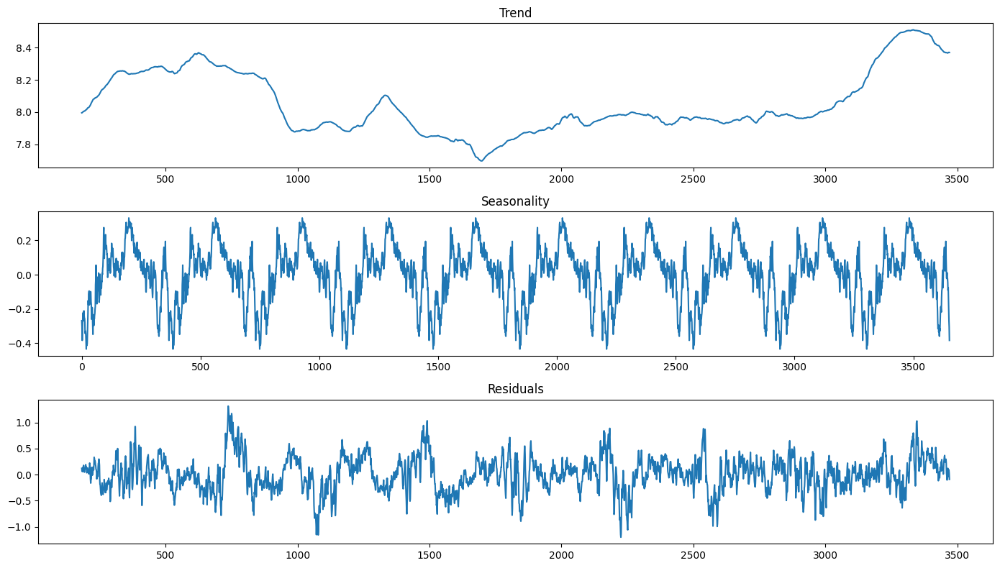

Epoch 1/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - loss: 0.0464
Epoch 2/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0066
Epoch 3/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0063
Epoch 4/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - loss: 0.0044
Epoch 5/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - loss: 0.0032
Epoch 6/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0023
Epoch 7/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0020
Epoch 8/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - loss: 0.0020
Epoch 9/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0021
Epoch 10/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0016
Epoch 11/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0019
Epoch 12/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - loss: 0.0016
Epoch 13/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - loss: 0.0016
Epoch 14/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0017
Epoch 15/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s

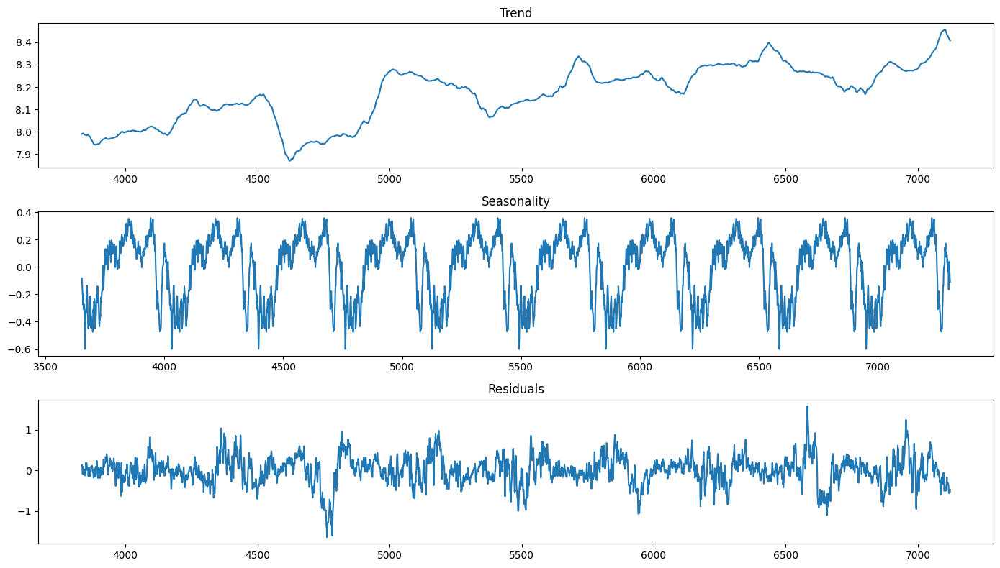

Epoch 1/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 4s 10ms/step - loss: 0.0894
Epoch 2/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - loss: 0.0053
Epoch 3/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0045
Epoch 4/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0039
Epoch 5/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0030
Epoch 6/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0026
Epoch 7/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0022
Epoch 8/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0021
Epoch 9/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0015
Epoch 10/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0017
Epoch 11/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0016
Epoch 12/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0017
Epoch 13/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0015
Epoch 14/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0016
Epoch 15/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s

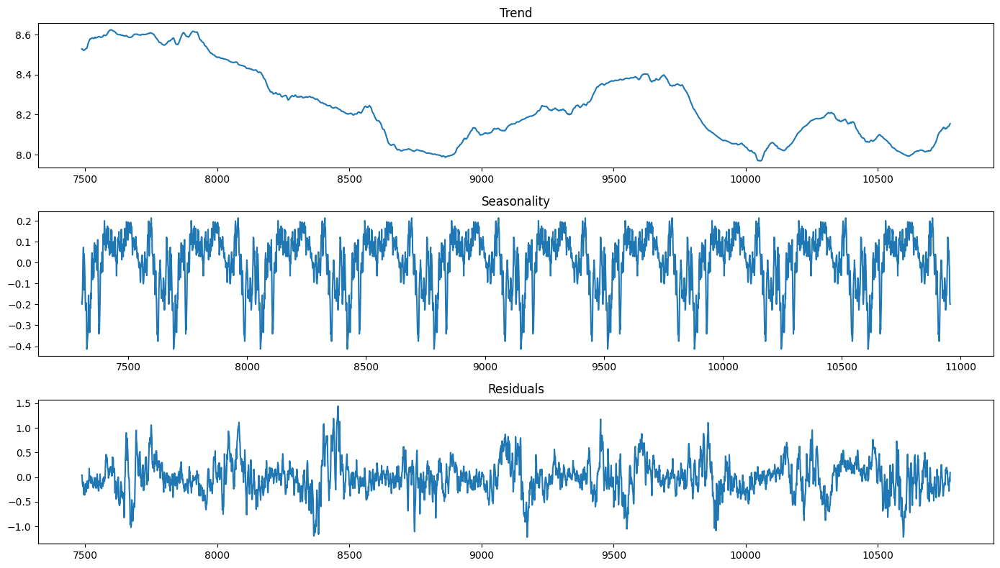

Epoch 1/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 4s 10ms/step - loss: 0.0802
Epoch 2/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - loss: 0.0097
Epoch 3/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0072
Epoch 4/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0062
Epoch 5/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0046
Epoch 6/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0038
Epoch 7/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0038
Epoch 8/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0029
Epoch 9/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0025
Epoch 10/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0025
Epoch 11/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0026
Epoch 12/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0022
Epoch 13/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0022
Epoch 14/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0024
Epoch 15/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s

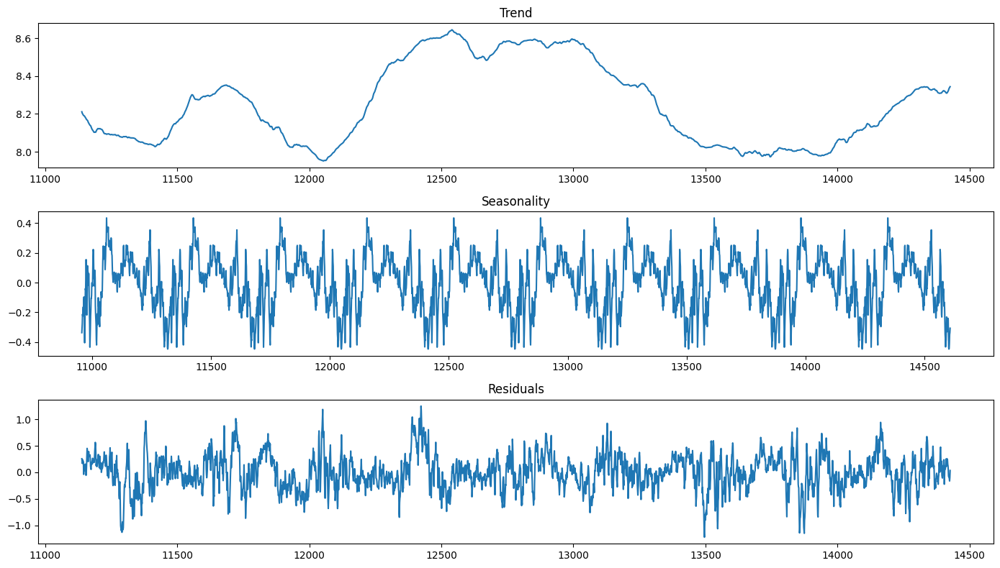

Epoch 1/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 4s 10ms/step - loss: 0.0872
Epoch 2/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - loss: 0.0095
Epoch 3/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - loss: 0.0086
Epoch 4/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0069
Epoch 5/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0063
Epoch 6/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0048
Epoch 7/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0031
Epoch 8/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0024
Epoch 9/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0022
Epoch 10/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0023
Epoch 11/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0020
Epoch 12/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0019
Epoch 13/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0019
Epoch 14/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - loss: 0.0024
Epoch 15/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s

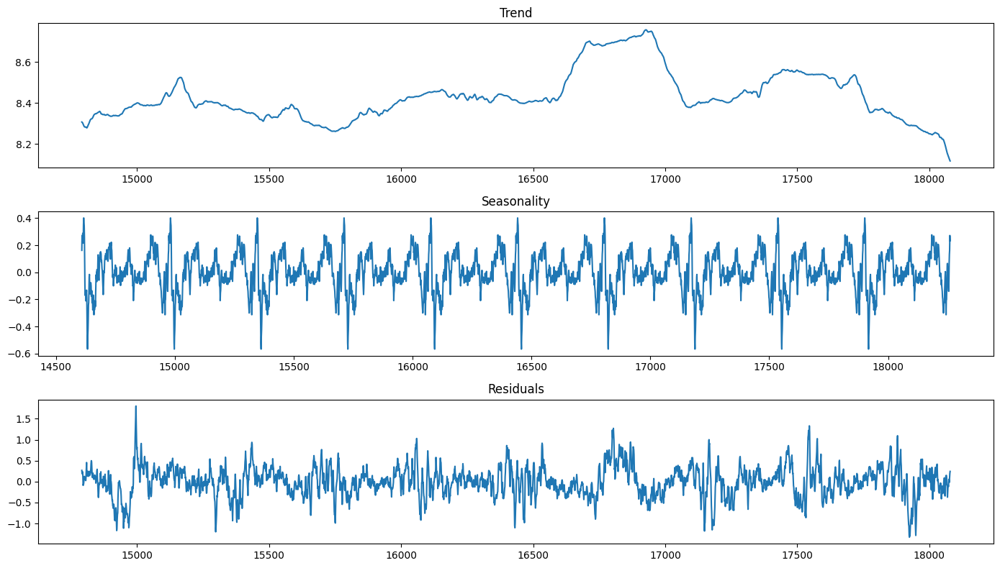

Epoch 1/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - loss: 0.0709
Epoch 2/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0073
Epoch 3/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - loss: 0.0059
Epoch 4/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0042
Epoch 5/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0032
Epoch 6/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0024
Epoch 7/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - loss: 0.0019
Epoch 8/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0022
Epoch 9/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - loss: 0.0017
Epoch 10/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - loss: 0.0017
Epoch 11/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - loss: 0.0021
Epoch 12/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - loss: 0.0015
Epoch 13/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - loss: 0.0017
Epoch 14/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - loss: 0.0015
Epoch 15/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s

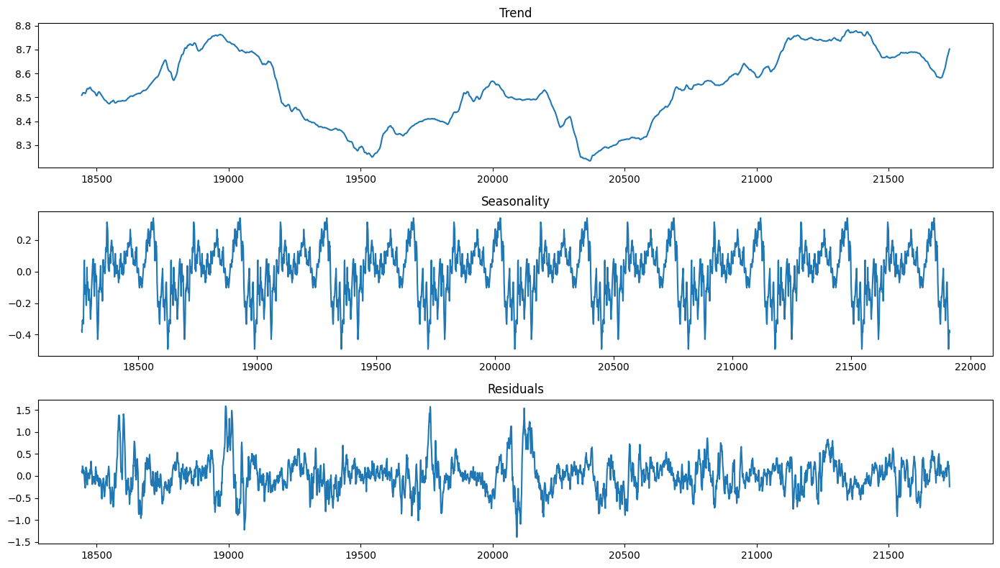

Epoch 1/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - loss: 0.0624
Epoch 2/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - loss: 0.0102
Epoch 3/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0092
Epoch 4/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - loss: 0.0062
Epoch 5/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - loss: 0.0052
Epoch 6/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - loss: 0.0041
Epoch 7/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - loss: 0.0038
Epoch 8/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0024
Epoch 9/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - loss: 0.0024
Epoch 10/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - loss: 0.0020
Epoch 11/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0022
Epoch 12/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - loss: 0.0023
Epoch 13/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0017
Epoch 14/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0017
Epoch 15/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s

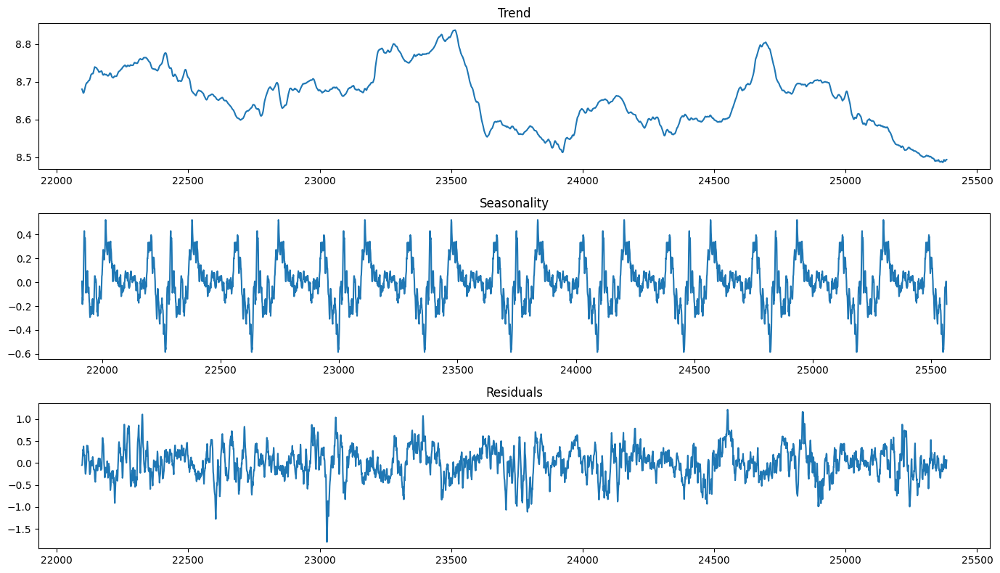

Epoch 1/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 4s 10ms/step - loss: 0.0917
Epoch 2/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0099
Epoch 3/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0078
Epoch 4/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - loss: 0.0054
Epoch 5/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0041
Epoch 6/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - loss: 0.0030
Epoch 7/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step - loss: 0.0026
Epoch 8/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - loss: 0.0026
Epoch 9/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0022
Epoch 10/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - loss: 0.0020
Epoch 11/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - loss: 0.0018
Epoch 12/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0019
Epoch 13/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - loss: 0.0023
Epoch 14/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 0.0018
Epoch 15/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s

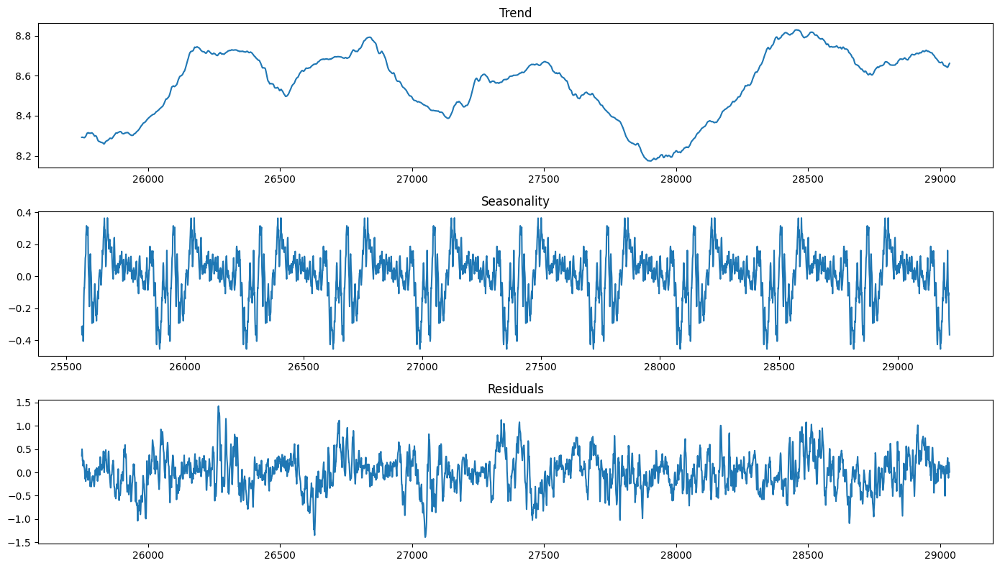

Epoch 1/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 4s 9ms/step - loss: 0.0692
Epoch 2/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - loss: 0.0111
Epoch 3/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0076
Epoch 4/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0055
Epoch 5/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0045
Epoch 6/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0035
Epoch 7/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0027
Epoch 8/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0025
Epoch 9/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0022
Epoch 10/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0021
Epoch 11/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0022
Epoch 12/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0021
Epoch 13/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0021
Epoch 14/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0018
Epoch 15/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 

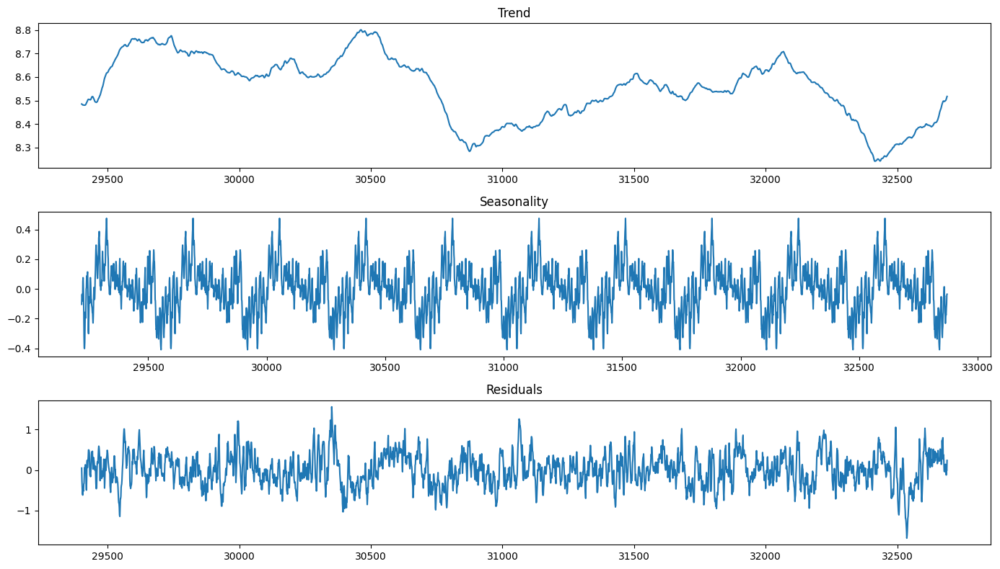

Epoch 1/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - loss: 0.0446
Epoch 2/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0102
Epoch 3/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0090
Epoch 4/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0086
Epoch 5/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0076
Epoch 6/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0068
Epoch 7/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0048
Epoch 8/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0038
Epoch 9/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0031
Epoch 10/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - loss: 0.0025
Epoch 11/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - loss: 0.0023
Epoch 12/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0019
Epoch 13/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0018
Epoch 14/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0018
Epoch 15/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s

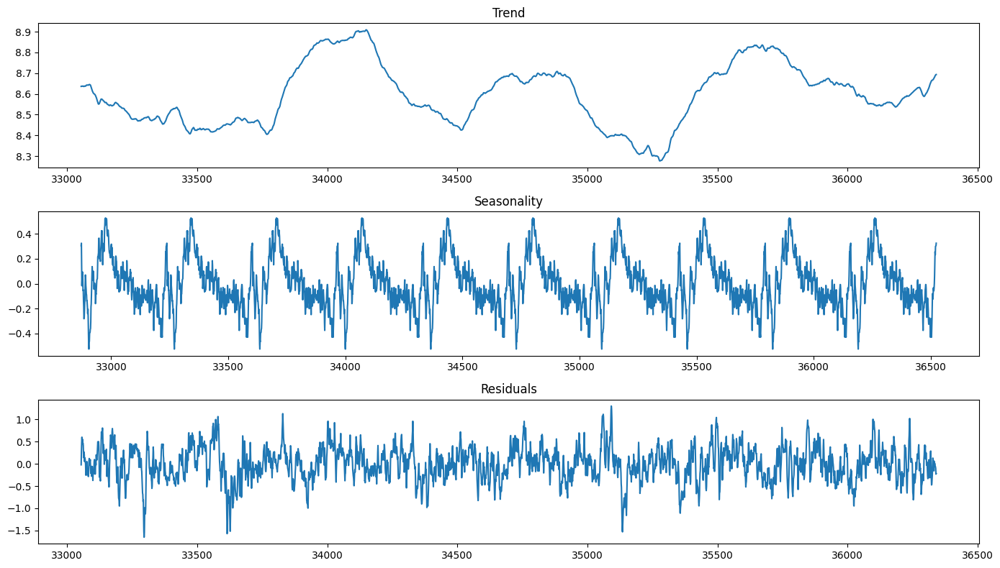

Epoch 1/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - loss: 0.0824
Epoch 2/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0103
Epoch 3/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0076
Epoch 4/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0059
Epoch 5/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0042
Epoch 6/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0038
Epoch 7/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0031
Epoch 8/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0026
Epoch 9/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0020
Epoch 10/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0031
Epoch 11/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0024
Epoch 12/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0020
Epoch 13/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0020
Epoch 14/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0020
Epoch 15/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s

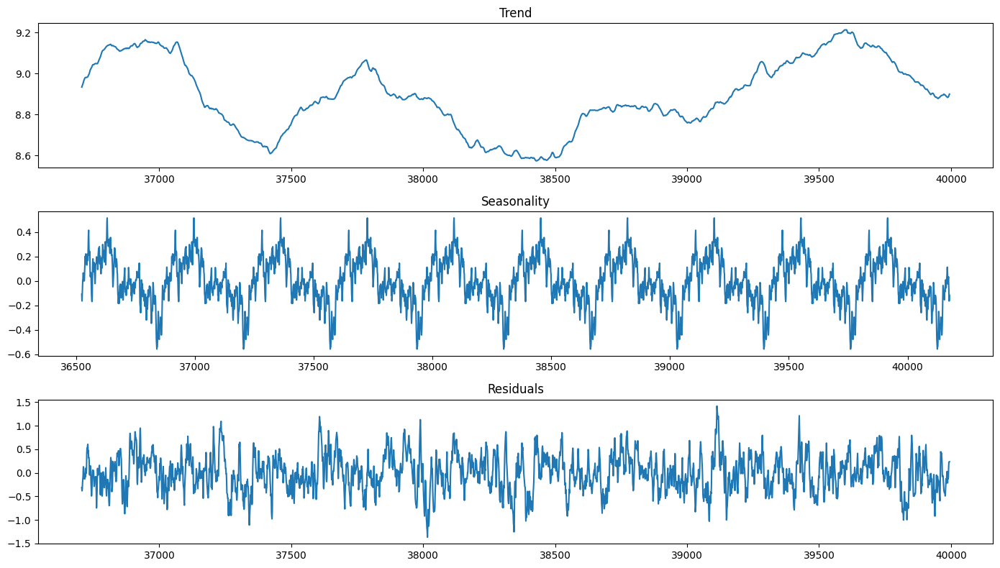

Epoch 1/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 4s 9ms/step - loss: 0.0805
Epoch 2/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - loss: 0.0123
Epoch 3/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0077
Epoch 4/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - loss: 0.0058
Epoch 5/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - loss: 0.0036
Epoch 6/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0033
Epoch 7/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - loss: 0.0033
Epoch 8/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - loss: 0.0027
Epoch 9/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - loss: 0.0029
Epoch 10/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - loss: 0.0023
Epoch 11/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - loss: 0.0021
Epoch 12/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0022
Epoch 13/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0023
Epoch 14/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0025
Epoch 15/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 

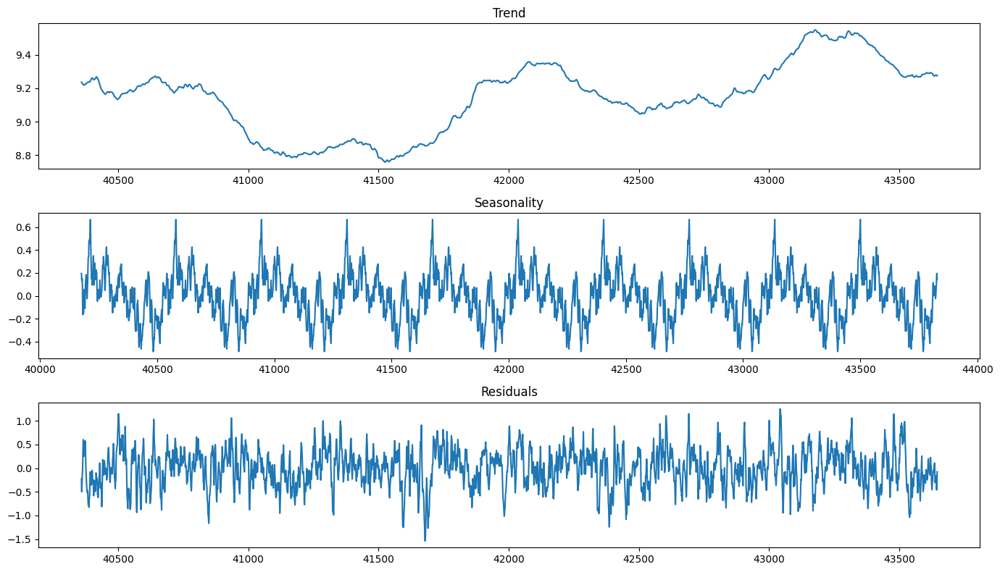

Epoch 1/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - loss: 0.0741
Epoch 2/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0112
Epoch 3/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0089
Epoch 4/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0073
Epoch 5/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0048
Epoch 6/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0038
Epoch 7/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0032
Epoch 8/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - loss: 0.0029
Epoch 9/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - loss: 0.0026
Epoch 10/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0021
Epoch 11/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - loss: 0.0024
Epoch 12/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - loss: 0.0021
Epoch 13/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0020
Epoch 14/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0019
Epoch 15/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s

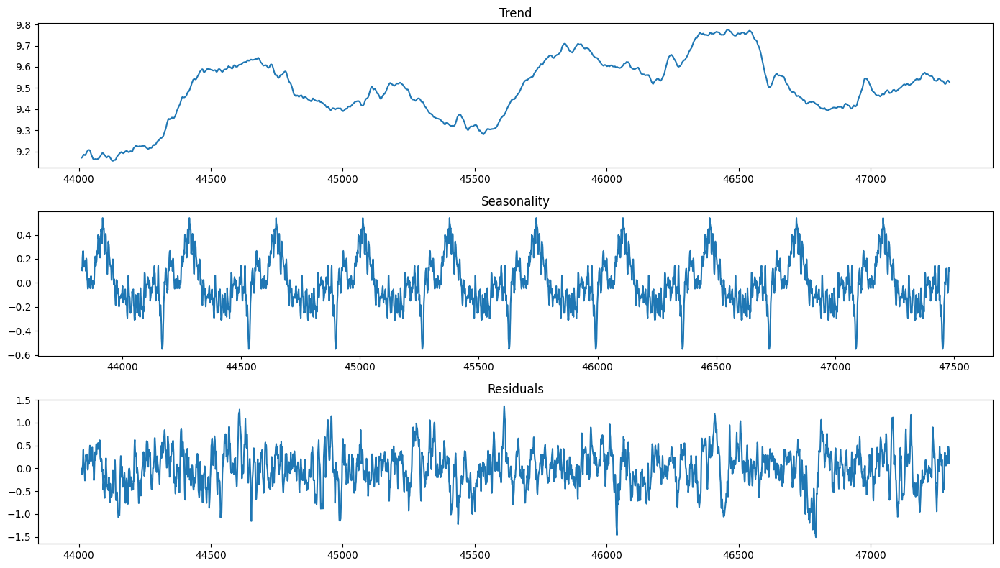

Epoch 1/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - loss: 0.0526
Epoch 2/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0107
Epoch 3/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0090
Epoch 4/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0059
Epoch 5/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0042
Epoch 6/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0032
Epoch 7/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0028
Epoch 8/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0024
Epoch 9/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - loss: 0.0021
Epoch 10/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - loss: 0.0022
Epoch 11/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0022
Epoch 12/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0021
Epoch 13/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0021
Epoch 14/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - loss: 0.0021
Epoch 15/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s

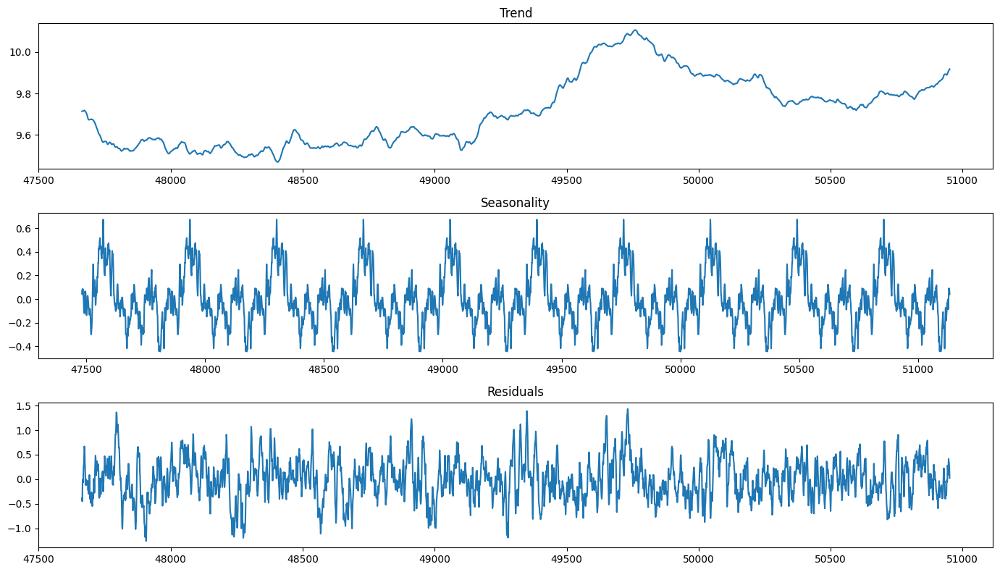

Epoch 1/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - loss: 0.0759
Epoch 2/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - loss: 0.0119
Epoch 3/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0085
Epoch 4/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0051
Epoch 5/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0033
Epoch 6/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0028
Epoch 7/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0040
Epoch 8/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0020
Epoch 9/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0025
Epoch 10/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0019
Epoch 11/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0022
Epoch 12/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0020
Epoch 13/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0020
Epoch 14/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0021
Epoch 15/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 2s

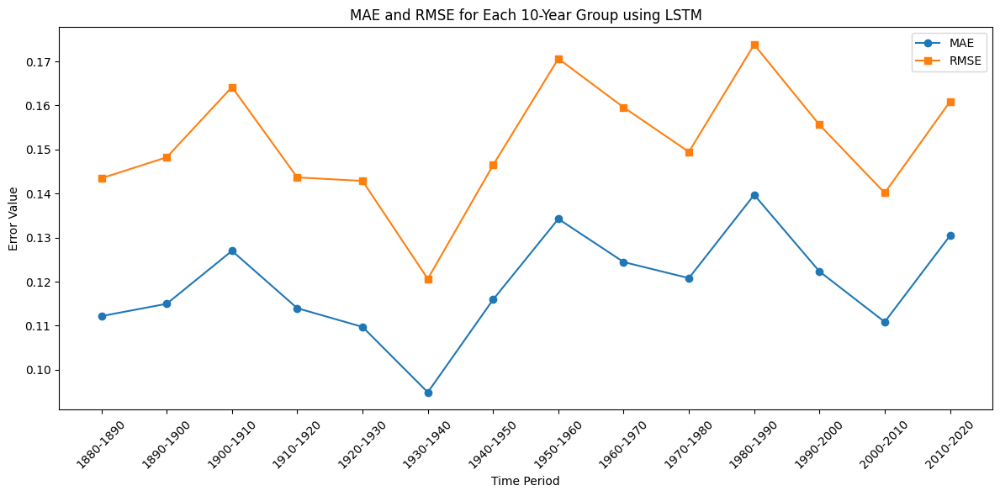

In [8]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.seasonal import seasonal_decompose

from sklearn.metrics import mean_absolute_error, mean_squared_error
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split

import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense

# Define group range
group_size = 10
start_year = 1880
end_year = 2020

# ADF Test
def adf_test(series):
    result = adfuller(series.dropna())
    print(f"ADF Statistic: {result[0]}")
    print(f"p-value: {result[1]}")
    if result[1] > 0.05:
        print("Non-stationary series (p > 0.05)")
    else:
        print("Stationary series (p <= 0.05)")

# Function to create sequences for LSTM
def create_sequences(data, seq_length=10):
    X, y = [], []
    for i in range(len(data) - seq_length):
        X.append(data[i:i + seq_length])
        y.append(data[i + seq_length])
    return np.array(X), np.array(y)

# Assuming df is already loaded and contains 'Year' and 'Temperature'
mae_rmse_results = []

for start in range(start_year, end_year, group_size):
    df_group = df[(df['Year'] >= start) & (df['Year'] < start + group_size)].copy()
    print(f"\nAnalyzing period: {start}-{start + group_size}")

    # Decompose time series
    decomposition = seasonal_decompose(df_group['Temperature'], model='additive', period=365)
    fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(14, 8))
    decomposition.trend.plot(ax=ax1, title='Trend')
    decomposition.seasonal.plot(ax=ax2, title='Seasonality')
    decomposition.resid.plot(ax=ax3, title='Residuals')
    plt.tight_layout()
    plt.show()

    # Normalize Data
    scaler = MinMaxScaler(feature_range=(0, 1))
    df_group['Temperature_Scaled'] = scaler.fit_transform(df_group[['Temperature']])

    # Prepare Sequences for LSTM
    seq_length = 30  # Using 30 days of past data
    X, y = create_sequences(df_group['Temperature_Scaled'].values, seq_length)

    # Reshape for LSTM
    X = X.reshape((X.shape[0], X.shape[1], 1))

    # Train-Test Split
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=False)

    # Build LSTM Model
    model = Sequential([
        LSTM(50, activation='relu', return_sequences=True, input_shape=(seq_length, 1)),
        LSTM(50, activation='relu'),
        Dense(1)
    ])
    model.compile(optimizer='adam', loss='mse')

    # Train Model
    model.fit(X_train, y_train, epochs=20, batch_size=16, verbose=1)

    # Predictions
    y_pred_lstm = model.predict(X_test)
    y_pred_lstm = scaler.inverse_transform(y_pred_lstm)

    # Evaluate Performance
    y_test_actual = scaler.inverse_transform(y_test.reshape(-1, 1))
    mae_lstm = mean_absolute_error(y_test_actual, y_pred_lstm)
    rmse_lstm = np.sqrt(mean_squared_error(y_test_actual, y_pred_lstm))

    # Store Results
    mae_rmse_results.append([f"{start}-{start + group_size}", mae_lstm, rmse_lstm])
    print(f'LSTM MAE ({start}-{start + group_size}): {mae_lstm:.4f}, RMSE: {rmse_lstm:.4f}')

# Create DataFrame for Results
results_df = pd.DataFrame(mae_rmse_results, columns=["Time Period", "MAE", "RMSE"])
print("\nSummary of LSTM Performance:")
print(results_df)

# Plot Results
plt.figure(figsize=(12, 6))
plt.plot(results_df["Time Period"], results_df["MAE"], marker='o', label="MAE")
plt.plot(results_df["Time Period"], results_df["RMSE"], marker='s', label="RMSE")
plt.xlabel("Time Period")
plt.ylabel("Error Value")
plt.title("MAE and RMSE for Each 10-Year Group using LSTM")
plt.xticks(rotation=45)
plt.legend()
plt.tight_layout()
plt.show()


In [ ]:
#yearly Avg

In [76]:
# Calculate yearly average
df_yearly = df.groupby('Year')['Temperature'].mean().reset_index()

# Calculate 5-year average
df['5YearGroup'] = (df['Year'] // 5) * 5
df_5year = df.groupby('5YearGroup')['Temperature'].mean().reset_index()


In [77]:
from statsmodels.tsa.seasonal import seasonal_decompose

def train_lstm_on_series(series, label=""):
    # ---------- Decomposition ----------
    try:
        decomposition = seasonal_decompose(series, model='additive', period=1)
        fig, axs = plt.subplots(3, 1, figsize=(12, 8))
        decomposition.trend.plot(ax=axs[0], title='Trend')
        decomposition.seasonal.plot(ax=axs[1], title='Seasonality')
        decomposition.resid.plot(ax=axs[2], title='Residuals')
        plt.suptitle(f"Decomposition Analysis - {label}", fontsize=14)
        plt.tight_layout()
        plt.show()
    except Exception as e:
        print(f"Decomposition failed: {e}")

    # ---------- Normalize ----------
    scaler = MinMaxScaler()
    series_scaled = scaler.fit_transform(series.values.reshape(-1, 1))

    # ---------- Create Sequences ----------
    seq_length = 5
    X, y = create_sequences(series_scaled, seq_length)
    X = X.reshape((X.shape[0], X.shape[1], 1))

    # ---------- Train-test Split ----------
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=False)

    # ---------- Build and Train LSTM ----------
    model = Sequential([
        LSTM(50, activation='relu', return_sequences=True, input_shape=(seq_length, 1)),
        LSTM(50, activation='relu'),
        Dense(1)
    ])
    model.compile(optimizer='adam', loss='mse')
    model.fit(X_train, y_train, epochs=50, batch_size=8, verbose=1)

    # ---------- Prediction ----------
    y_pred = model.predict(X_test)
    y_pred_inv = scaler.inverse_transform(y_pred)
    y_test_inv = scaler.inverse_transform(y_test.reshape(-1, 1))

    # ---------- Evaluation ----------
    mae = mean_absolute_error(y_test_inv, y_pred_inv)
    rmse = np.sqrt(mean_squared_error(y_test_inv, y_pred_inv))

    print(f"\nLSTM Performance ({label}):")
    print(f"MAE: {mae:.4f}")
    print(f"RMSE: {rmse:.4f}")

    # ---------- Plot Prediction ----------
    plt.figure(figsize=(10, 4))
    plt.plot(y_test_inv, label='Actual')
    plt.plot(y_pred_inv, label='Predicted')
    plt.title(f"LSTM Prediction - {label}")
    plt.legend()
    plt.tight_layout()
    plt.show()

    return model


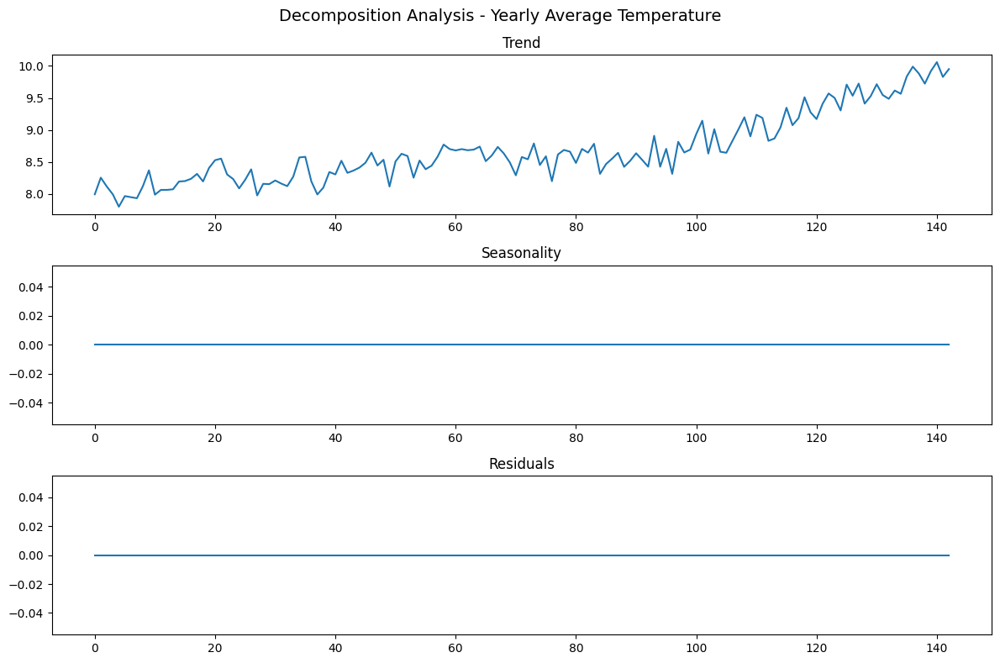

Epoch 1/50
14/14 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - loss: 0.0807
Epoch 2/50
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0259 
Epoch 3/50
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0135 
Epoch 4/50
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0101 
Epoch 5/50
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0084 
Epoch 6/50
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0076 
Epoch 7/50
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0080 
Epoch 8/50
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0069 
Epoch 9/50
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0070 
Epoch 10/50
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0077 
Epoch 11/50
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0068 
Epoch 12/50
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0069 
Epoch 13/50
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0056 
Epoch 14/50
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0081 
Epoch 15/50
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0062 
Epoch

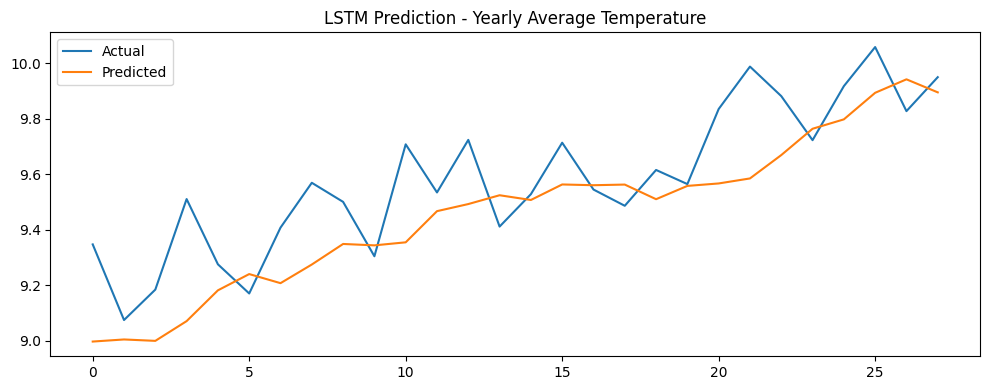

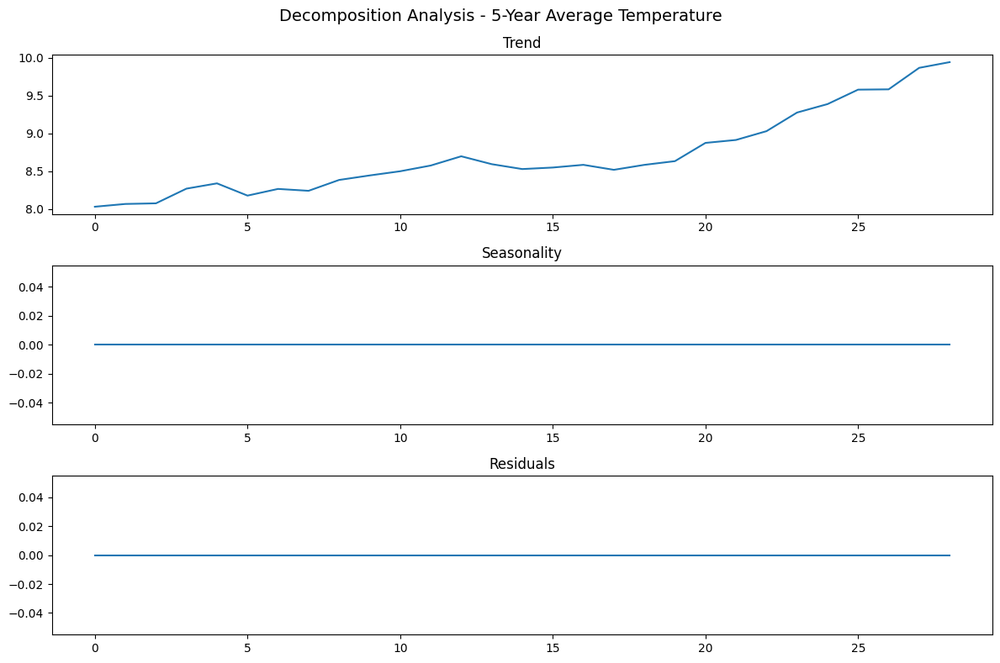

Epoch 1/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - loss: 0.1031
Epoch 2/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0984 
Epoch 3/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0831 
Epoch 4/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0715 
Epoch 5/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0631 
Epoch 6/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0548 
Epoch 7/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0338 
Epoch 8/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0319 
Epoch 9/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0183 
Epoch 10/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0196 
Epoch 11/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0156 
Epoch 12/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0162 
Epoch 13/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0143 
Epoch 14/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0122 
Epoch 15/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0118 
Epoch 16/50
3/3 ━━━━━━━━━━━━━━━━━━━

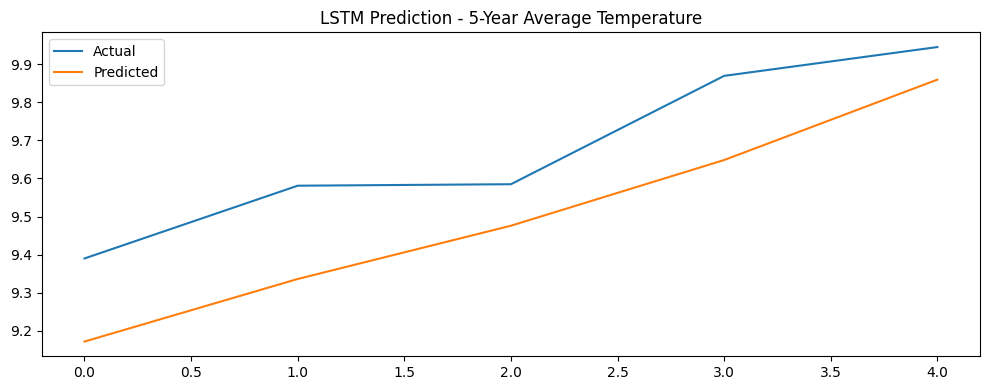

<Sequential name=sequential_58, built=True>

In [78]:
# Yearly model
train_lstm_on_series(df_yearly['Temperature'], label="Yearly Average Temperature")

# 5-Year model
train_lstm_on_series(df_5year['Temperature'], label="5-Year Average Temperature")


In [79]:
def forecast_future(model, series, years, scaler, seq_length=5):
    """Forecast future temperature values"""
    predictions = []
    input_seq = scaler.transform(series[-seq_length:].values.reshape(-1, 1)).tolist()

    for _ in range(years):
        # Prepare input for prediction
        X_input = np.array(input_seq[-seq_length:]).reshape((1, seq_length, 1))
        next_pred = model.predict(X_input, verbose=0)[0][0]
        predictions.append(next_pred)
        input_seq.append([next_pred])  # keep the sequence growing

    # Inverse scale predictions
    predictions_inv = scaler.inverse_transform(np.array(predictions).reshape(-1, 1)).flatten()
    return predictions_inv


Epoch 1/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - loss: 0.1897
Epoch 2/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0342 
Epoch 3/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0143
Epoch 4/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0094 
Epoch 5/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0078
Epoch 6/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0065
Epoch 7/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0058 
Epoch 8/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0080
Epoch 9/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0064
Epoch 10/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0065 
Epoch 11/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0083
Epoch 12/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0078
Epoch 13/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0077
Epoch 14/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0075
Epoch 15/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0061
Epoch 16/50
18/

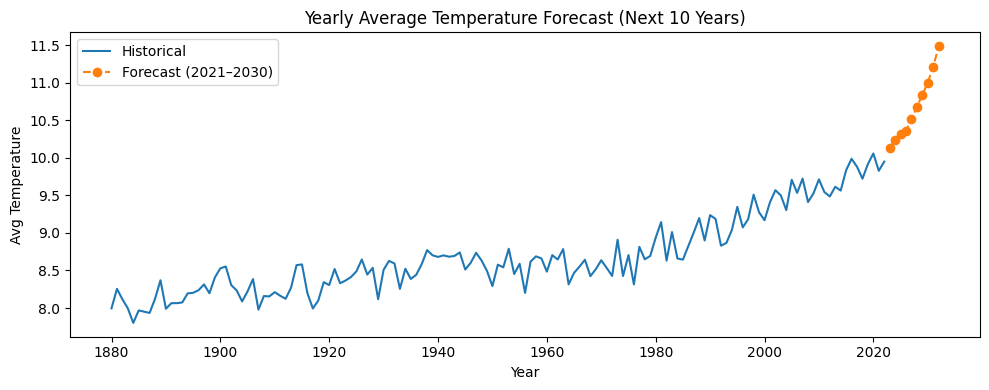


Forecasted Temperatures (2021–2030):
   Year  Predicted Temperature
0  2023              10.131828
1  2024              10.244645
2  2025              10.313853
3  2026              10.359425
4  2027              10.512465
5  2028              10.681719
6  2029              10.837123
7  2030              11.003424
8  2031              11.210398
9  2032              11.487922


In [80]:
# Train on full data for forecasting
scaler = MinMaxScaler()
series_scaled = scaler.fit_transform(df_yearly['Temperature'].values.reshape(-1, 1))

# Re-train model on entire dataset
X_full, y_full = create_sequences(series_scaled, seq_length=5)
X_full = X_full.reshape((X_full.shape[0], X_full.shape[1], 1))
model_full = Sequential([
    LSTM(50, activation='relu', return_sequences=True, input_shape=(5, 1)),
    LSTM(50, activation='relu'),
    Dense(1)
])
model_full.compile(optimizer='adam', loss='mse')
model_full.fit(X_full, y_full, epochs=50, batch_size=8, verbose=1)

# Forecast next 10 years
future_years = list(range(df_yearly['Year'].iloc[-1] + 1, df_yearly['Year'].iloc[-1] + 11))
future_predictions = forecast_future(model_full, df_yearly['Temperature'], 10, scaler)

# Plot
plt.figure(figsize=(10, 4))
plt.plot(df_yearly['Year'], df_yearly['Temperature'], label='Historical')
plt.plot(future_years, future_predictions, label='Forecast (2021–2030)', linestyle='--', marker='o')
plt.xlabel("Year")
plt.ylabel("Avg Temperature")
plt.title("Yearly Average Temperature Forecast (Next 10 Years)")
plt.legend()
plt.tight_layout()
plt.show()

# Print values
forecast_df = pd.DataFrame({'Year': future_years, 'Predicted Temperature': future_predictions})
print("\nForecasted Temperatures (2021–2030):")
print(forecast_df)


In [81]:
from sklearn.metrics import mean_absolute_error, mean_squared_error
import numpy as np

# Predictions on training data
train_predictions = model_full.predict(X_full)
train_predictions_inverse = scaler.inverse_transform(train_predictions)
y_full_inverse = scaler.inverse_transform(y_full.reshape(-1, 1))

# Calculate MAE and RMSE
mae = mean_absolute_error(y_full_inverse, train_predictions_inverse)
rmse = np.sqrt(mean_squared_error(y_full_inverse, train_predictions_inverse))

print(f"Training MAE: {mae:.4f}")
print(f"Training RMSE: {rmse:.4f}")


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step  
Training MAE: 0.1495
Training RMSE: 0.1880


In [ ]:
#maximum

In [82]:

df_yearly_max = df.groupby('Year')['Temperature'].max().reset_index()

# Calculate 5-year average
df['5YearGroup'] = (df['Year'] // 5) * 5
df_5year_max = df.groupby('5YearGroup')['Temperature'].max().reset_index()


In [83]:
def train_lstm_on_series(series, label=""):
    # Normalize
    scaler = MinMaxScaler()
    series_scaled = scaler.fit_transform(series.values.reshape(-1, 1))

    # Create sequences
    seq_length = 5
    X, y = create_sequences(series_scaled, seq_length)
    X = X.reshape((X.shape[0], X.shape[1], 1))

    # Train-test split
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=False)

    # Model
    model = Sequential([
        LSTM(50, activation='relu', return_sequences=True, input_shape=(seq_length, 1)),
        LSTM(50, activation='relu'),
        Dense(1)
    ])
    model.compile(optimizer='adam', loss='mse')
    model.fit(X_train, y_train, epochs=50, batch_size=8, verbose=1)

    # Predict and inverse transform
    y_pred = model.predict(X_test)
    y_pred_inv = scaler.inverse_transform(y_pred)
    y_test_inv = scaler.inverse_transform(y_test.reshape(-1, 1))

    # Metrics
    mae = mean_absolute_error(y_test_inv, y_pred_inv)
    rmse = np.sqrt(mean_squared_error(y_test_inv, y_pred_inv))

    print(f"\nLSTM Performance ({label}):")
    print(f"MAE: {mae:.4f}")
    print(f"RMSE: {rmse:.4f}")

    # Plot
    plt.figure(figsize=(10, 4))
    plt.plot(y_test_inv, label='Actual')
    plt.plot(y_pred_inv, label='Predicted')
    plt.title(f"LSTM Prediction - {label}")
    plt.legend()
    plt.tight_layout()
    plt.show()

    return model


Epoch 1/50
14/14 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - loss: 0.1265
Epoch 2/50
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0713 
Epoch 3/50
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0172 
Epoch 4/50
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0184 
Epoch 5/50
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0146 
Epoch 6/50
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0147 
Epoch 7/50
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0162 
Epoch 8/50
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0121 
Epoch 9/50
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0150 
Epoch 10/50
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0151 
Epoch 11/50
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0126 
Epoch 12/50
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0140 
Epoch 13/50
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0147 
Epoch 14/50
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0106 
Epoch 15/50
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0133  
Epoc

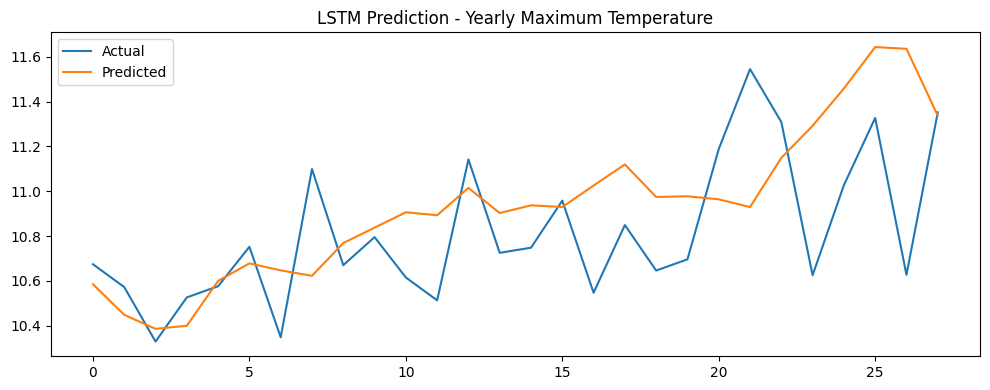

Epoch 1/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 11s 9ms/step - loss: 0.1241
Epoch 2/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.1160 
Epoch 3/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.1147 
Epoch 4/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.1011 
Epoch 5/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.1003 
Epoch 6/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0826 
Epoch 7/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0656 
Epoch 8/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0452 
Epoch 9/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0482 
Epoch 10/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0258 
Epoch 11/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0306 
Epoch 12/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0180 
Epoch 13/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0217 
Epoch 14/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0195 
Epoch 15/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0232 
Epoch 16/50
3/3 ━━━━━━━━━━━━━━━━━━

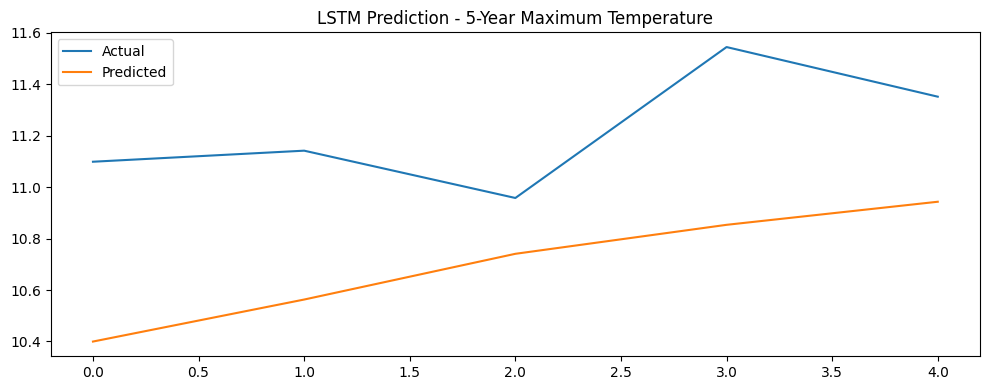

<Sequential name=sequential_61, built=True>

In [84]:
# Yearly model
train_lstm_on_series(df_yearly_max['Temperature'], label="Yearly Maximum Temperature")

# 5-Year model
train_lstm_on_series(df_5year_max['Temperature'], label="5-Year Maximum Temperature")


Epoch 1/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - loss: 0.1930
Epoch 2/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.1303
Epoch 3/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0229
Epoch 4/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0170
Epoch 5/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0128
Epoch 6/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0143
Epoch 7/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0173
Epoch 8/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0149
Epoch 9/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0121
Epoch 10/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0141
Epoch 11/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0146
Epoch 12/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0131
Epoch 13/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0114
Epoch 14/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0143
Epoch 15/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0123
Epoch 16/50
18/18 ━

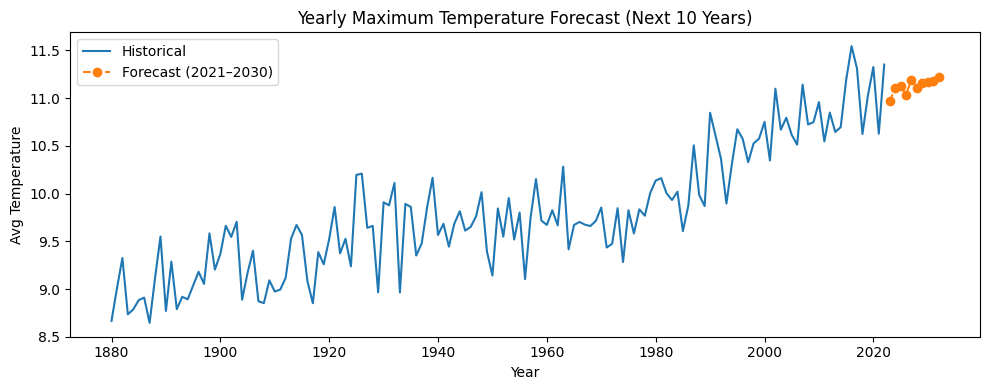


Forecasted Temperatures (2021–2030):
   Year  Predicted Temperature
0  2023              10.965582
1  2024              11.104560
2  2025              11.125016
3  2026              11.038007
4  2027              11.193894
5  2028              11.110917
6  2029              11.161086
7  2030              11.170912
8  2031              11.177361
9  2032              11.220439


In [85]:
# Train on full data for forecasting
scaler = MinMaxScaler()
series_scaled = scaler.fit_transform(df_yearly_max['Temperature'].values.reshape(-1, 1))

# Re-train model on entire dataset
X_full, y_full = create_sequences(series_scaled, seq_length=5)
X_full = X_full.reshape((X_full.shape[0], X_full.shape[1], 1))
model_full = Sequential([
    LSTM(50, activation='relu', return_sequences=True, input_shape=(5, 1)),
    LSTM(50, activation='relu'),
    Dense(1)
])
model_full.compile(optimizer='adam', loss='mse')
model_full.fit(X_full, y_full, epochs=50, batch_size=8, verbose=1)

# Forecast next 10 years
future_years = list(range(df_yearly_max['Year'].iloc[-1] + 1, df_yearly_max['Year'].iloc[-1] + 11))
future_predictions = forecast_future(model_full, df_yearly_max['Temperature'], 10, scaler)

# Plot
plt.figure(figsize=(10, 4))
plt.plot(df_yearly_max['Year'], df_yearly_max['Temperature'], label='Historical')
plt.plot(future_years, future_predictions, label='Forecast (2021–2030)', linestyle='--', marker='o')
plt.xlabel("Year")
plt.ylabel("Avg Temperature")
plt.title("Yearly Maximum Temperature Forecast (Next 10 Years)")
plt.legend()
plt.tight_layout()
plt.savefig(r"C:\Users\marat\OneDrive\Pictures\lstm maximum forecast.jpg", format='jpg', dpi=300)
plt.show()

  # dpi controls resolutio
# Print values
forecast_df_max = pd.DataFrame({'Year': future_years, 'Predicted Temperature': future_predictions})
print("\nForecasted Temperatures (2021–2030):")
print(forecast_df_max)


In [86]:
from sklearn.metrics import mean_absolute_error, mean_squared_error
import numpy as np

# Predict on training data
train_predictions = model_full.predict(X_full)

# Inverse transform predictions and actual values
train_predictions_inverse = scaler.inverse_transform(train_predictions)
y_full_inverse = scaler.inverse_transform(y_full.reshape(-1, 1))

# Calculate MAE and RMSE
mae = mean_absolute_error(y_full_inverse, train_predictions_inverse)
rmse = np.sqrt(mean_squared_error(y_full_inverse, train_predictions_inverse))

print(f"\nTraining MAE: {mae:.4f}")
print(f"Training RMSE: {rmse:.4f}")


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step  

Training MAE: 0.2517
Training RMSE: 0.3206


In [ ]:
#minimum TS

In [87]:
# Calculate yearly min
df_yearly_min = df.groupby('Year')['Temperature'].min().reset_index()

# Calculate 5-year min
df['5YearGroup'] = (df['Year'] // 5) * 5
df_5year_min = df.groupby('5YearGroup')['Temperature'].min().reset_index()
df_yearly_min.tail()

,Year,Temperature
138,2018,8.676
139,2019,8.764
140,2020,9.002
141,2021,8.162
142,2022,9.166


Epoch 1/50
14/14 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - loss: 0.1740
Epoch 2/50
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0942 
Epoch 3/50
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0236 
Epoch 4/50
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0183 
Epoch 5/50
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0128 
Epoch 6/50
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0115 
Epoch 7/50
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0136 
Epoch 8/50
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0123 
Epoch 9/50
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0135 
Epoch 10/50
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0138 
Epoch 11/50
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0135 
Epoch 12/50
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0100 
Epoch 13/50
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0150
Epoch 14/50
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0121 
Epoch 15/50
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0155
Epoch 1

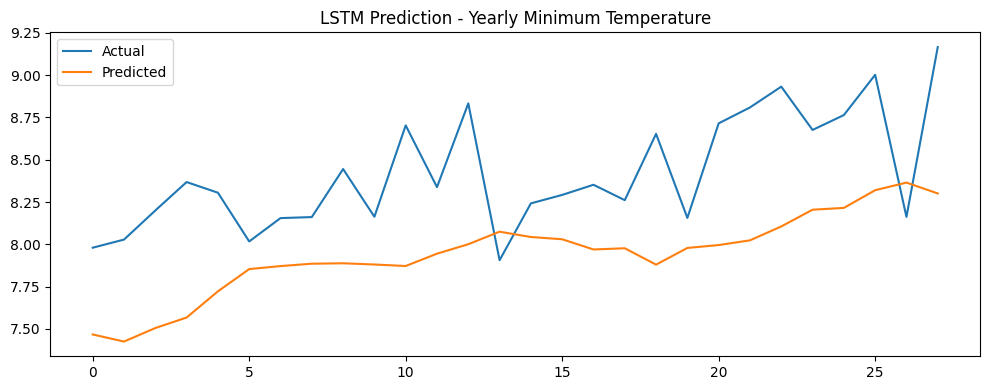

Epoch 1/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - loss: 0.1789
Epoch 2/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.1631 
Epoch 3/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.1574 
Epoch 4/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.1369 
Epoch 5/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.1447 
Epoch 6/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.1225 
Epoch 7/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.1085 
Epoch 8/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0844 
Epoch 9/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0696 
Epoch 10/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0608 
Epoch 11/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0483 
Epoch 12/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0317 
Epoch 13/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0186 
Epoch 14/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0130 
Epoch 15/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0167 
Epoch 16/50
3/3 ━━━━━━━━━━━━━━━━━━━

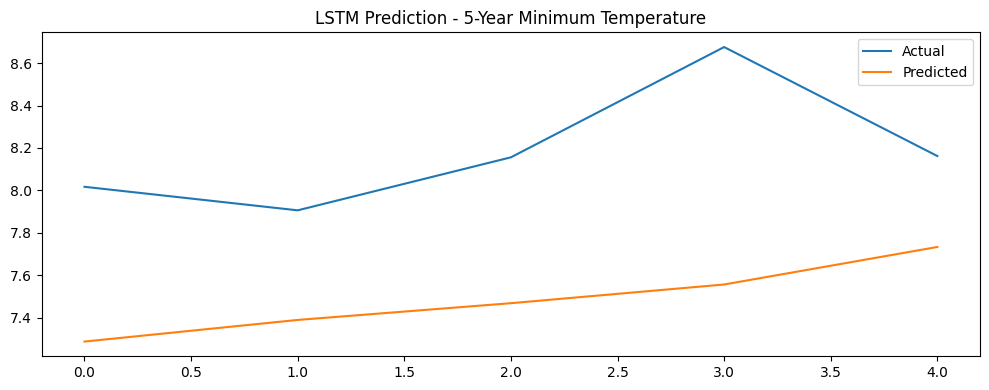

<Sequential name=sequential_64, built=True>

In [88]:
# Yearly model
train_lstm_on_series(df_yearly_min['Temperature'], label="Yearly Minimum Temperature")

# 5-Year model
train_lstm_on_series(df_5year_min['Temperature'], label="5-Year Minimum Temperature")


Epoch 1/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - loss: 0.2356
Epoch 2/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0898
Epoch 3/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0269
Epoch 4/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0221
Epoch 5/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0206
Epoch 6/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0124
Epoch 7/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0119 
Epoch 8/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0134
Epoch 9/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0163
Epoch 10/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0109
Epoch 11/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0115
Epoch 12/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0124
Epoch 13/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0135
Epoch 14/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0166
Epoch 15/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0116
Epoch 16/50
18/18 

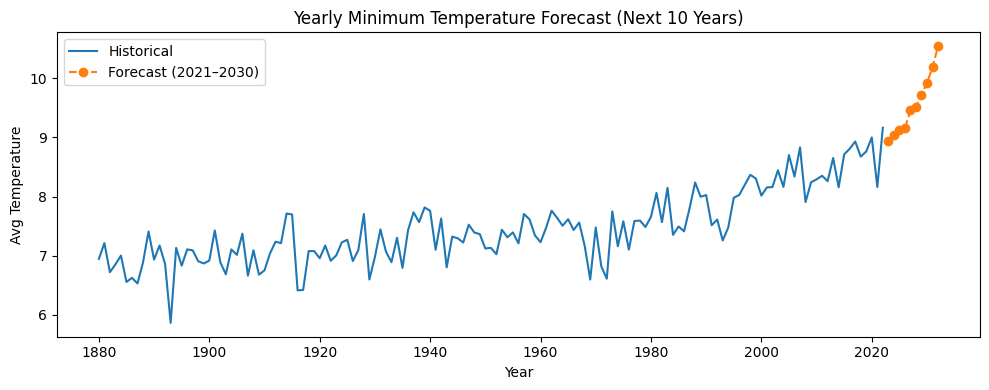


Forecasted Temperatures (2021–2030):
   Year  Predicted Temperature
0  2023               8.935863
1  2024               9.038712
2  2025               9.123278
3  2026               9.156614
4  2027               9.458780
5  2028               9.522698
6  2029               9.716677
7  2030               9.926160
8  2031              10.185328
9  2032              10.545403


In [89]:
# Train on full data for forecasting
scaler = MinMaxScaler()
series_scaled = scaler.fit_transform(df_yearly_min['Temperature'].values.reshape(-1, 1))

# Re-train model on entire dataset
X_full, y_full = create_sequences(series_scaled, seq_length=5)
X_full = X_full.reshape((X_full.shape[0], X_full.shape[1], 1))
model_full = Sequential([
    LSTM(50, activation='relu', return_sequences=True, input_shape=(5, 1)),
    LSTM(50, activation='relu'),
    Dense(1)
])
model_full.compile(optimizer='adam', loss='mse')
model_full.fit(X_full, y_full, epochs=50, batch_size=8, verbose=1)

# Forecast next 10 years
future_years = list(range(df_yearly_min['Year'].iloc[-1] + 1, df_yearly_min['Year'].iloc[-1] + 11))
future_predictions = forecast_future(model_full, df_yearly_min['Temperature'], 10, scaler)

# Plot
plt.figure(figsize=(10, 4))
plt.plot(df_yearly_min['Year'], df_yearly_min['Temperature'], label='Historical')
plt.plot(future_years, future_predictions, label='Forecast (2021–2030)', linestyle='--', marker='o')
plt.xlabel("Year")
plt.ylabel("Avg Temperature")
plt.title("Yearly Minimum Temperature Forecast (Next 10 Years)")
plt.legend()
plt.tight_layout()
plt.show()

# Print values
forecast_df = pd.DataFrame({'Year': future_years, 'Predicted Temperature': future_predictions})
print("\nForecasted Temperatures (2021–2030):")
print(forecast_df)


In [90]:

from sklearn.metrics import mean_absolute_error, mean_squared_error
import numpy as np

# Predict on training data
train_predictions = model_full.predict(X_full)

# Inverse transform both predictions and actual values
train_predictions_inverse = scaler.inverse_transform(train_predictions)
y_full_inverse = scaler.inverse_transform(y_full.reshape(-1, 1))

# Compute MAE and RMSE
mae = mean_absolute_error(y_full_inverse, train_predictions_inverse)
rmse = np.sqrt(mean_squared_error(y_full_inverse, train_predictions_inverse))

print(f"\nTraining MAE: {mae:.4f}")
print(f"Training RMSE: {rmse:.4f}")


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step  

Training MAE: 0.2857
Training RMSE: 0.3657


In [ ]:
# Filter data for the last decade
last_decade_df = df[(df['Year'] >= 2010) & (df['Year'] < 2020)].copy()

# Normalize temperature
scaler = MinMaxScaler(feature_range=(0, 1))
last_decade_df['Temperature_Scaled'] = scaler.fit_transform(last_decade_df[['Temperature']])

# Prepare sequences
seq_length = 30
data = last_decade_df['Temperature_Scaled'].values

# Use last 30 days for prediction
last_sequence = data[-seq_length:].reshape(1, seq_length, 1)

# Load your last trained model (or retrain here if needed)

# Forecast next 10 days recursively
future_predictions = []

current_sequence = last_sequence.copy()

for _ in range(10):
    next_pred = model.predict(current_sequence)[0, 0]
    future_predictions.append(next_pred)

    # Update the sequence with the new prediction
    current_sequence = np.append(current_sequence[:, 1:, :], [[[next_pred]]], axis=1)

# Inverse transform predictions to original scale
future_predictions_actual = scaler.inverse_transform(np.array(future_predictions).reshape(-1, 1))

# Show predictions
for i, temp in enumerate(future_predictions_actual.flatten(), start=1):
    print(f"Day {i}: Predicted Temp = {temp:.3f}°C")

# Plotting
plt.figure(figsize=(10, 4))
plt.plot(range(1, 11), future_predictions_actual, marker='o', linestyle='--')
plt.title("LSTM Forecast: Next 10 Days of Temperature")
plt.xlabel("Day")
plt.ylabel("Predicted Temperature (°C)")
plt.grid(True)
plt.tight_layout()
plt.show()


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_absolute_error, mean_squared_error
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split

# Set group size to 35 years
group_size = 35
start_year = 1880
end_year = 2020

def adf_test(series):
    result = adfuller(series.dropna())
    print(f"ADF Statistic: {result[0]}")
    print(f"p-value: {result[1]}")
    if result[1] > 0.05:
        print("Non-stationary series (p > 0.05)")
    else:
        print("Stationary series (p <= 0.05)")

def create_sequences(data, seq_length=30):
    X, y = [], []
    for i in range(len(data) - seq_length):
        X.append(data[i:i+seq_length])
        y.append(data[i+seq_length])
    return np.array(X), np.array(y)

mae_rmse_results = []

for start in range(start_year, end_year, group_size):
    df_group = df[(df['Year'] >= start) & (df['Year'] < start + group_size)].copy()
    if df_group.empty:
        continue

    print(f"\nAnalyzing period: {start}-{start + group_size}")

    # Normalize Data
    scaler = MinMaxScaler(feature_range=(0,1))
    df_group['Temperature_Scaled'] = scaler.fit_transform(df_group[['Temperature']])
    
    # Prepare Sequences for LSTM
    seq_length = 30
    X, y = create_sequences(df_group['Temperature_Scaled'].values, seq_length)
    
    # Reshape input for LSTM
    X = X.reshape((X.shape[0], X.shape[1], 1))
    
    # Train-Test Split
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=False)
    
    # Build LSTM Model
    model = Sequential([
        LSTM(50, activation='relu', return_sequences=True, input_shape=(seq_length, 1)),
        LSTM(50, activation='relu'),
        Dense(1)
    ])
    
    model.compile(optimizer='adam', loss='mse')
    
    # Train Model
    model.fit(X_train, y_train, epochs=20, batch_size=16, verbose=1)
    
    # Predictions
    y_pred_lstm = model.predict(X_test)
    y_pred_lstm = scaler.inverse_transform(y_pred_lstm)
    
    # Evaluate Performance
    mae_lstm = mean_absolute_error(scaler.inverse_transform(y_test.reshape(-1,1)), y_pred_lstm)
    rmse_lstm = np.sqrt(mean_squared_error(scaler.inverse_transform(y_test.reshape(-1,1)), y_pred_lstm))
    
    mae_rmse_results.append([f"{start}-{start + group_size}", mae_lstm, rmse_lstm])
    print(f'LSTM MAE ({start}-{start + group_size}): {mae_lstm:.4f}, RMSE: {rmse_lstm:.4f}')

# Create DataFrame for results
results_df = pd.DataFrame(mae_rmse_results, columns=["Time Period", "MAE", "RMSE"])
print(results_df)

# Plot Results
plt.figure(figsize=(12, 6))
plt.plot(results_df["Time Period"], results_df["MAE"], marker='o', label="MAE")
plt.plot(results_df["Time Period"], results_df["RMSE"], marker='s', label="RMSE")
plt.xlabel("Time Period")
plt.ylabel("Error Value")
plt.title("MAE and RMSE for Each 35-Year Group")
plt.xticks(rotation=45)
plt.legend()
plt.tight_layout()
plt.show()


Model	MAE (Lower is better)	RMSE (Lower is better)	Pros	                                         Cons
ARIMA	0.3038,                 0.3772	              Works well for small data, interpretable	Fails for non-linear patterns
LSTM	0.1130,                 0.1429	              Captures complex relationships, good for long-term forecasting	Computationally expensive, needs large data

In [ ]:
from statsmodels.tsa.seasonal import seasonal_decompose

# Decompose the time series
decomposition = seasonal_decompose(df['Temperature'], model='additive', period=365)  # Assuming yearly seasonality

# Plot components
fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(14,8))
decomposition.trend.plot(ax=ax1, title='Trend')
decomposition.seasonal.plot(ax=ax2, title='Seasonality')
decomposition.resid.plot(ax=ax3, title='Residuals')
plt.tight_layout()
plt.show()


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_absolute_error, mean_squared_error
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from statsmodels.tsa.seasonal import seasonal_decompose

group_size = 20
start_year = 1880
end_year = 2020

def adf_test(series):
    result = adfuller(series.dropna())
    print(f"ADF Statistic: {result[0]}")
    print(f"p-value: {result[1]}")
    if result[1] > 0.05:
        print("Non-stationary series (p > 0.05)")
    else:
        print("Stationary series (p <= 0.05)")

def create_sequences(data, seq_length=10):
    X, y = [], []
    for i in range(len(data) - seq_length):
        X.append(data[i:i+seq_length])
        y.append(data[i+seq_length])
    return np.array(X), np.array(y)

mae_rmse_results = []

for start in range(start_year, end_year, group_size):
    df_group = df[(df['Year'] >= start) & (df['Year'] < start + group_size)].copy()
    print(f"Analyzing period: {start}-{start + group_size}")
    
    # Decomposition
    decomposition = seasonal_decompose(df_group['Temperature'], model='additive', period=365)
    fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(14,8))
    decomposition.trend.plot(ax=ax1, title='Trend')
    decomposition.seasonal.plot(ax=ax2, title='Seasonality')
    decomposition.resid.plot(ax=ax3, title='Residuals')
    plt.tight_layout()
    plt.show()
    
    # Normalize Data
    scaler = MinMaxScaler(feature_range=(0,1))
    df_group['Temperature_Scaled'] = scaler.fit_transform(df_group[['Temperature']])
    
    # Prepare Sequences for LSTM
    seq_length = 30  # Using 30 days of past data
    X, y = create_sequences(df_group['Temperature_Scaled'].values, seq_length)
    
    # Train-Test Split
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=False)
    
    # Build LSTM Model
    model = Sequential([
        LSTM(50, activation='relu', return_sequences=True, input_shape=(seq_length, 1)),
        LSTM(50, activation='relu'),
        Dense(1)
    ])
    
    model.compile(optimizer='adam', loss='mse')
    
    # Train Model
    model.fit(X_train, y_train, epochs=20, batch_size=16, verbose=1)
    
    # Predictions
    y_pred_lstm = model.predict(X_test)
    y_pred_lstm = scaler.inverse_transform(y_pred_lstm)
    
    # Evaluate Performance
    mae_lstm = mean_absolute_error(scaler.inverse_transform(y_test.reshape(-1,1)), y_pred_lstm)
    rmse_lstm = np.sqrt(mean_squared_error(scaler.inverse_transform(y_test.reshape(-1,1)), y_pred_lstm))
    
    mae_rmse_results.append([f"{start}-{start + group_size}", mae_lstm, rmse_lstm])
    print(f'LSTM MAE ({start}-{start + group_size}): {mae_lstm:.4f}, RMSE: {rmse_lstm:.4f}')

# Create DataFrame for results
results_df = pd.DataFrame(mae_rmse_results, columns=["Time Period", "MAE", "RMSE"])
print(results_df)

# Plot Results
plt.figure(figsize=(12, 6))
plt.plot(results_df["Time Period"], results_df["MAE"], marker='o', label="MAE")
plt.plot(results_df["Time Period"], results_df["RMSE"], marker='s', label="RMSE")
plt.xlabel("Time Period")
plt.ylabel("Error Value")
plt.title("MAE and RMSE for Each 10-Year Group")
plt.xticks(rotation=45)
plt.legend()
plt.show()


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_absolute_error, mean_squared_error
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from statsmodels.tsa.seasonal import seasonal_decompose

group_size = 35
start_year = 1880
end_year = 2020

def adf_test(series):
    result = adfuller(series.dropna())
    print(f"ADF Statistic: {result[0]}")
    print(f"p-value: {result[1]}")
    if result[1] > 0.05:
        print("Non-stationary series (p > 0.05)")
    else:
        print("Stationary series (p <= 0.05)")

def create_sequences(data, seq_length=10):
    X, y = [], []
    for i in range(len(data) - seq_length):
        X.append(data[i:i+seq_length])
        y.append(data[i+seq_length])
    return np.array(X), np.array(y)

mae_rmse_results = []

for start in range(start_year, end_year, group_size):
    df_group = df[(df['Year'] >= start) & (df['Year'] < start + group_size)].copy()
    print(f"Analyzing period: {start}-{start + group_size}")
    
    # Decomposition
    decomposition = seasonal_decompose(df_group['Temperature'], model='additive', period=365)
    fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(14,8))
    decomposition.trend.plot(ax=ax1, title='Trend')
    decomposition.seasonal.plot(ax=ax2, title='Seasonality')
    decomposition.resid.plot(ax=ax3, title='Residuals')
    plt.tight_layout()
    plt.show()
    
    # Normalize Data
    scaler = MinMaxScaler(feature_range=(0,1))
    df_group['Temperature_Scaled'] = scaler.fit_transform(df_group[['Temperature']])
    
    # Prepare Sequences for LSTM
    seq_length = 30  # Using 30 days of past data
    X, y = create_sequences(df_group['Temperature_Scaled'].values, seq_length)
    
    # Train-Test Split
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=False)
    
    # Build LSTM Model
    model = Sequential([
        LSTM(50, activation='relu', return_sequences=True, input_shape=(seq_length, 1)),
        LSTM(50, activation='relu'),
        Dense(1)
    ])
    
    model.compile(optimizer='adam', loss='mse')
    
    # Train Model
    model.fit(X_train, y_train, epochs=20, batch_size=16, verbose=1)
    
    # Predictions
    y_pred_lstm = model.predict(X_test)
    y_pred_lstm = scaler.inverse_transform(y_pred_lstm)
    
    # Evaluate Performance
    mae_lstm = mean_absolute_error(scaler.inverse_transform(y_test.reshape(-1,1)), y_pred_lstm)
    rmse_lstm = np.sqrt(mean_squared_error(scaler.inverse_transform(y_test.reshape(-1,1)), y_pred_lstm))
    
    mae_rmse_results.append([f"{start}-{start + group_size}", mae_lstm, rmse_lstm])
    print(f'LSTM MAE ({start}-{start + group_size}): {mae_lstm:.4f}, RMSE: {rmse_lstm:.4f}')

# Create DataFrame for results
results_df = pd.DataFrame(mae_rmse_results, columns=["Time Period", "MAE", "RMSE"])
print(results_df)

# Plot Results
plt.figure(figsize=(12, 6))
plt.plot(results_df["Time Period"], results_df["MAE"], marker='o', label="MAE")
plt.plot(results_df["Time Period"], results_df["RMSE"], marker='s', label="RMSE")
plt.xlabel("Time Period")
plt.ylabel("Error Value")
plt.title("MAE and RMSE for Each 10-Year Group")
plt.xticks(rotation=45)
plt.legend()
plt.show()


In [ ]:
from statsmodels.graphics.tsaplots import plot_acf

# ACF Plot
plt.figure(figsize=(10,5))
plot_acf(df['Temperature'], lags=365)
plt.title("Autocorrelation Function (ACF) Plot")
plt.show()


In [ ]:
import seaborn as sns

df['Month'] = df.index.month  # Extract month
plt.figure(figsize=(12,6))
sns.boxplot(x='Month', y='Temperature', data=df)
plt.title("Monthly Temperature Variation")
plt.xlabel("Month")
plt.ylabel("Temperature")
plt.show()


# Forecasting 

In [ ]:
combined_df = results_df.copy()
combined_df['ARIMA_MAE'] = results_arima_df['MAE']
combined_df['ARIMA_RMSE'] = results_arima_df['RMSE']

plt.figure(figsize=(14, 6))
plt.plot(combined_df['Time Period'], combined_df['MAE'], label='LSTM MAE', marker='o')
plt.plot(combined_df['Time Period'], combined_df['ARIMA_MAE'], label='ARIMA MAE', marker='s')
plt.plot(combined_df['Time Period'], combined_df['RMSE'], label='LSTM RMSE', marker='o', linestyle='--')
plt.plot(combined_df['Time Period'], combined_df['ARIMA_RMSE'], label='ARIMA RMSE', marker='s', linestyle='--')
plt.xticks(rotation=45)
plt.title("Model Performance Comparison: LSTM vs. ARIMA")
plt.xlabel("Time Period")
plt.ylabel("Error")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [ ]:
# Fit ARIMA on entire dataset
model_arima = ARIMA(df['Temperature'], order=(5,1,2))
result_arima = model_arima.fit()

# Forecast next 30 days
forecast_arima = result_arima.forecast(steps=30)

# Plot
plt.figure(figsize=(10, 5))
plt.plot(df['Temperature'], label='Original')
plt.plot(pd.date_range(df.index[-1], periods=30, freq='D'), forecast_arima, label='ARIMA Forecast', color='green')
plt.title("ARIMA Forecast for Next 30 Days")
plt.xlabel("Date")
plt.ylabel("Temperature")
plt.legend()
plt.show()
